In [90]:
import pandas as pd
import numpy as np
import sys
from datetime import datetime
import time
from collections import defaultdict
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from math import log
from collections import Counter
import re
import os, sys, email,re
import numpy as np 
import pandas as pd
# Plotting
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns; sns.set_style('whitegrid')
# Network analysis
import networkx as nx
# NLP
from nltk.tokenize.regexp import RegexpTokenizer
from subprocess import check_output
# Network analysis
import networkx as nx
# NLP
from nltk.tokenize.regexp import RegexpTokenizer
from subprocess import check_output
import os, sys, email,re
import numpy as np 
import pandas as pd
import seaborn as sns; sns.set_style('whitegrid')
#import wordcloud
import networkx as nx
from nltk.tokenize.regexp import RegexpTokenizer
from subprocess import check_output
from sklearn.feature_extraction.text import TfidfVectorizer
import nltk
import gensim
from gensim import corpora
from nltk.corpus import stopwords 
from nltk.stem.wordnet import WordNetLemmatizer
import string
from nltk.stem.porter import PorterStemmer
%matplotlib inline
%pylab inline
from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.lda import LDA
from sklearn.decomposition import LatentDirichletAllocation
import random
import email
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.linear_model import LogisticRegression, SGDClassifier, Ridge
from sklearn import metrics 
from sklearn.feature_selection import SelectFromModel
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.cross_validation import cross_val_score
from sklearn.grid_search import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.cross_validation import train_test_split
from sklearn.decomposition import TruncatedSVD
from scipy.sparse import coo_matrix, hstack
import glmnet_python
from glmnet import glmnet
from sklearn.metrics import mean_squared_error
from scipy import stats
from sklearn import datasets
from sklearn.multiclass import OneVsOneClassifier
from sklearn.svm import LinearSVC
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import SGDRegressor

Populating the interactive namespace from numpy and matplotlib


C:\Users\aemelyanova\AppData\Local\Continuum\Anaconda3\lib\site-packages\IPython\core\magics\pylab.py:161: UserWarning: pylab import has clobbered these variables: ['datetime', 'log', 'hstack', 'random']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [82]:
def classification_model(X, y, C, Y = False):
    data_train, data_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state = 1)
    X_train = data_train
    X_test = data_test

    model = LogisticRegression(C = C, penalty='l1', random_state=True)
    y_pred = model.fit(X_train, y_train).predict(X_test)
    coef = model.coef_
    score = metrics.accuracy_score(y_test, y_pred)
    print('score', score)

    print(classification_report(y_test, y_pred))

    print('cross_validation_score', cross_val_score(LogisticRegression(penalty='l1', C = C, intercept_scaling=1, 
                                                            random_state = True), X, y, cv=4, scoring='accuracy').mean())
    if Y:
        return (y_pred, y_test)
    
    
def regression_model(X, y, alpha):
    data_train, data_test, y_train, y_test = train_test_split(X, y , test_size=0.25, random_state = True)
    X_train = data_train
    X_test = data_test

    reg = Ridge(alpha=alpha)
    y_reg = reg.fit(X_train, y_train).predict(X_test)
    coef = reg.coef_
    print(metrics.mean_squared_error(y_test, y_reg))

    figure(figsize=(6, 6))
    df_score = pd.DataFrame()
    df_score['y_test'] = y_test 
    df_score['y_pred'] = y_reg
    df_score = df_score.sort_values(by = 'y_test')
    plt.plot(range(len(df_score)), df_score['y_pred'], 'o', linewidth=2.0)
    plt.plot(range(len(df_score)), df_score['y_test'], 'o', linewidth=4.0)
    
    print('cross_validation_score', cross_val_score(reg, 
                                                    X, y, cv=4, scoring='mean_squared_error').mean())

In [83]:
emails_df = pd.read_csv('emails_dataset_2000.csv')
#emails_df = emails_df.drop('Unnamed: 0', axis = 1)
emails_df['Date'] = pd.to_datetime(emails_df['Date'])
emails_df['To'] = emails_df['To'].apply(lambda x: frozenset(x[1:-1].split(',')))
emails_df['From'] = emails_df['From'].apply(lambda x: frozenset(x[1:-1].split(',')))
#emails_df = emails_df.dropna()
emails_df.head()

,Date,From,To,Subject,content,TimeAll,Year,clean_content,weigh_content,Index,Number_of_thread
0,2000-01-01 14:36:00,"(rozenset({""'sally.beck@enron.com'""})","(rozenset({""'fernley.dyson@enron.com'""})",happy new year - no y2k fear!,We are wrapping up several hours in the office...,946726560.0,2000,wrapping several hour office tested commodity ...,0.406400,0,31817
1,2000-01-01 19:17:00,"(rozenset({""'lenos@ucy.ac.cy'""})","(rozenset({""'gordon.sick@rogroup.com'""})",program attached; march ny ro conference/parti...,The current version of the conference program ...,946743420.0,2000,current version conference program attached pl...,0.186760,1,196
2,2000-01-02 13:12:00,"(rozenset({""'andrew.parsons@enron.com'""})","( "" 'mark.koenig@enron.com'"", "" 'mike.mcconne...",summary of y2k glitches,Following please find a summary of the minor Y...,946807920.0,2000,following please find summary minor related gl...,0.950536,2,2276
3,2000-01-03 06:17:00,"(rozenset({""'emoler@velaw.com'""})","( "" 'cynthia.sandherr@enron.com'""}, rozenset({...",options memo,Here's the options memo you requested. Happy ...,946869420.0,2000,option memo requested happy new year betsy doc...,0.000000,3,14978
4,2000-01-03 08:20:00,"(rozenset({""'steven.kean@enron.com'""})","(rozenset({""'maureen.mcvicker@enron.com'""})",additions to working groups,yes -- just make sure the working group lead...,946876800.0,2000,yes make sure working group leader know mauree...,-0.324299,4,47838


In [84]:
def count_threads(n):
    df_threads = emails_df[emails_df['Number_of_thread'] == n]
    return len(df_threads)
    
emails_df['count_threads'] = emails_df['Number_of_thread'].apply(lambda x: count_threads(x))
df_threads = emails_df[(emails_df['count_threads'] > 1) & (emails_df['Number_of_thread'] != 0)]

In [85]:
len(df_threads)

17415

In [86]:
len(set(df_threads.Number_of_thread))

6822

In [87]:
def answer_not(From):
    if len(set(From)) == 1:
        return 0
    else:
        return 1
dict_threads_answer = {}    
for n in list(set(df_threads.Number_of_thread)):
    if n == 0:
        continue
    df = df_threads[df_threads.Number_of_thread == n]
    dict_threads_answer[n] = answer_not(list(df['From']))

df_threads['answer'] = df_threads['Number_of_thread'].apply(lambda x: dict_threads_answer[x])
df_threads = df_threads[df_threads['answer'] == 1]
df_threads = df_threads.dropna()

C:\Users\aemelyanova\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  del sys.path[0]


In [88]:
dict_tail = {}
for n in emails_df.Number_of_thread:
    df = emails_df[emails_df.Number_of_thread == n]
    for l, ind in zip(reversed(range(len(df))), df.Index.values):
        dict_tail[ind] = l
df_threads['tail'] = df_threads['Index'].apply(lambda x: dict_tail[x])        

In [89]:
len(df_threads)

7818

#### TFidf

In [11]:
vect = TfidfVectorizer(sublinear_tf=True, use_idf=True, ngram_range=(1, 3))
X = vect.fit_transform(df_threads['clean_content'].values)
y = df_threads['tail'].values
feature = vect.get_feature_names()

1.70483092567


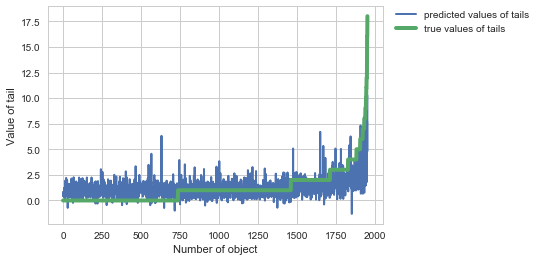

In [8]:
data_train, data_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state = True)
vect = TfidfVectorizer(sublinear_tf=True, use_idf=True)
X_train = data_train
X_test = data_test

reg = Ridge(alpha = 0.06, tol = 0.002)
y_reg = reg.fit(X_train, y_train).predict(X_test)
coef = reg.coef_
print(metrics.mean_squared_error(y_test, y_reg))

df_score = pd.DataFrame()
df_score['y_test'] = y_test
df_score['y_pred'] = y_reg
df_score = df_score.sort_values(by = 'y_test')
plt.plot(range(len(df_score)), df_score['y_pred'], '-', linewidth=2.0, label = 'predicted values of tails')
plt.plot(range(len(df_score)), df_score['y_test'], '-', linewidth=4.0, label = 'true values of tails')
plt.xlabel('Number of object')
plt.ylabel('Value of tail')
plt.legend(bbox_to_anchor=(1.45, 1.), loc=0, ncol=1, borderaxespad=0.)

In [9]:
df = pd.DataFrame()
df['featurs'] = list(feature)
df['coef'] = list(coef)
df = df.sort_values(by = 'coef', ascending=False)
df

,featurs,coef
148987,dianna broker,6.851483
404141,peak,5.784549
140689,dede,5.325753
148984,dianna,5.094658
487853,see court,4.841717
288607,jeff broker,4.692137
121825,court,4.603037
414157,play,4.552545
288609,jeff broker jan,4.284988
62185,broker jan,4.284988


In [10]:
df.to_csv('phrases_tail_ridge.csv', index = False)

In [116]:
df_threads['coef'] = df_threads['clean_content'].apply(lambda x: fun(x))

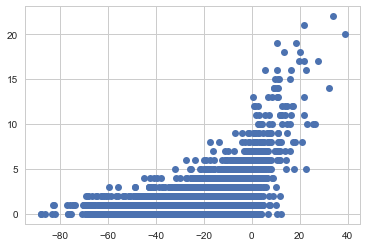

In [117]:
plt.plot(df_threads['coef'].values, df_threads['tail'], 'o')
plt.show()

LinearRegression

3.39747050531


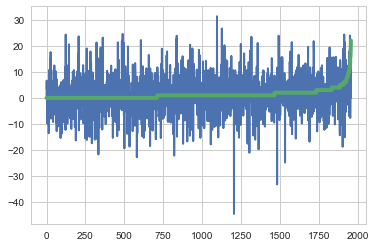

In [240]:
lr = linear_model.LinearRegression()
y_pred = lr.fit(X_train, y_train).predict(X_test)
coef = lr.coef_

print(metrics.median_absolute_error(y_test, y_pred))

df_score = pd.DataFrame()
df_score['y_test'] = y_test
df_score['y_pred'] = y_pred
df_score = df_score.sort_values(by = 'y_test')
plt.plot(range(len(df_score)), df_score['y_pred'], '-', linewidth=2.0)
plt.plot(range(len(df_score)), df_score['y_test'], '-', linewidth=4.0)

BayesianRidge

In [165]:
ba = linear_model.BayesianRidge()
y_ba = ba.fit(X_train, y_train).predict(X_test_pca)
coef = ba.coef_
print(mean_squared_error(y_test, y_ba))

3.81463342695


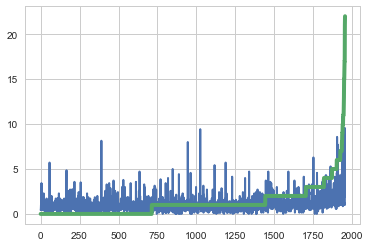

In [199]:
df_score = pd.DataFrame()
df_score['y_test'] = y_test
df_score['y_pred'] = y_ba
df_score = df_score.sort_values(by = 'y_test')
plt.plot(range(len(df_score)), df_score['y_pred'], '-', linewidth=2.0)
plt.plot(range(len(df_score)), df_score['y_test'], '-', linewidth=4.0)

RandomForestRegression

In [172]:
ba = RandomForestRegressor(n_estimators=7)
y_ba = ba.fit(X_train, y_train)
y_ba = ba.predict(X_test)
print(mean_squared_error(y_test, y_ba))

2.92589612068


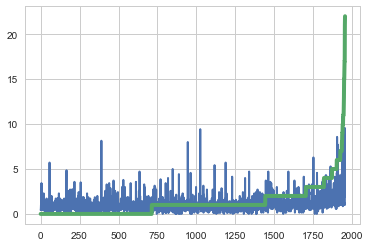

In [173]:
df_score = pd.DataFrame()
df_score['y_test'] = y_test
df_score['y_pred'] = y_ba
df_score = df_score.sort_values(by = 'y_test')
plt.plot(range(len(df_score)), df_score['y_pred'], '-', linewidth=2.0)
plt.plot(range(len(df_score)), df_score['y_test'], '-', linewidth=4.0)

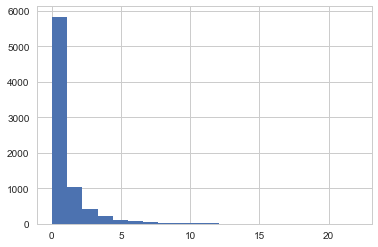

In [182]:
plt.hist(df_threads['tail'], bins = 20)
plt.show()

In [183]:
df_threads['tail'].describe()

count    7824.000000
mean        1.211273
std         1.751527
min         0.000000
25%         0.000000
50%         1.000000
75%         2.000000
max        22.000000
Name: tail, dtype: float64

In [184]:
def to_norm(data):
    data = data
    res = stats.boxcox(data)
    lambda_ = res[1]
    data_norm = res[0]
    return (data_norm, lambda_)

In [147]:
df_threads['tail'] = df_threads['tail'].apply(lambda x: x+0.01)

In [150]:
df_threads['tail_norm'] =  stats.boxcox(df_threads['tail'])[0]

In [154]:
l = stats.boxcox(df_threads['tail'])[1]
l

0.16619343744235238

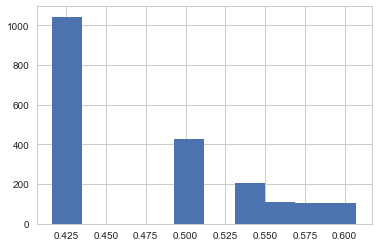

In [161]:
plt.hist(df_threads['tail_norm'])
plt.show()

3.81714757606


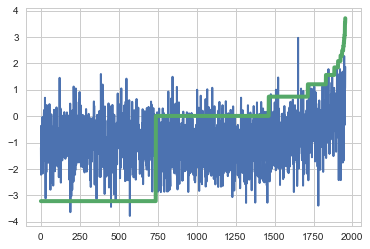

In [163]:
vect = TfidfVectorizer(sublinear_tf=True, use_idf=True)
X = vect.fit_transform(df_threads['clean_content'].values)
y = df_threads['tail_norm'].values
feature = vect.get_feature_names()

data_train, data_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state = True)
vect = TfidfVectorizer(sublinear_tf=True, use_idf=True)
X_train = data_train
X_test = data_test

reg = Ridge(alpha = 0.8, tol = 0.003)
y_reg = reg.fit(X_train, y_train).predict(X_test)
coef = reg.coef_
print(metrics.mean_squared_error(y_test, y_reg))

df_score = pd.DataFrame()
df_score['y_test'] = y_test
df_score['y_pred'] = y_reg
df_score = df_score.sort_values(by = 'y_test')
plt.plot(range(len(df_score)), df_score['y_pred'], '-', linewidth=2.0)
plt.plot(range(len(df_score)), df_score['y_test'], '-', linewidth=4.0)

In [166]:
y = np.array(df_threads['tail'].values)
vect = TfidfVectorizer(sublinear_tf=True, use_idf=True)
X = vect.fit_transform(df_threads['clean_content'].values).toarray()

classification_model(X, y, C = 0.45)

ValueError: Unknown label type: 'continuous'

In [ ]:
def cat_tail(tail):
    if tail<=5:
        return 1

    if tail>5 and tail<=10:
        return 2
    else:
        return 3
    
df_threads['cat_tail'] = df_threads['tail'].apply(lambda x: cat_tail(x))

In [308]:
Counter(df_threads['cat_tail'])

Counter({1: 5823, 2: 1677, 3: 318})

In [92]:
def cat_tail(tail):
    if tail<=3:
        return 1
    if tail>3 and tail<=8:
        return 2
    else:
        return 3
    
df_threads['cat_tail'] = df_threads['tail'].apply(lambda x: cat_tail(x))

In [93]:
y = [int(x) for x in df_threads['cat_tail'].values]
vect = TfidfVectorizer(sublinear_tf=True, use_idf=True)
X = vect.fit_transform(df_threads['clean_content'].values).toarray()

data_train, data_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state = 1)
X_train = data_train
X_test = data_test

model = LogisticRegression(C = 5, penalty='l2', random_state=True)
y_pred = model.fit(X_train, y_train).predict(X_test)
coef = model.coef_
score = metrics.accuracy_score(y_test, y_pred)
print('score', score)

print(classification_report(y_test, y_pred))
print('cross_validation_score', cross_val_score(LogisticRegression(penalty='l1', C = 1, intercept_scaling=1, 
                                                            random_state = True), X, y, cv=4, scoring='accuracy').mean())

score 0.939130434783
             precision    recall  f1-score   support

          1       0.94      1.00      0.97      1830
          2       0.86      0.05      0.10       111
          3       0.50      0.07      0.12        14

avg / total       0.93      0.94      0.91      1955

cross_validation_score 0.931823827836


In [55]:
y = [int(x) for x in df_threads['cat_tail'].values]
vect = TfidfVectorizer(sublinear_tf=True, use_idf=True)
X = vect.fit_transform(df_threads['clean_content'].values).toarray()
#X = PCA(n_components=132).fit_transform(X)

data_train, data_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state = 1)
X_train = data_train
X_test = data_test

model = SVC(kernel="poly", coef0=2, decision_function_shape="ovr")
y_pred = model.fit(X_train, y_train).predict(X_test)
score = metrics.accuracy_score(y_test, y_pred)
print('score', score)

print(classification_report(y_test, y_pred))

score 0.96368286445
             precision    recall  f1-score   support

          1       0.96      1.00      0.98      1884
          2       0.00      0.00      0.00        63
          3       0.00      0.00      0.00         8

avg / total       0.93      0.96      0.95      1955



C:\Users\aemelyanova\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1113: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [38]:
def best(n, k, C, c1, c2, c3):
    def cat_tail(tail):
        if tail<=n:
            return 1
        if tail>n and tail<=k:
            return 2
        else:
            return 3
        
    df_threads['cat_tail'] = df_threads['tail'].apply(lambda x: cat_tail(x))

    y = [int(x) for x in df_threads['cat_tail'].values]
    vect = TfidfVectorizer(sublinear_tf=True, use_idf=True, ngram_range=(1, 3))
    X = vect.fit_transform(df_threads['clean_content'].values).toarray()


    data_train, data_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 1)
    X_train = data_train
    X_test = data_test


    model = LogisticRegression(C = C, penalty='l2', random_state=1, solver='newton-cg',
                               class_weight={1:c1, 1:c2, 3:c3}, multi_class='ovr')
    y_pred = model.fit(X_train, y_train).predict(X_test)
    coef = model.coef_
    score = metrics.accuracy_score(y_test, y_pred)
    #f_metric = metrics.f1_score(y_test, y_pred)
    
    print('score', score, ":n=", n, "k=", k, "C=", C, 'c1, c2, c3:', c1, c2, c3)
    print(classification_report(y_test, y_pred))
    print('\n')


In [ ]:
n_list = [2, 3, 4, 5, 6]
k_list = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
C_list = [4, 5, 6, 7, 8, 9, 10, 11]
c1_list = [0.5, 1, 1.5, 2, 2.5, 3]
c2_list = [0.5, 1, 1.5, 2, 2.5, 3]
c3_list = [0.5, 1, 1.5, 2, 2.5, 3]

for n in n_list:
    for k in k_list:
        if k <= n:
            continue
        for c in C_list:
            best(n, k, c, c1=1, c2=1, c3=1)

In [94]:
def cat_tail(tail):
    if tail<=4:
        return 1
    if tail>4 and tail<=9:
        return 2
    else:
        return 3

df_threads['cat_tail'] = df_threads['tail'].apply(lambda x: cat_tail(x))
y = [int(x) for x in df_threads['cat_tail'].values]
vect = TfidfVectorizer(sublinear_tf=True, use_idf=True, ngram_range=(2, 3))
X = vect.fit_transform(df_threads['clean_content'].values)
feature = vect.get_feature_names()

data_train, data_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 1)
X_train = data_train
X_test = data_test

model = LogisticRegression(C = 10, penalty='l2', class_weight={1:1, 2:25, 3:25}, random_state=1, solver='lbfgs', multi_class='ovr')
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)
coef = model.coef_

print(metrics.accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(metrics.log_loss(np.array(y_test), np.array(y_pred_proba)))

0.964620630861
             precision    recall  f1-score   support

          1       0.97      0.99      0.98      2250
          2       0.56      0.34      0.43        79
          3       0.82      0.53      0.64        17

avg / total       0.96      0.96      0.96      2346

0.138229507491


In [81]:
df1.to_csv('df3.csv', index = False)

In [76]:
df1 = pd.DataFrame()
df1['featurs'] = list(feature)
df1['coef0'] = list(coef[0])
df1 = df1.sort_values(by = 'coef0', ascending=False)
df1

,featurs,coef0
252770,hou ect,3.739331
178760,enron enron,3.368383
159244,ect ect,3.156935
252863,hou ect ect,3.115393
111173,corp enron,2.718297
176713,enron com,2.385315
111212,corp enron enron,2.354401
463373,sara shackleton,2.307177
311131,lon ect,2.214317
311144,lon ect ect,1.993431


In [78]:
df1 = pd.DataFrame()
df1['featurs'] = list(feature)
df1['coef1'] = list(coef[1])
df1 = df1.sort_values(by = 'coef1', ascending=False)
df1

,featurs,coef1
491857,sound good,7.100933
343103,missing deal,6.227464
400555,please see attached,6.003197
400554,please see,5.519256
470534,see unless,5.140499
197605,fabian answer,4.895575
197606,fabian answer question,4.895575
205126,final pick,4.225879
205127,final pick third,4.225879
395323,pick third,4.225879


In [80]:
df1 = pd.DataFrame()
df1['featurs'] = list(feature)
df1['coef2'] = list(coef[2])
df1 = df1.sort_values(by = 'coef2', ascending=False)
df1

,featurs,coef2
143505,dianna broker,8.938732
469573,see court,8.667237
277951,jeff broker,6.951984
451331,review attached thanks,4.446889
277954,jeff broker peak,4.354977
59732,broker peak,4.354977
59687,broker jan,4.274745
277953,jeff broker jan,4.274745
316342,lunch tommorow still,3.998868
151052,doin lunch,3.998868


In [97]:
def cat_tail(tail):
    if tail<=2:
        return 1
    if tail>2 and tail<=5:
        return 2
    else:
        return 3

df_threads['cat_tail'] = df_threads['tail'].apply(lambda x: cat_tail(x))
y = [int(x) for x in df_threads['cat_tail'].values]
vect = TfidfVectorizer(sublinear_tf=True, use_idf=True, ngram_range=(1, 3))
X = vect.fit_transform(df_threads['clean_content'].values)
    
data_train, data_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 1)
X_train = data_train
X_test = data_test

model = LogisticRegression(C = 9, penalty='l2', class_weight={1:1, 2:35, 3:25}, random_state=1, solver='newton-cg', multi_class='ovr')
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)
coef = model.coef_

print(metrics.accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(metrics.log_loss(np.array(y_test), np.array(y_pred_proba)))
print(metrics.confusion_matrix(y_test, y_pred))

0.85379369139
             precision    recall  f1-score   support

          1       0.91      0.93      0.92      2057
          2       0.29      0.27      0.28       224
          3       0.59      0.40      0.48        65

avg / total       0.85      0.85      0.85      2346

0.448460524155
[[1916  135    6]
 [ 151   61   12]
 [  27   12   26]]


In [98]:
metrics.log_loss(np.array(y_test), np.array(y_pred))

ValueError: y_true and y_pred contain different number of classes 3, 2. Please provide the true labels explicitly through the labels argument. Classes found in y_true: [1 2 3]

In [118]:
import matplotlib.pyplot as plt

import numpy as np

from sklearn.datasets import make_blobs
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import log_loss

np.random.seed(0)

# Generate data
X, y = make_blobs(n_samples=1000, n_features=2, random_state=42,
                  cluster_std=5.0)
X_train, y_train = X[:600], y[:600]
X_valid, y_valid = X[600:800], y[600:800]
X_train_valid, y_train_valid = X[:800], y[:800]
X_test, y_test = X[800:], y[800:]

# Train uncalibrated random forest classifier on whole train and validation
# data and evaluate on test data
clf = RandomForestClassifier(n_estimators=25)
clf.fit(X_train_valid, y_train_valid)
clf_probs = clf.predict_proba(X_test)
score = log_loss(y_test, clf_probs)

# Train random forest classifier, calibrate on validation data and evaluate
# on test data
clf = RandomForestClassifier(n_estimators=25)
clf.fit(X_train, y_train)
clf_probs = clf.predict_proba(X_test)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid", cv="prefit")
sig_clf.fit(X_valid, y_valid)
sig_clf_probs = sig_clf.predict_proba(X_test)
sig_score = log_loss(y_test, sig_clf_probs)

In [131]:
score

0.95652173913043481

In [121]:
sig_clf_probs

array([[ 0.04794717,  0.06810187,  0.88395096],
       [ 0.78849855,  0.17127316,  0.04022829],
       [ 0.04794717,  0.06810187,  0.88395096],
       [ 0.07833232,  0.88100835,  0.04065932],
       [ 0.85829831,  0.10249667,  0.03920501],
       [ 0.07833232,  0.88100835,  0.04065932],
       [ 0.14080546,  0.81735027,  0.04184427],
       [ 0.04803309,  0.13353831,  0.8184286 ],
       [ 0.14080546,  0.81735027,  0.04184427],
       [ 0.88930852,  0.07194047,  0.038751  ],
       [ 0.88930852,  0.07194047,  0.038751  ],
       [ 0.88930852,  0.07194047,  0.038751  ],
       [ 0.68248429,  0.2759122 ,  0.04160351],
       [ 0.04889773,  0.2153105 ,  0.73579177],
       [ 0.08573289,  0.48350809,  0.43075901],
       [ 0.04794717,  0.06810187,  0.88395096],
       [ 0.04794717,  0.06810187,  0.88395096],
       [ 0.04794717,  0.06810187,  0.88395096],
       [ 0.04794717,  0.06810187,  0.88395096],
       [ 0.78849855,  0.17127316,  0.04022829],
       [ 0.05227762,  0.90772593,  0.039

In [87]:
58/(58+)

0.08620689655172414

In [106]:
Counter(y_test)

Counter({1: 1870, 2: 74, 3: 11})

In [81]:
model = LogisticRegression(C = 5, penalty='l2', random_state=1)
model.fit(X, y)
coef = model.coef_

0.984387109732


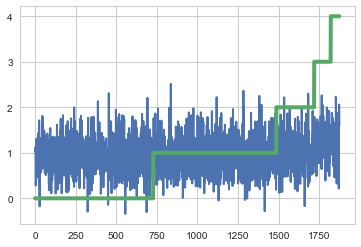

In [86]:
df1 = df_threads[df_threads.cat_tail == 1]
vect = TfidfVectorizer(sublinear_tf=True, use_idf=True)

X = vect.fit_transform(df1['clean_content'].values).toarray()
y =  [int(x) for x in df1['tail'].values]
feature = vect.get_feature_names()
#X_pca = PCA(n_components=32).fit_transform(X)

data_train, data_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state = True)
vect = TfidfVectorizer(sublinear_tf=True, use_idf=True)
X_train = data_train
X_test = data_test

reg = Ridge(alpha = 1, tol = 0.003)
y_reg = reg.fit(X_train, y_train).predict(X_test)
coef = reg.coef_
print(metrics.mean_squared_error(y_test, y_reg))

df_score = pd.DataFrame()
df_score['y_test'] = y_test
df_score['y_pred'] = y_reg
df_score = df_score.sort_values(by = 'y_test')
plt.plot(range(len(df_score)), df_score['y_pred'], '-', linewidth=2.0)
plt.plot(range(len(df_score)), df_score['y_test'], '-', linewidth=4.0)

In [309]:
X_pca_32 = PCA(n_components=32).fit_transform(X)

In [329]:
df_pca_32_reg = pd.Dadf_pca_32_3ltaFrame(X_pca_32)
df_pca_32_reg['labels'] = df_threads['tail'].values
df_pca_32_reg.to_csv('df_pca_32_reg.csv', index = False)

In [331]:
df_pca_32_3c = pd.DataFrame(X_pca_32)
df_pca_32_3c['labels'] = df_threads['cat_tail'].values
df_pca_32_3c.to_csv('df_pca_32_3c.csv', index = False)

In [332]:
df_pca_32_3c['labels']

0       2
1       1
2       1
3       1
4       1
       ..
7813    1
7814    1
7815    1
7816    1
7817    1
Name: labels, dtype: int64

In [252]:
df.to_csv('df_matrix.csv', index = False)

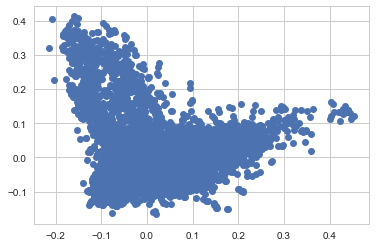

In [187]:
plt.plot(X_pca[:, 0], X_pca[:, 1], 'o')


In [210]:
X_3 = np.cross(list(X_pca[:, 0])[:3], list(X_pca[:, 1])[:3])

In [211]:
X_3

array([ 0.01387007,  0.00279407, -0.00430025])

In [208]:
X_pca[:, 0]

array([-0.01203229, -0.03962211, -0.06455344, ...,  0.00897019,
       -0.03283856, -0.03211758])

0 0
0 0
0 0


C:\Users\aemelyanova\AppData\Local\Continuum\Anaconda3\lib\site-packages\matplotlib\lines.py:1206: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  if self._markerfacecolor != fc:


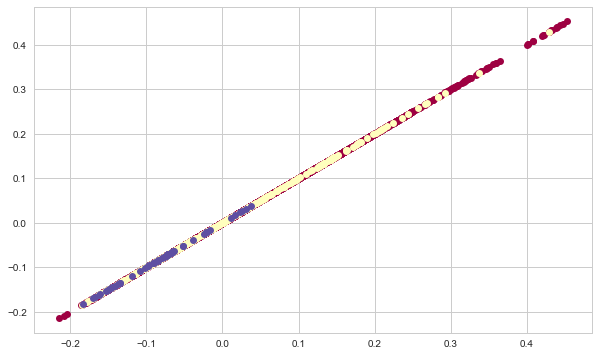

0 1
0 1
0 1


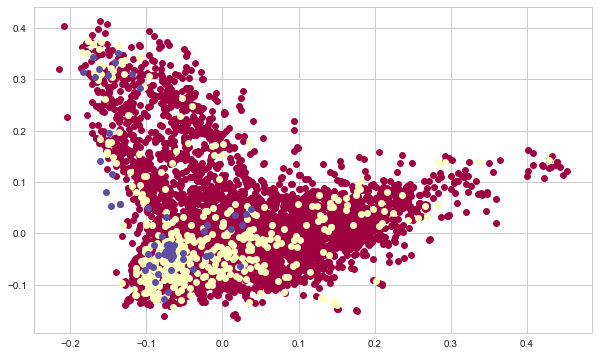

0 2
0 2
0 2


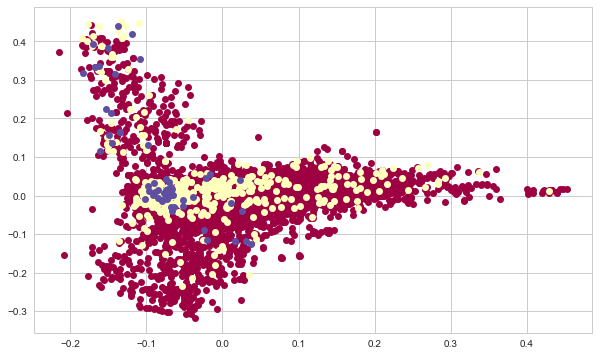

0 3
0 3
0 3


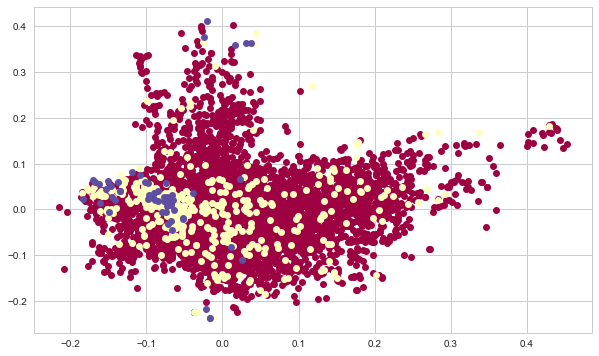

0 4
0 4
0 4


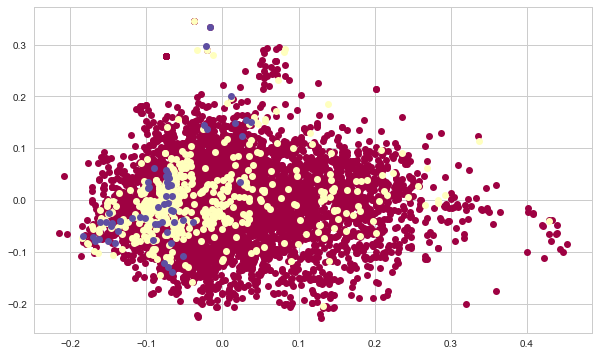

0 5
0 5
0 5


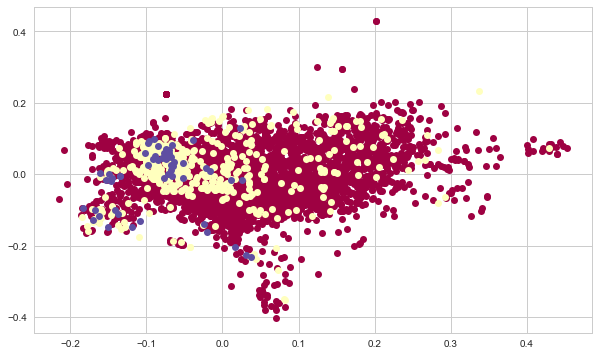

0 6
0 6
0 6


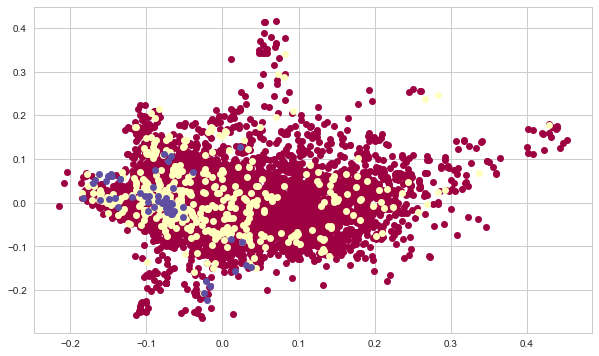

0 7
0 7
0 7


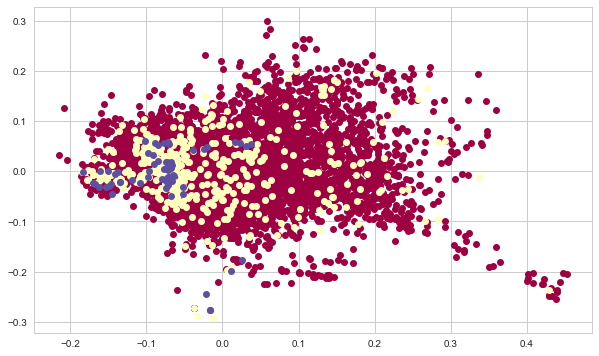

0 8
0 8
0 8


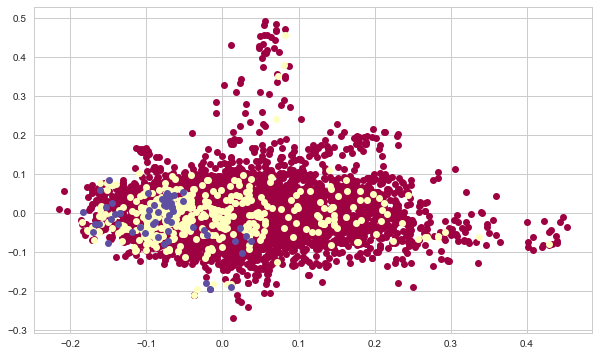

0 9
0 9
0 9


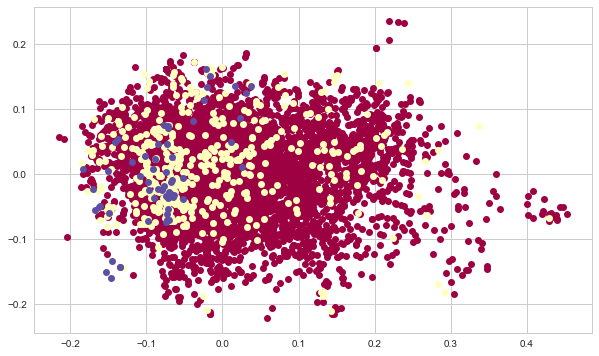

0 10
0 10
0 10


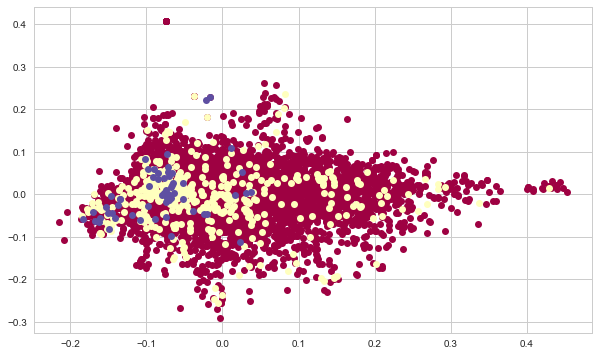

0 11
0 11
0 11


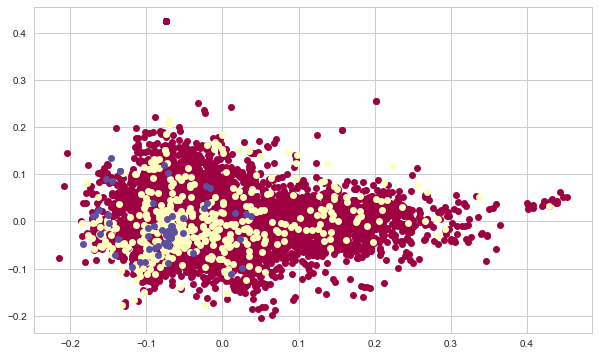

0 12
0 12
0 12


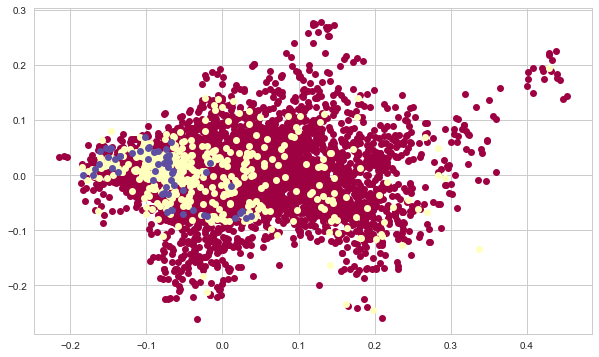

0 13
0 13
0 13


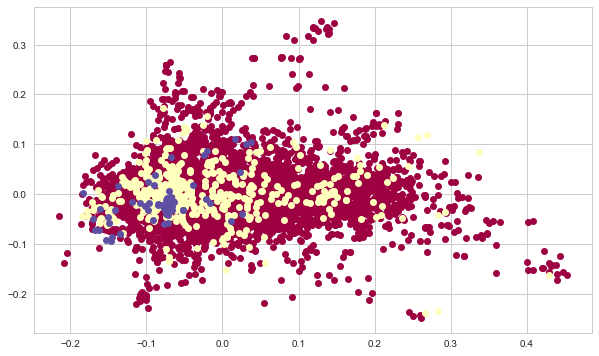

0 14
0 14
0 14


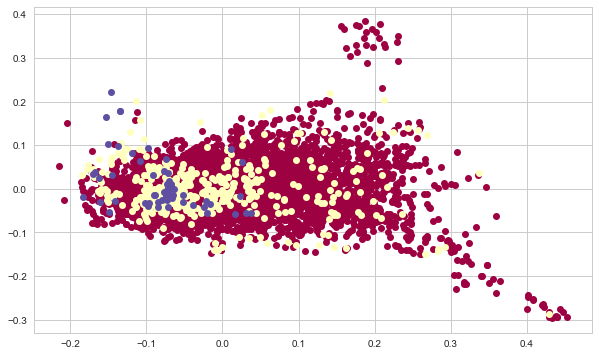

0 15
0 15
0 15


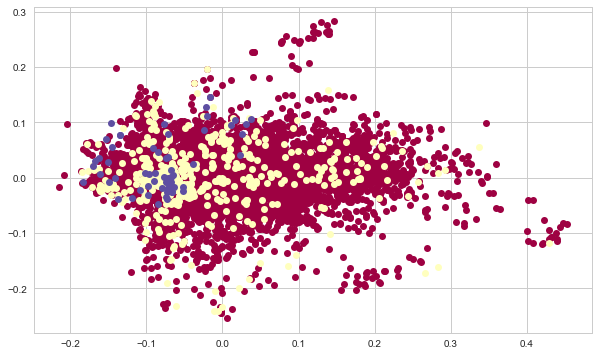

1 0
1 0
1 0


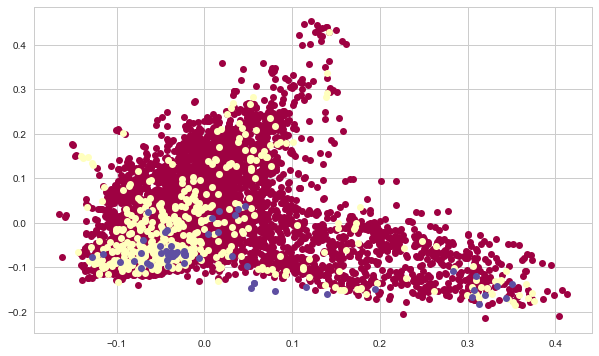

1 1
1 1
1 1


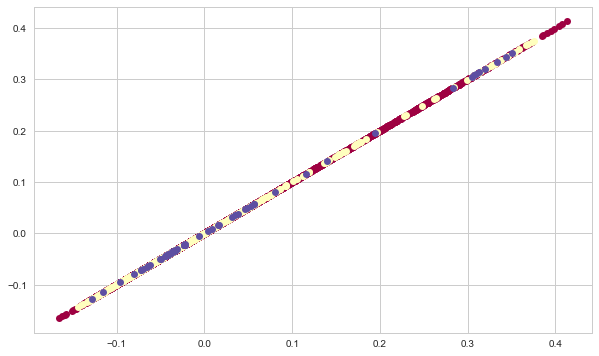

1 2
1 2
1 2


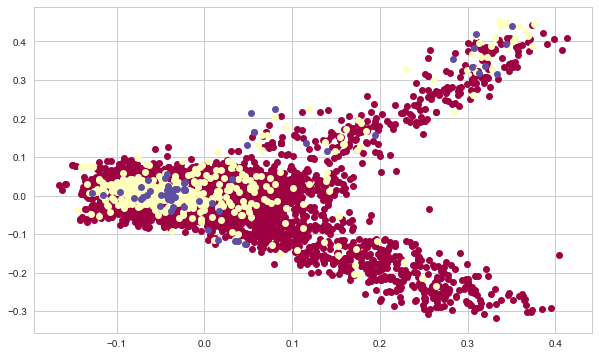

1 3
1 3
1 3


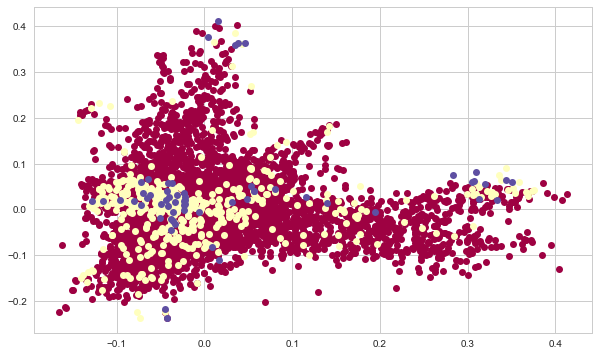

1 4
1 4
1 4


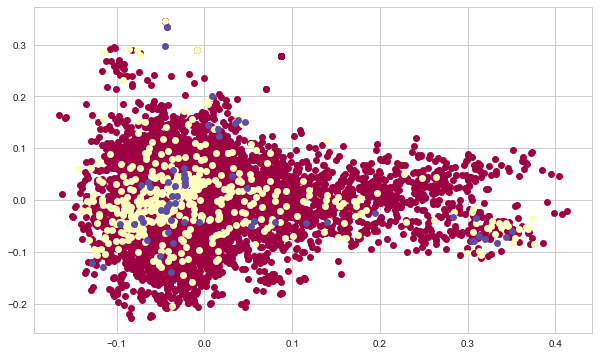

1 5
1 5
1 5


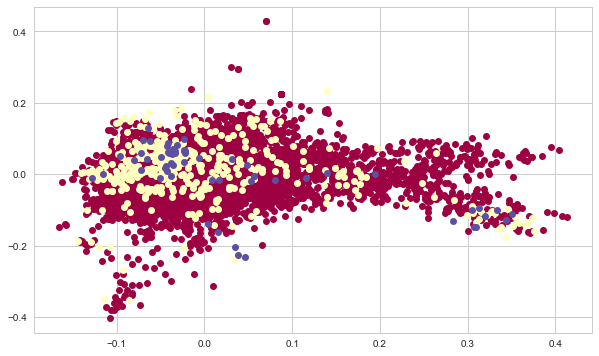

1 6
1 6
1 6


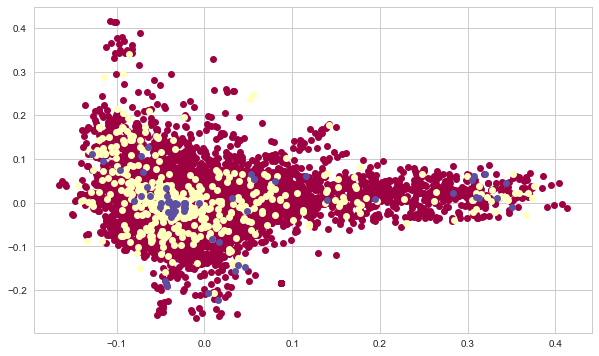

1 7
1 7
1 7


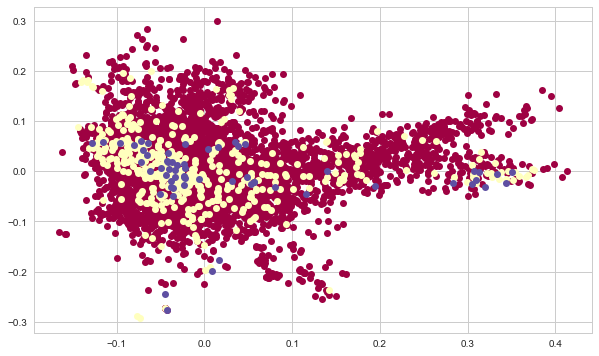

1 8
1 8
1 8


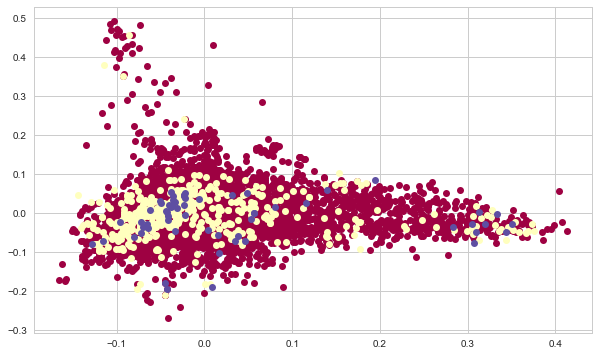

1 9
1 9
1 9


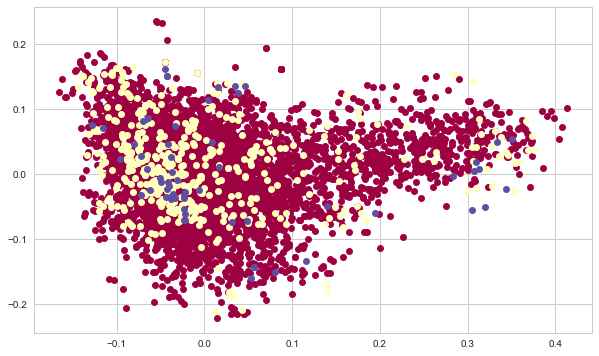

1 10
1 10
1 10


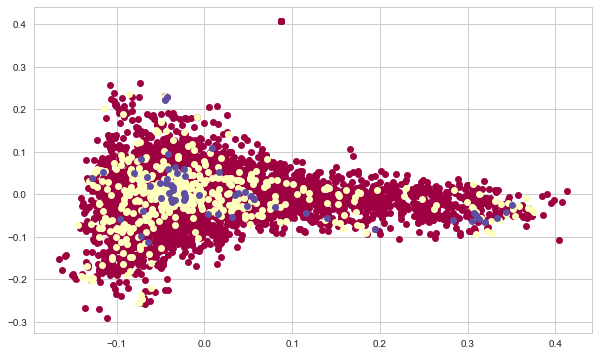

1 11
1 11
1 11


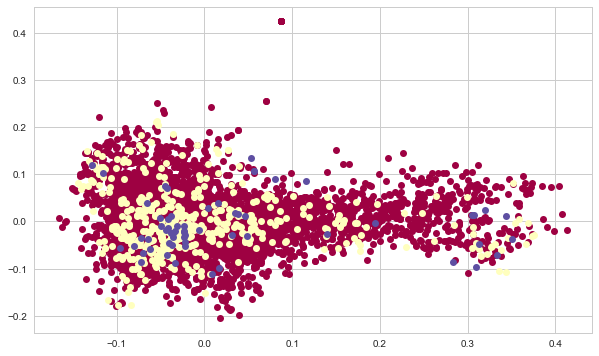

1 12
1 12
1 12


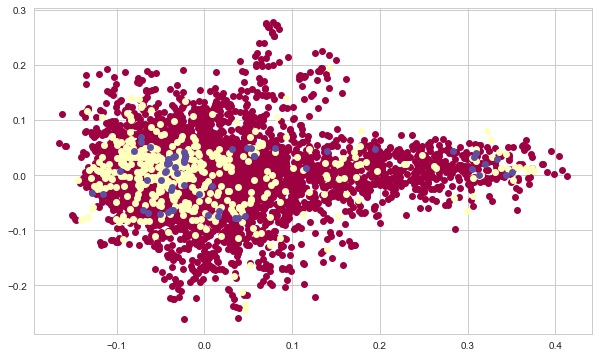

1 13
1 13
1 13


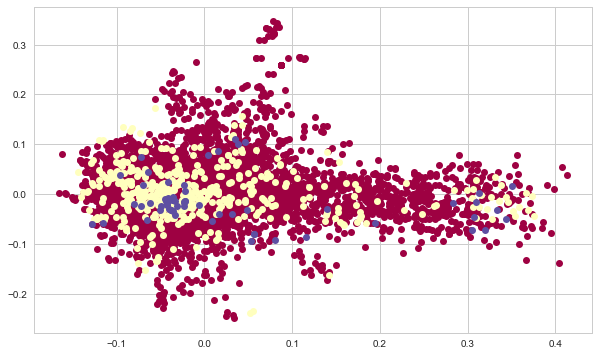

1 14
1 14
1 14


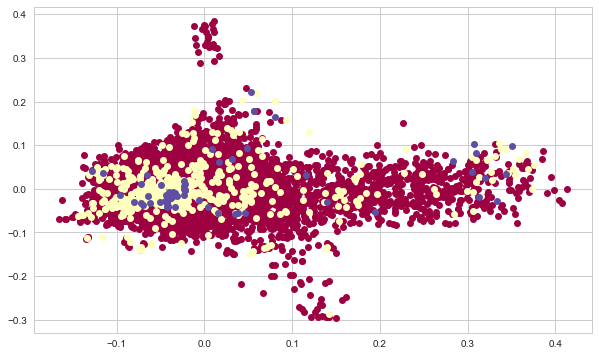

1 15
1 15
1 15


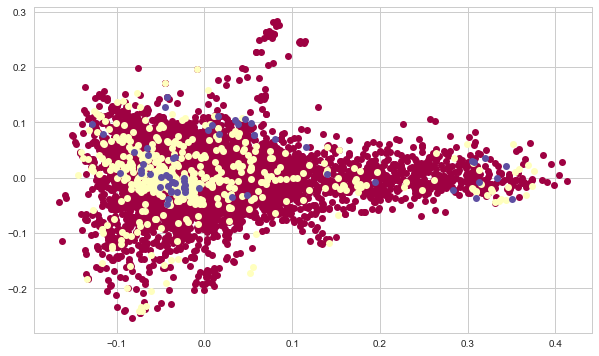

2 0
2 0
2 0


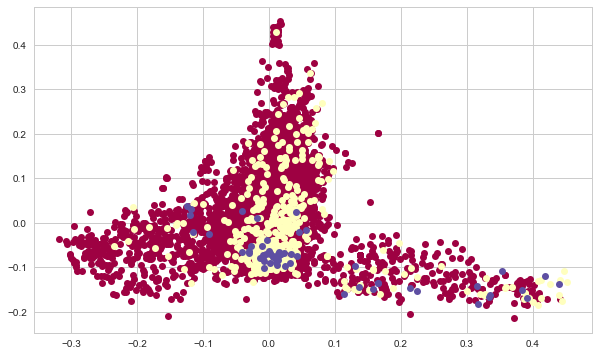

2 1
2 1
2 1


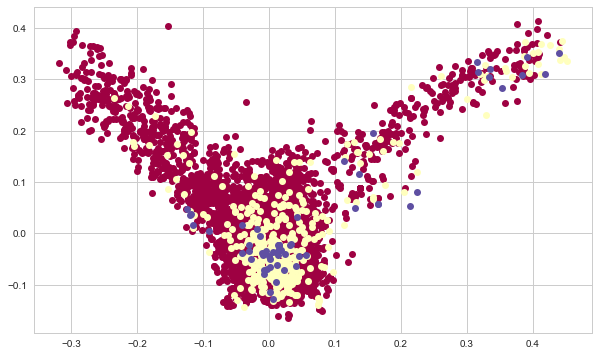

2 2
2 2
2 2


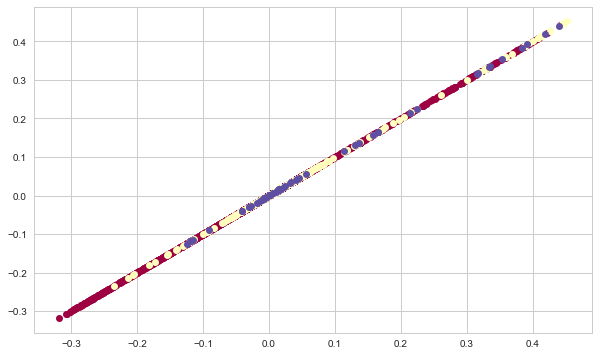

2 3
2 3
2 3


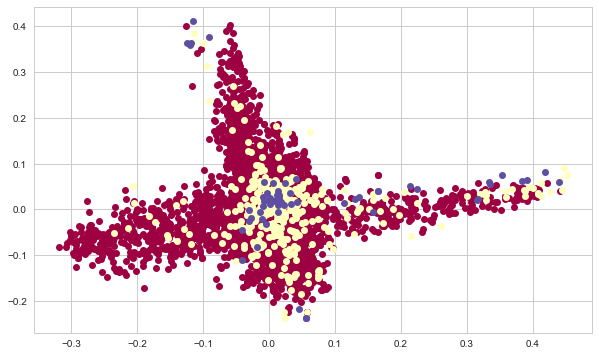

2 4
2 4
2 4


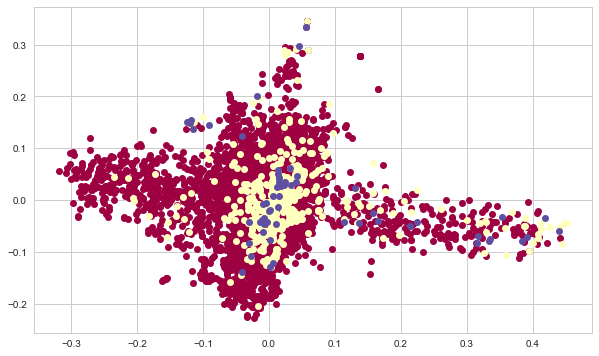

2 5
2 5
2 5


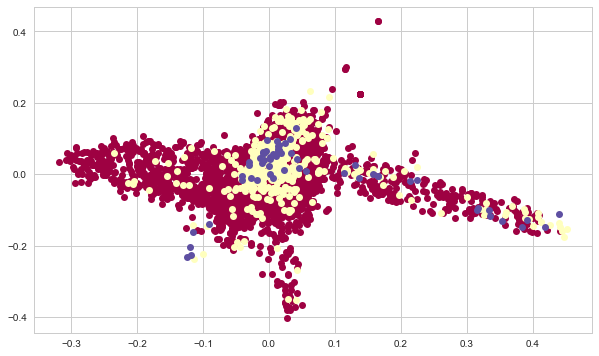

2 6
2 6
2 6


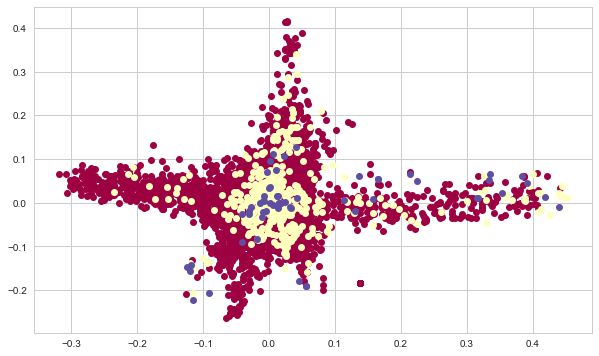

2 7
2 7
2 7


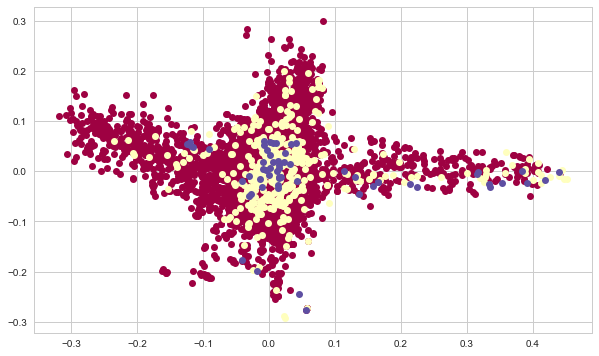

2 8
2 8
2 8


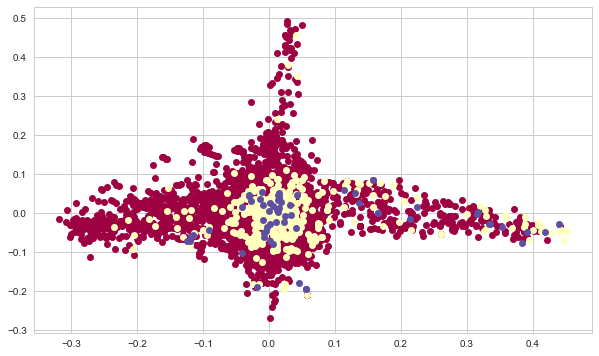

2 9
2 9
2 9


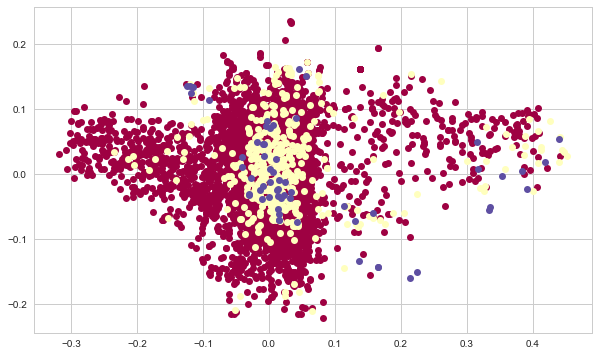

2 10
2 10
2 10


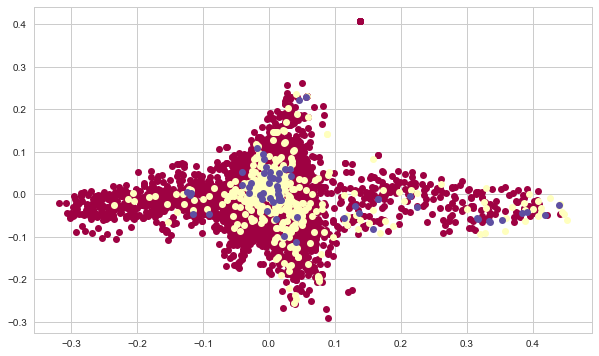

2 11
2 11
2 11


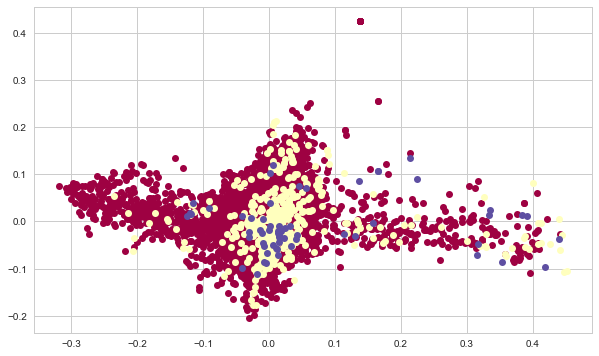

2 12
2 12
2 12


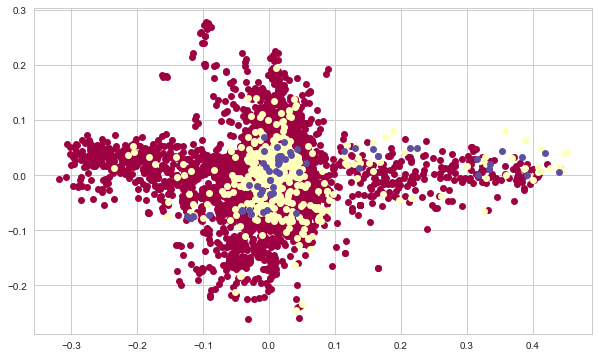

2 13
2 13
2 13


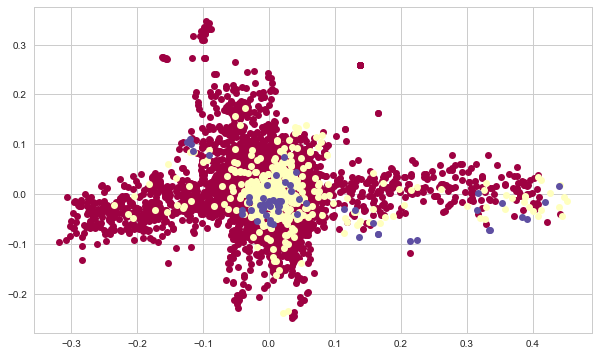

2 14
2 14
2 14


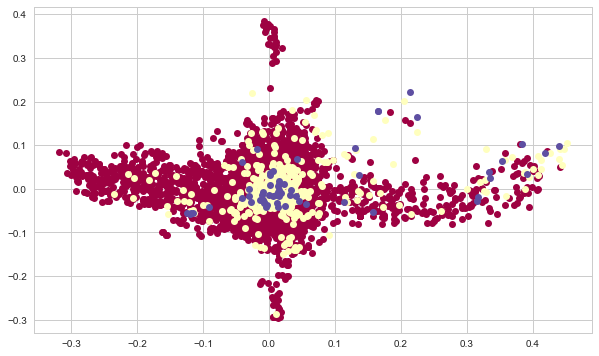

2 15
2 15
2 15


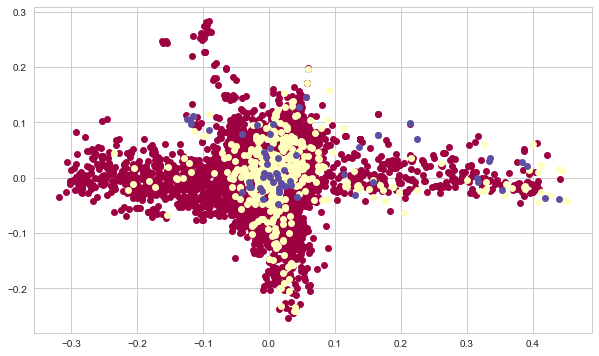

3 0
3 0
3 0


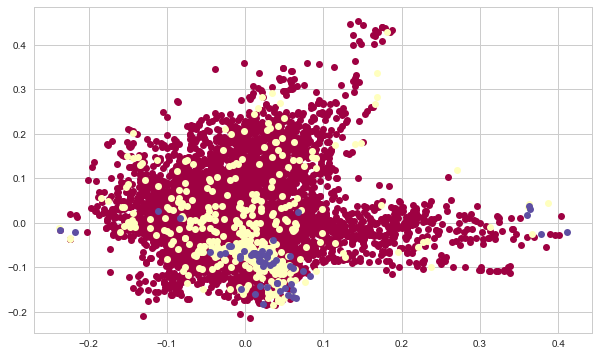

3 1
3 1
3 1


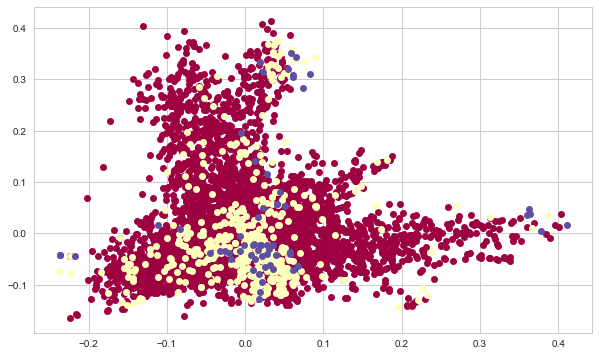

3 2
3 2
3 2


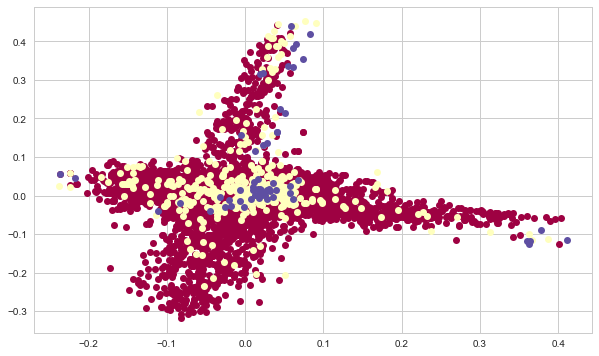

3 3
3 3
3 3


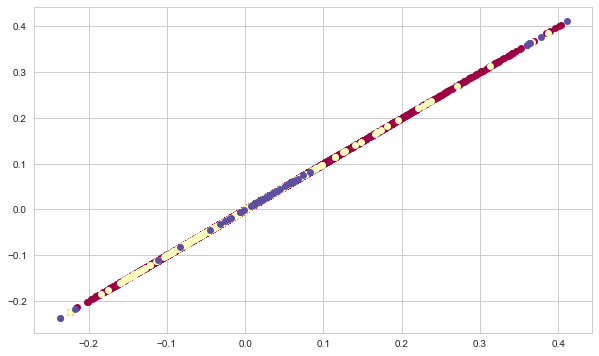

3 4
3 4
3 4


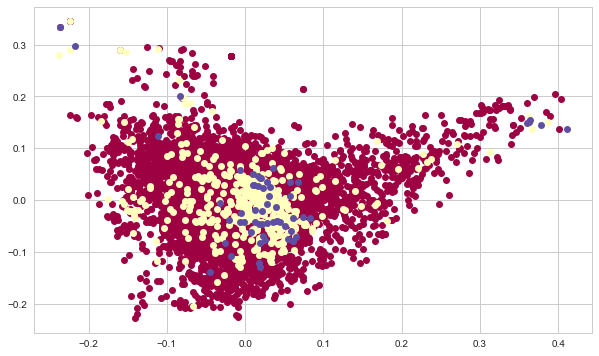

3 5
3 5
3 5


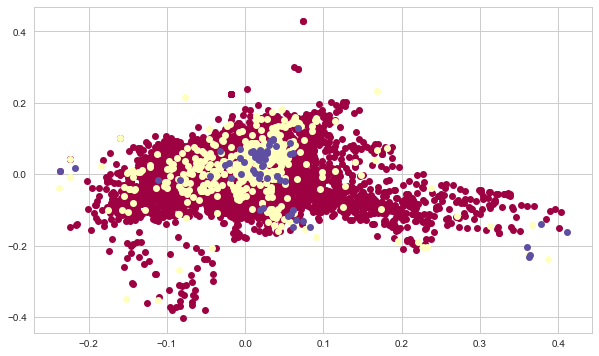

3 6
3 6
3 6


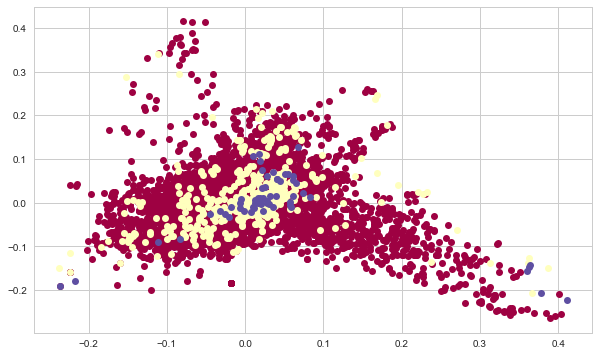

3 7
3 7
3 7


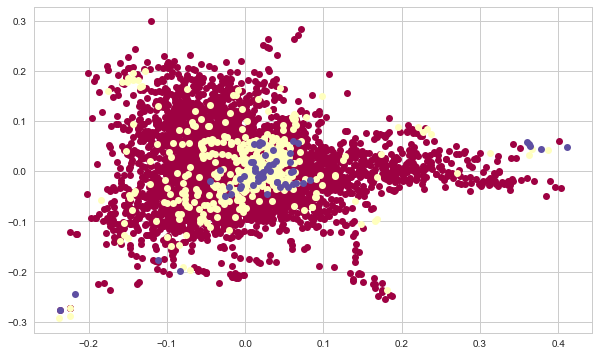

3 8
3 8
3 8


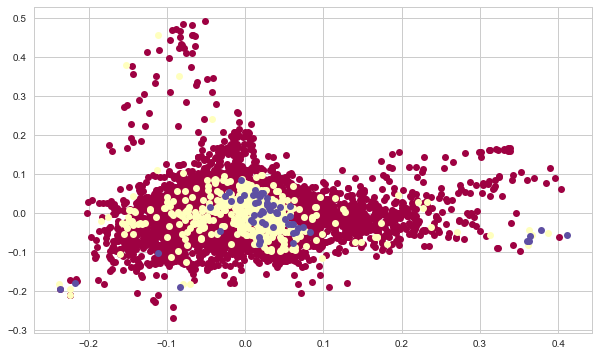

3 9
3 9
3 9


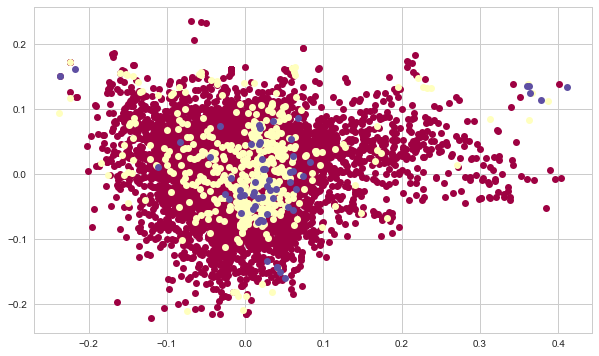

3 10
3 10
3 10


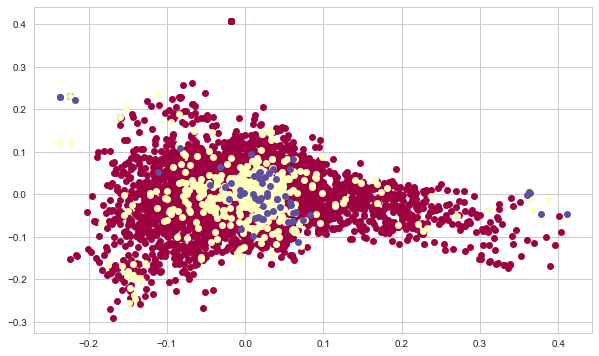

3 11
3 11
3 11


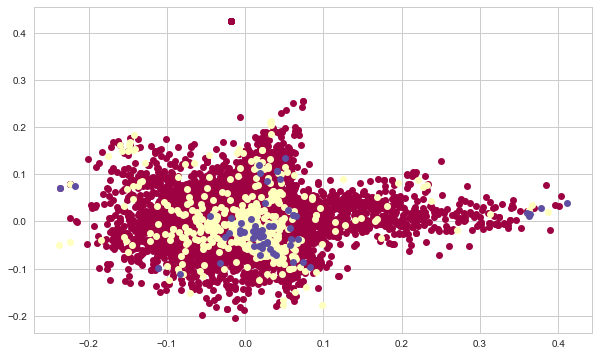

3 12
3 12
3 12


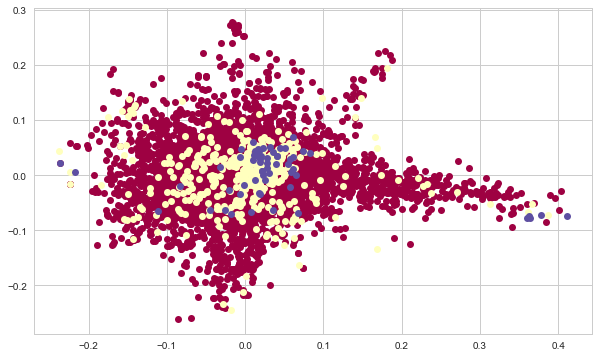

3 13
3 13
3 13


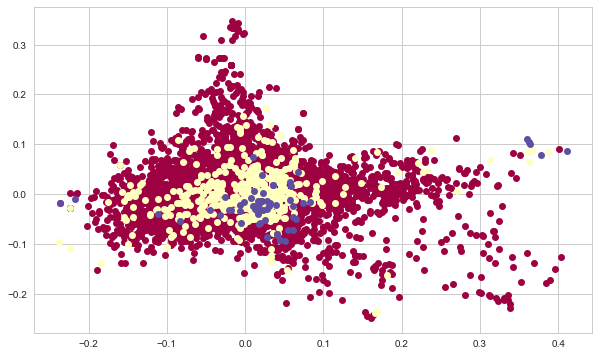

3 14
3 14
3 14


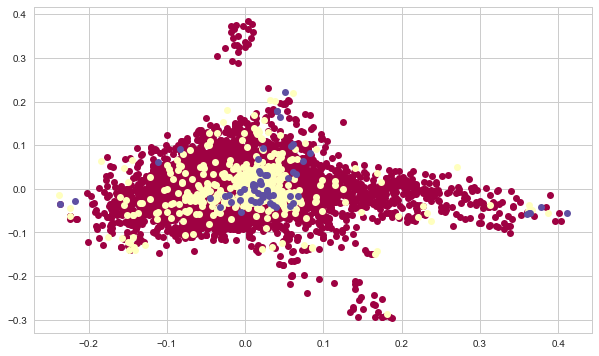

3 15
3 15
3 15


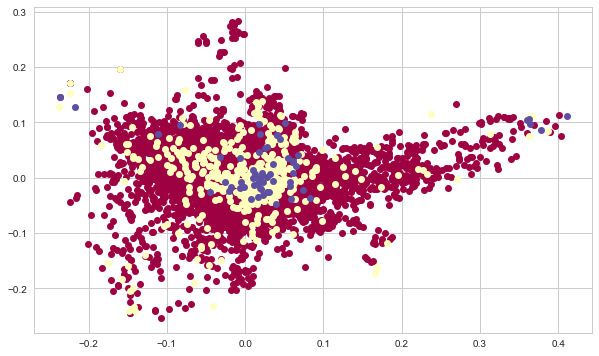

4 0
4 0
4 0


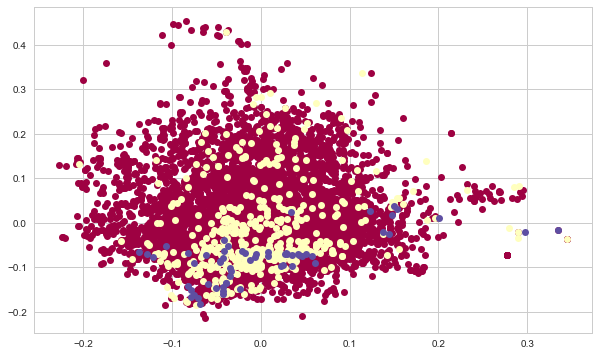

4 1
4 1
4 1


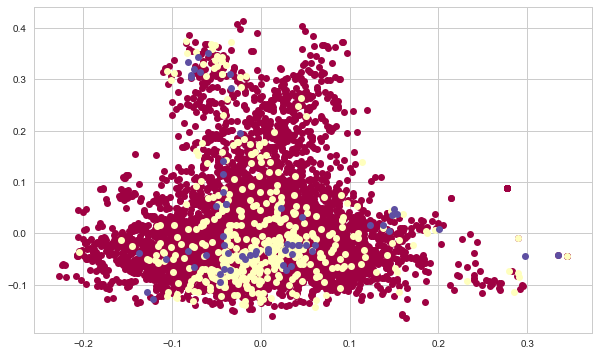

4 2
4 2
4 2


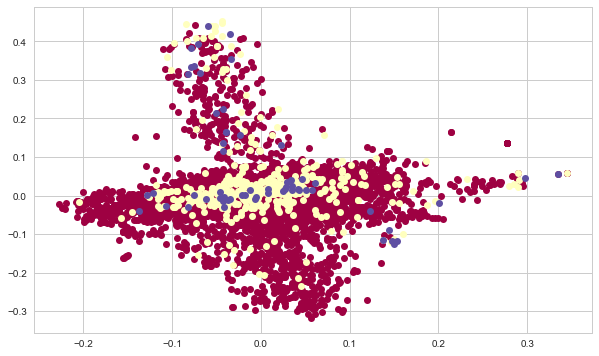

4 3
4 3
4 3


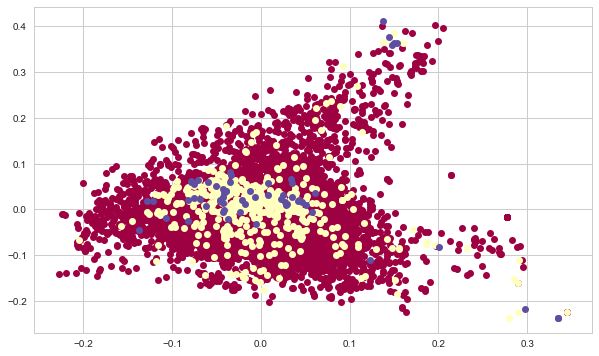

4 4
4 4
4 4


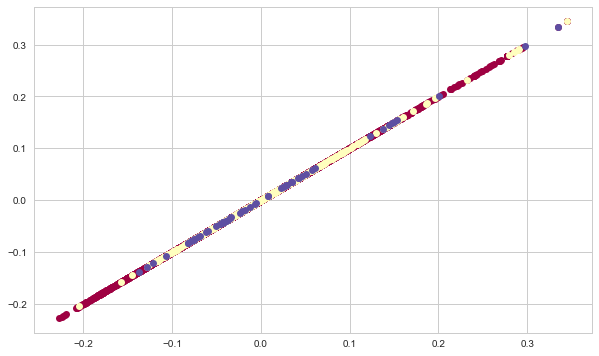

4 5
4 5
4 5


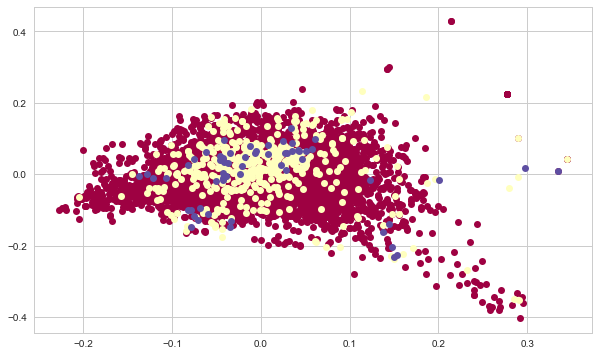

4 6
4 6
4 6


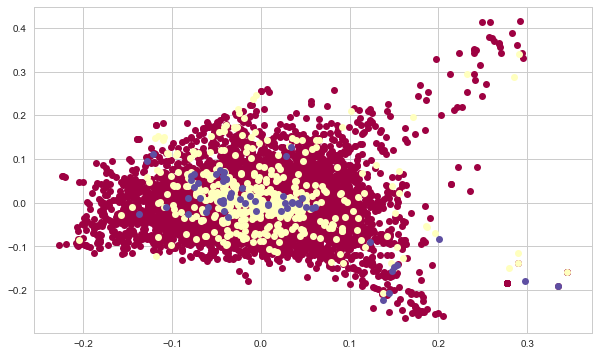

4 7
4 7
4 7


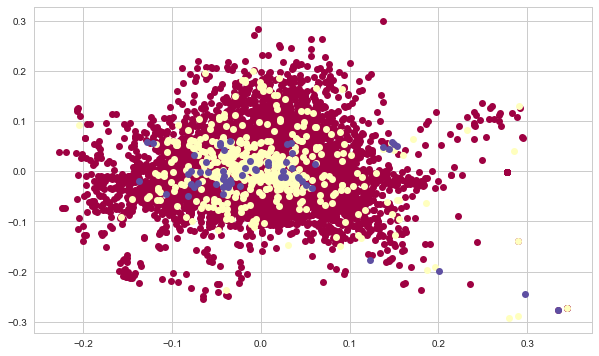

4 8
4 8
4 8


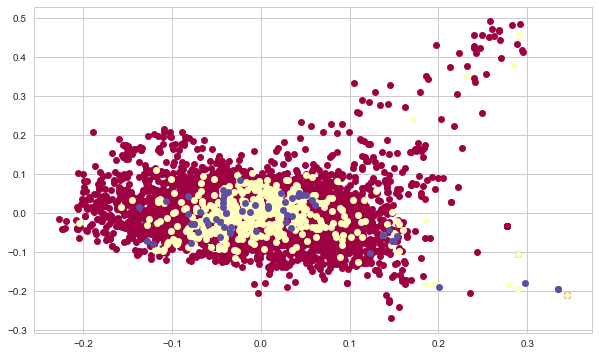

4 9
4 9
4 9


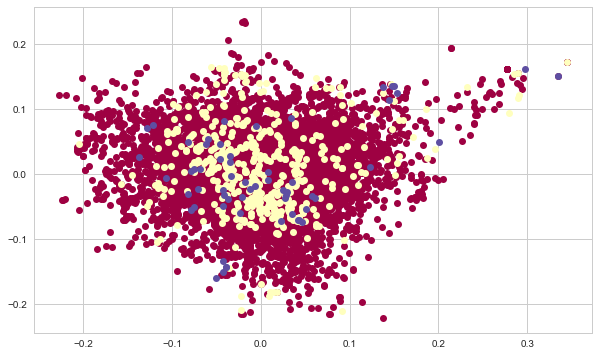

4 10
4 10
4 10


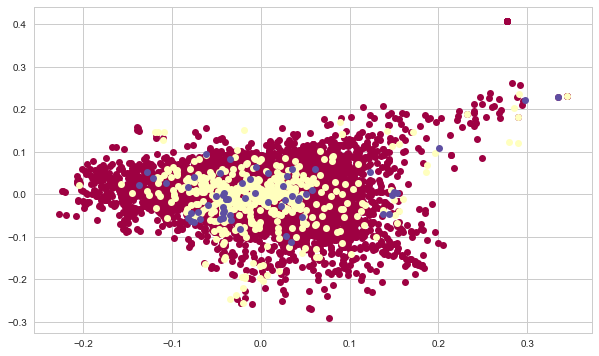

4 11
4 11
4 11


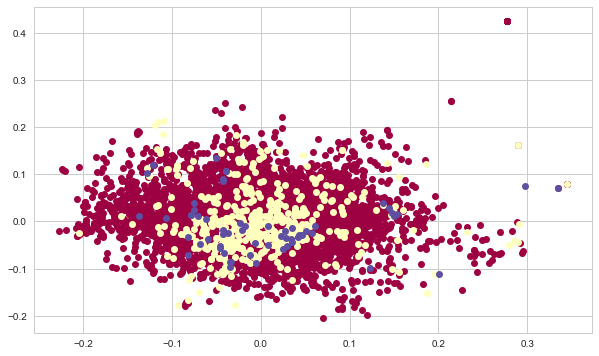

4 12
4 12
4 12


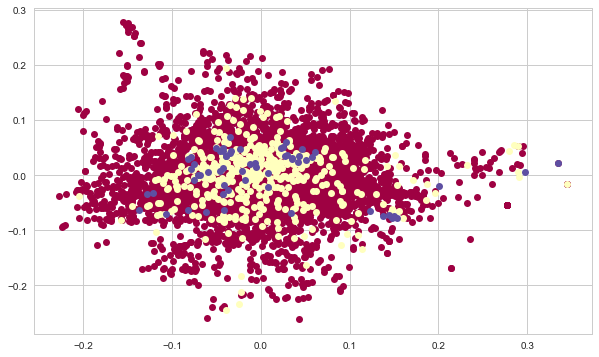

4 13
4 13
4 13


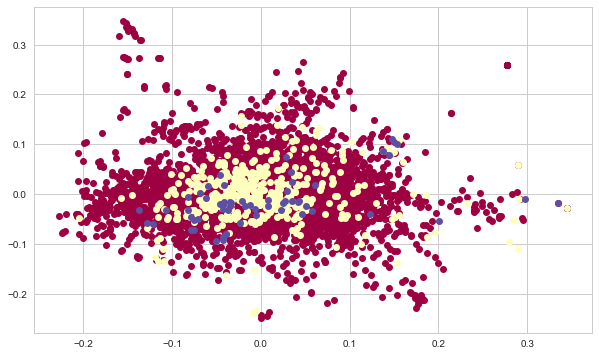

4 14
4 14
4 14


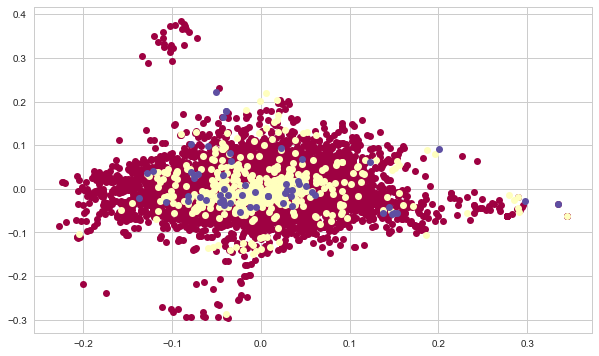

4 15
4 15
4 15


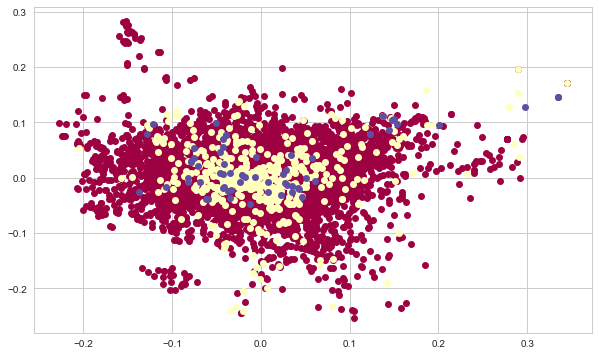

5 0
5 0
5 0


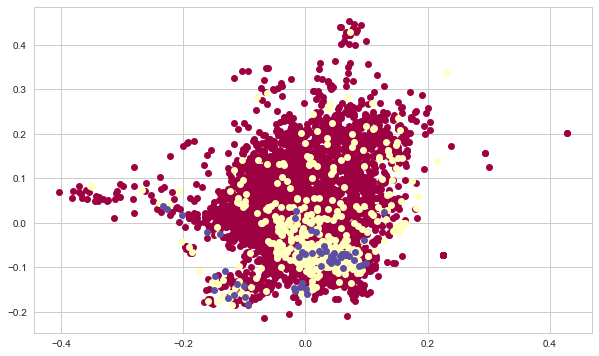

5 1
5 1
5 1


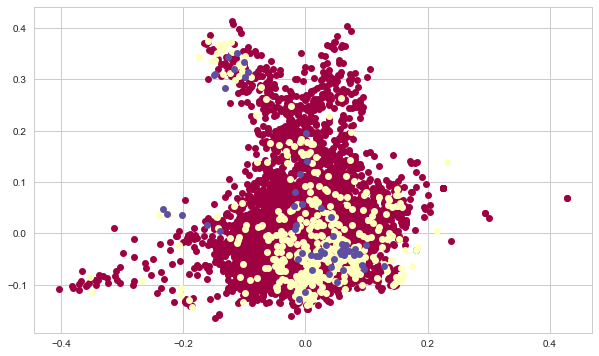

5 2
5 2
5 2


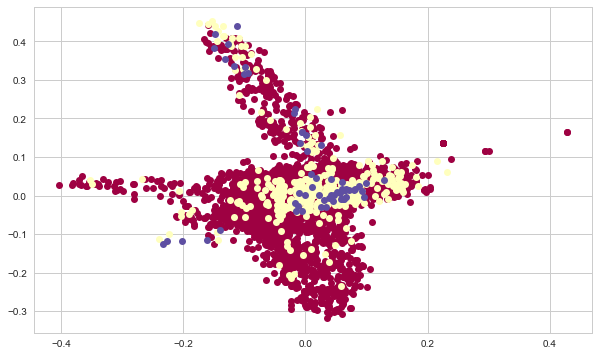

5 3
5 3
5 3


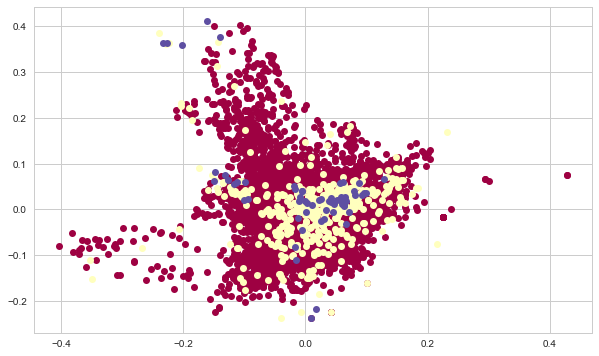

5 4
5 4
5 4


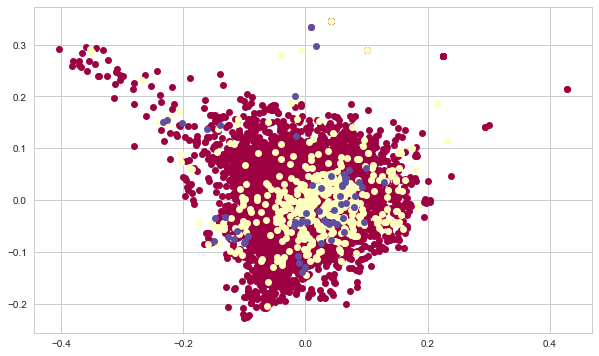

5 5
5 5
5 5


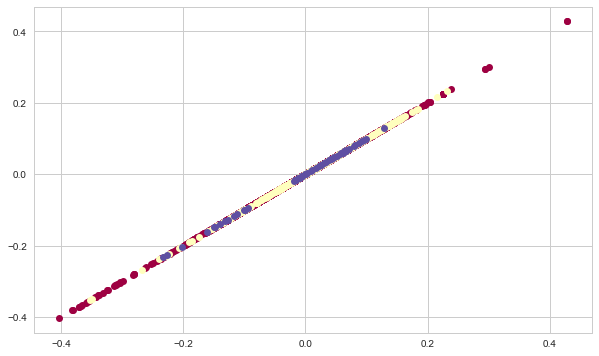

5 6
5 6
5 6


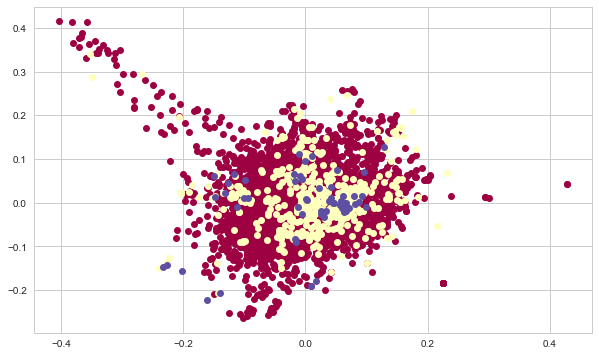

5 7
5 7
5 7


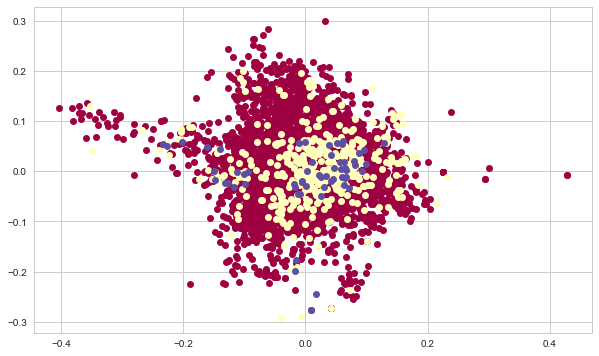

5 8
5 8
5 8


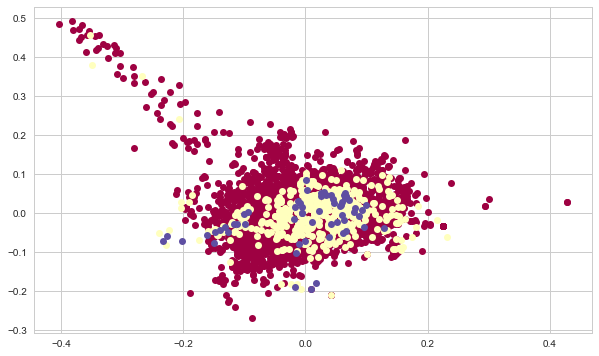

5 9
5 9
5 9


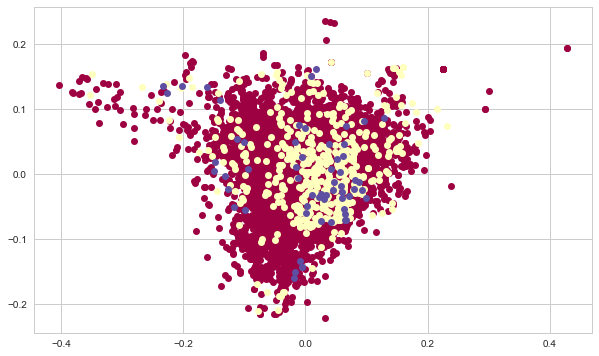

5 10
5 10
5 10


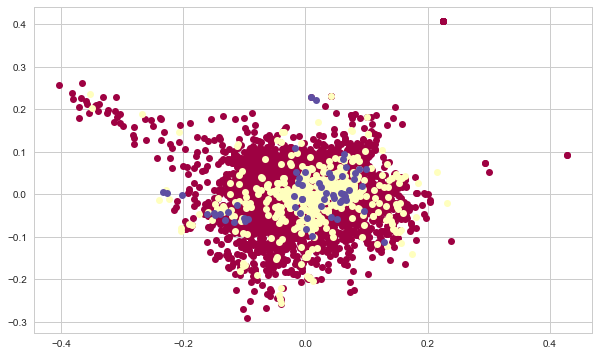

5 11
5 11
5 11


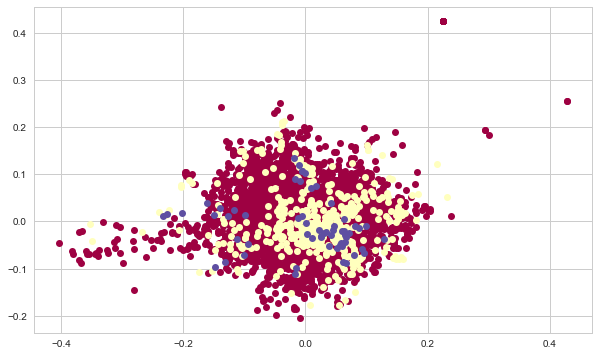

5 12
5 12
5 12


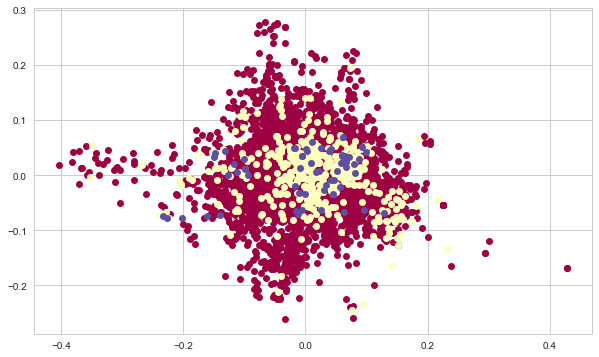

5 13
5 13
5 13


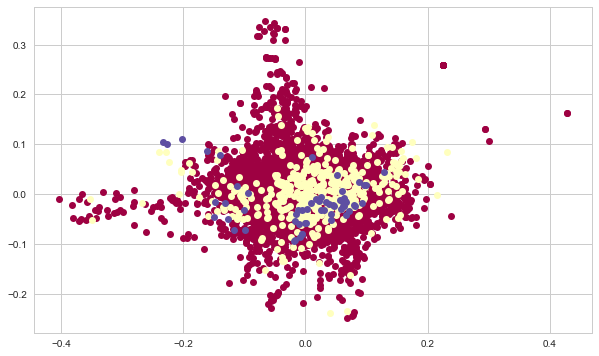

5 14
5 14
5 14


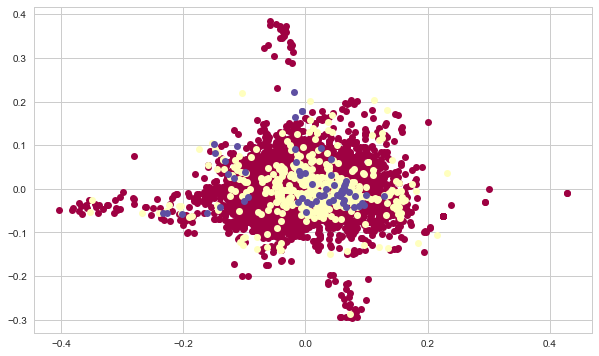

5 15
5 15
5 15


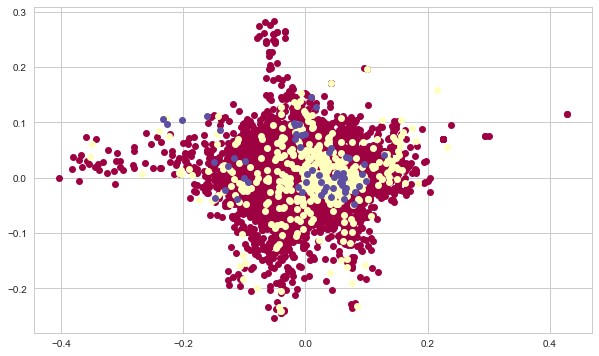

6 0
6 0
6 0


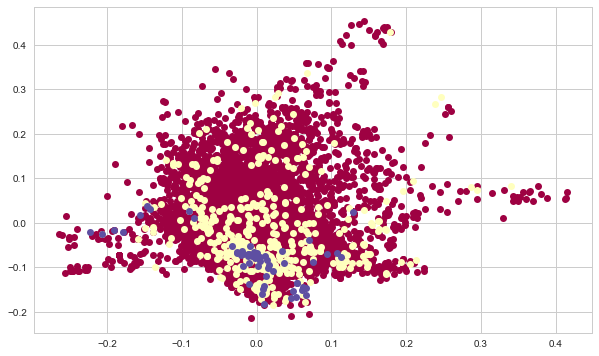

6 1
6 1
6 1


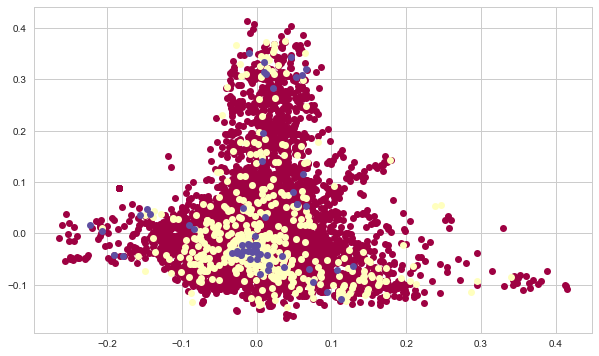

6 2
6 2
6 2


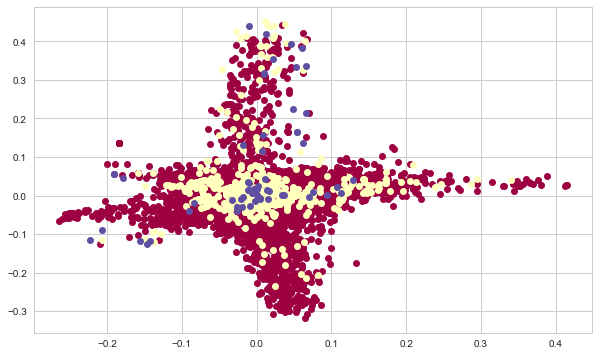

6 3
6 3
6 3


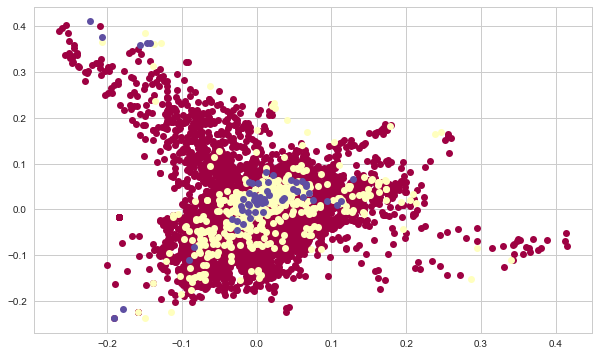

6 4
6 4
6 4


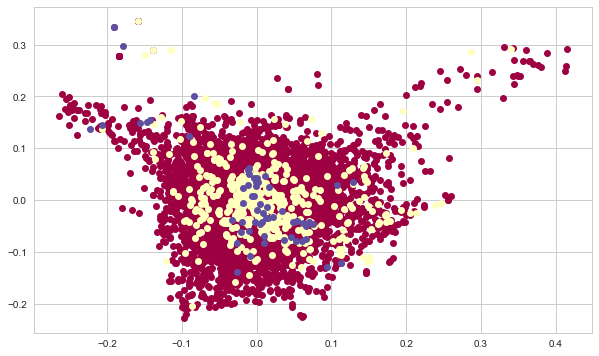

6 5
6 5
6 5


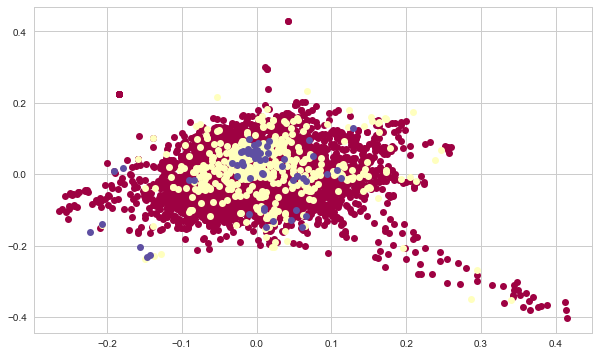

6 6
6 6
6 6


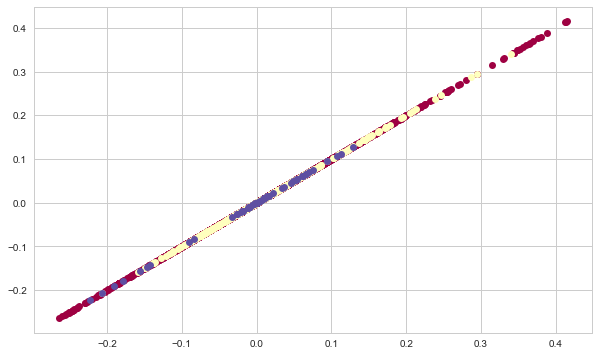

6 7
6 7
6 7


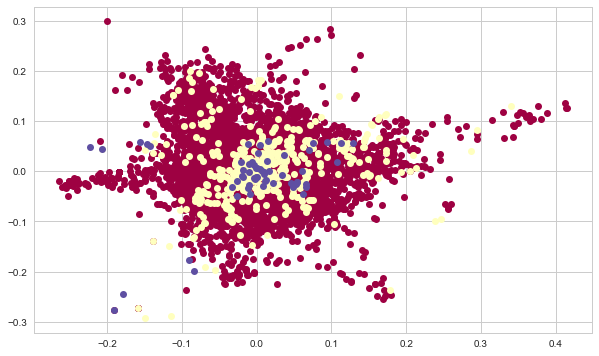

6 8
6 8
6 8


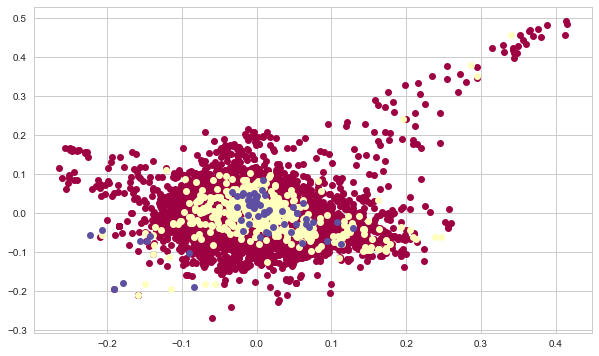

6 9
6 9
6 9


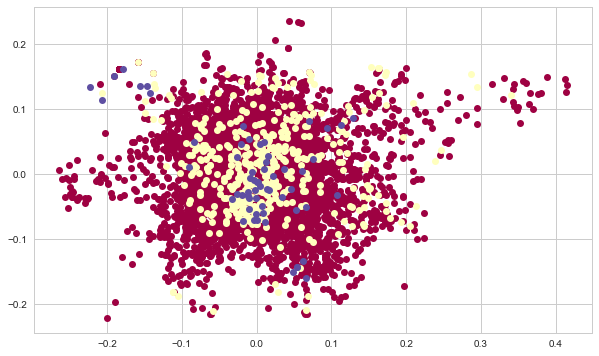

6 10
6 10
6 10


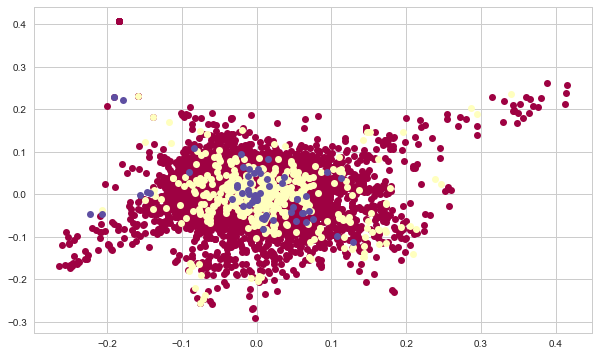

6 11
6 11
6 11


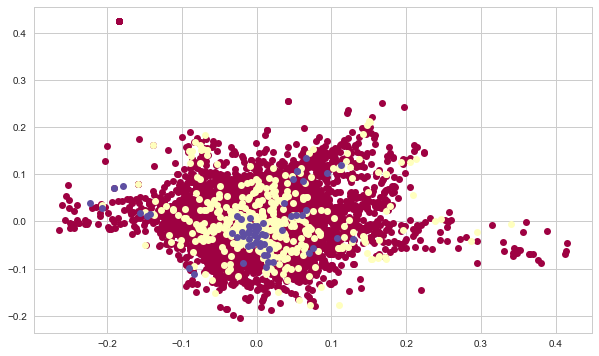

6 12
6 12
6 12


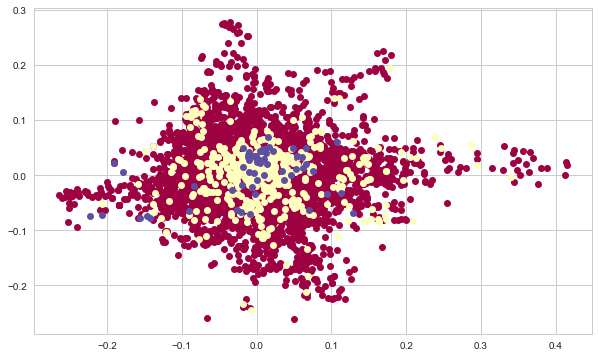

6 13
6 13
6 13


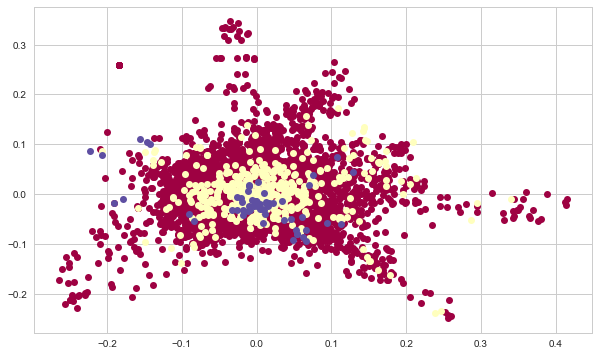

6 14
6 14
6 14


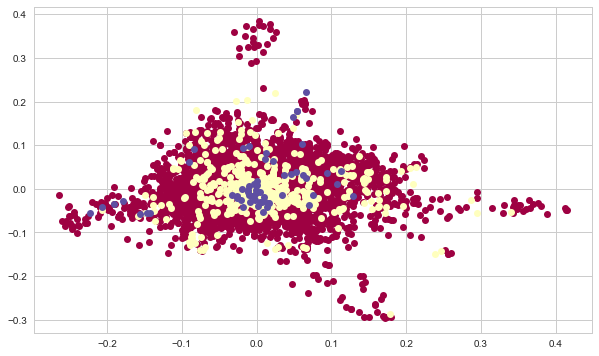

6 15
6 15
6 15


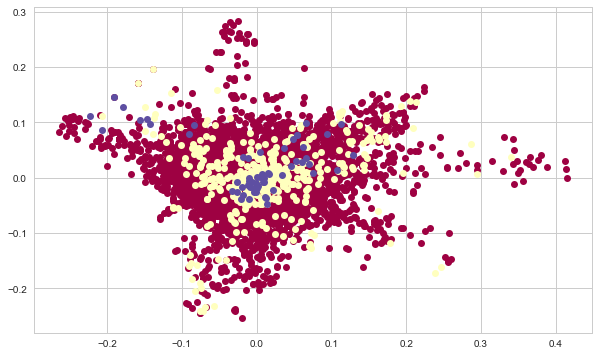

7 0
7 0
7 0


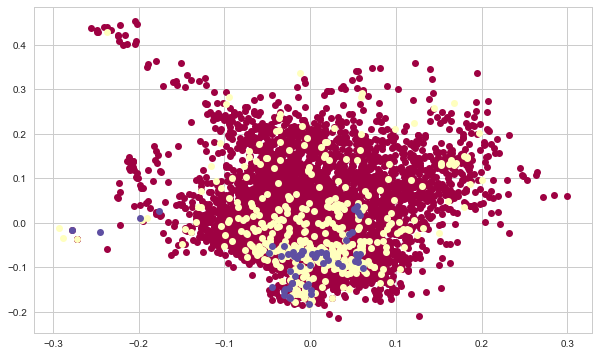

7 1
7 1
7 1


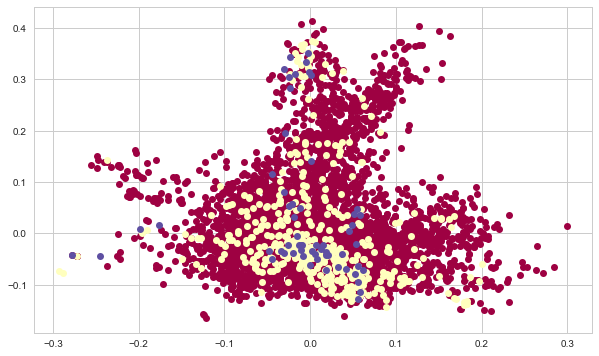

7 2
7 2
7 2


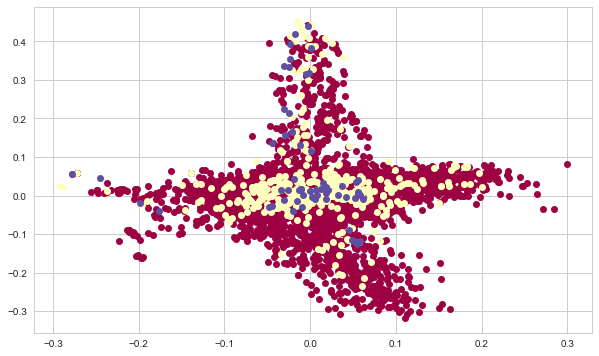

7 3
7 3
7 3


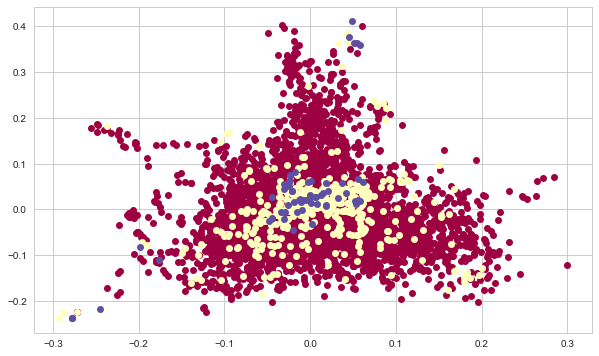

7 4
7 4
7 4


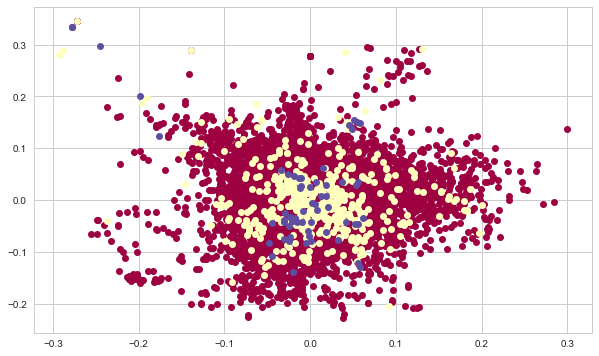

7 5
7 5
7 5


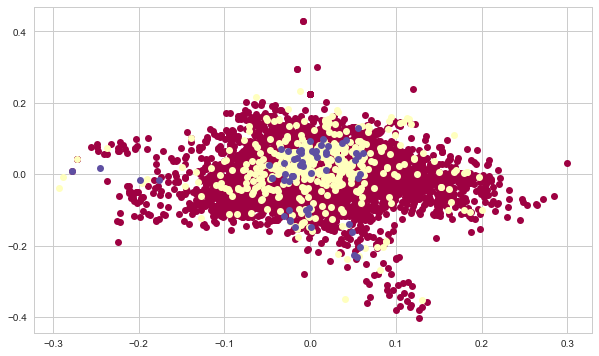

7 6
7 6
7 6


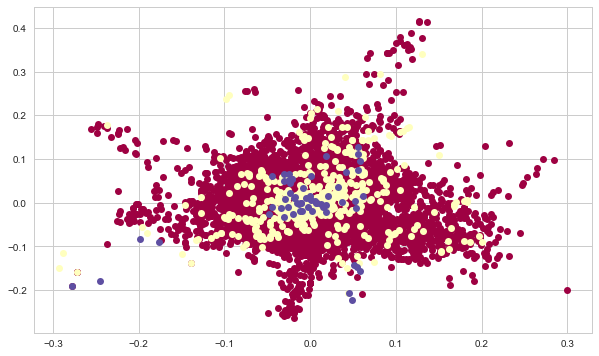

7 7
7 7
7 7


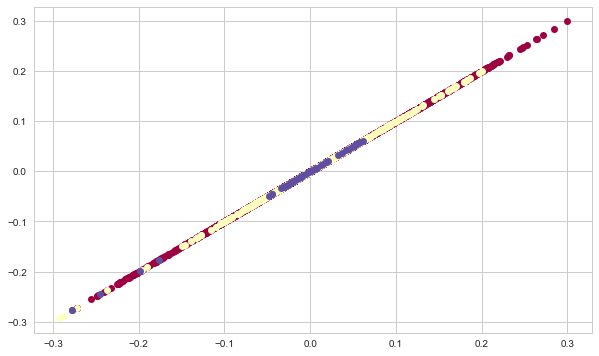

7 8
7 8
7 8


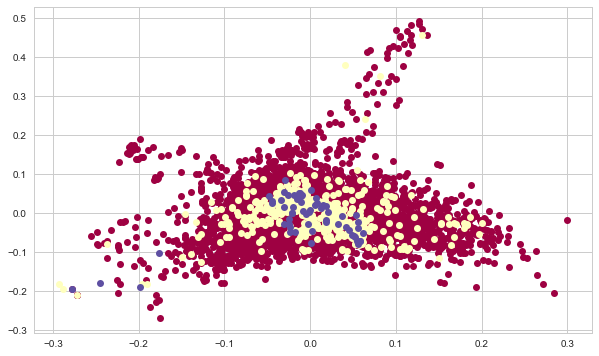

7 9
7 9
7 9


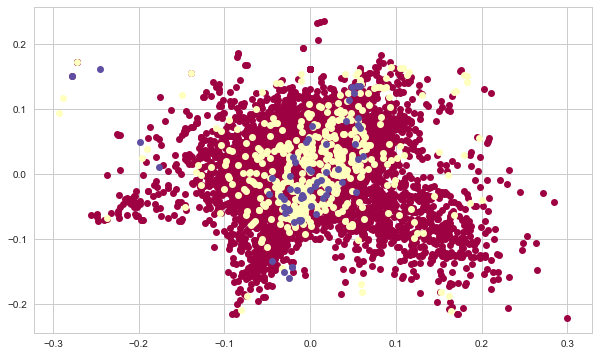

7 10
7 10
7 10


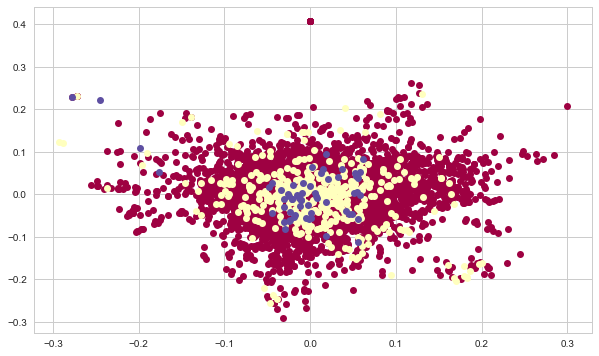

7 11
7 11
7 11


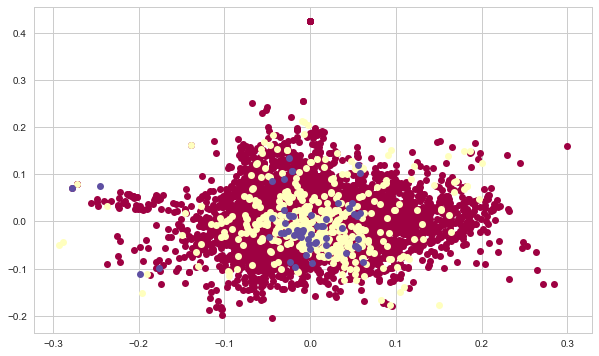

7 12
7 12
7 12


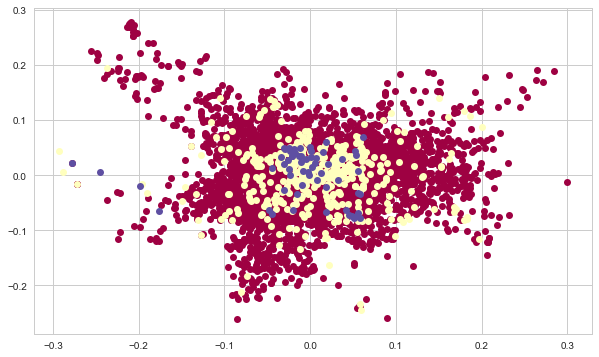

7 13
7 13
7 13


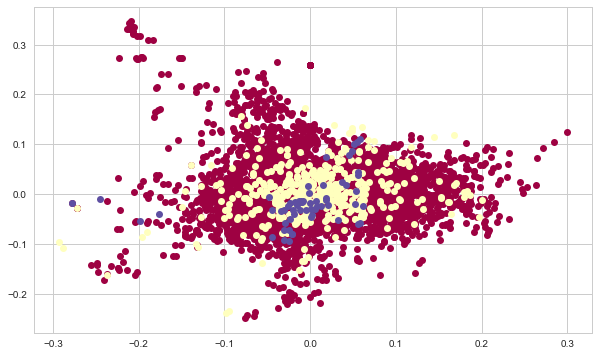

7 14
7 14
7 14


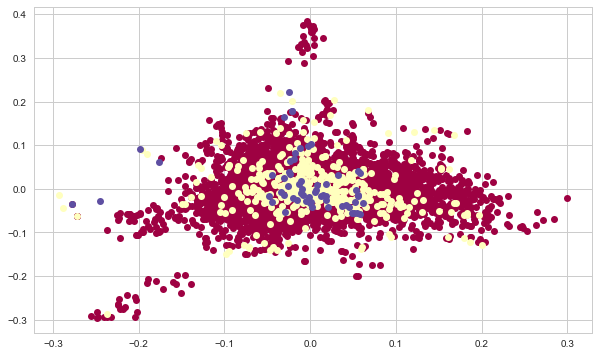

7 15
7 15
7 15


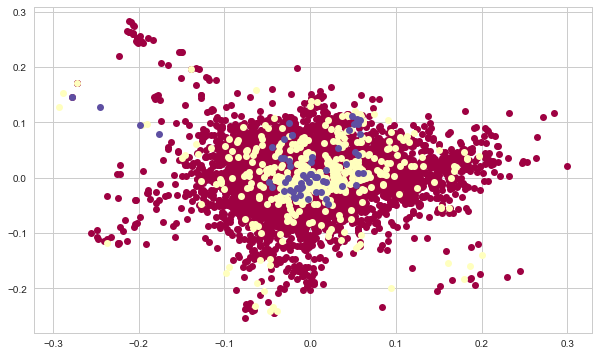

8 0
8 0
8 0


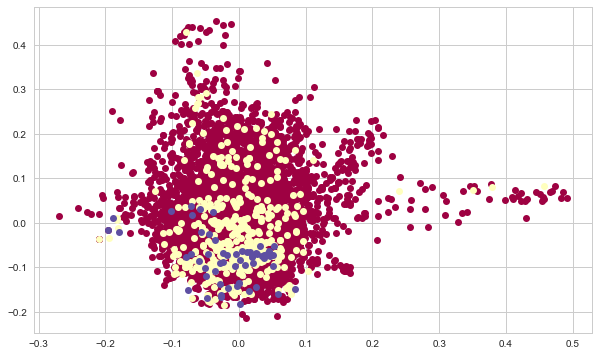

8 1
8 1
8 1


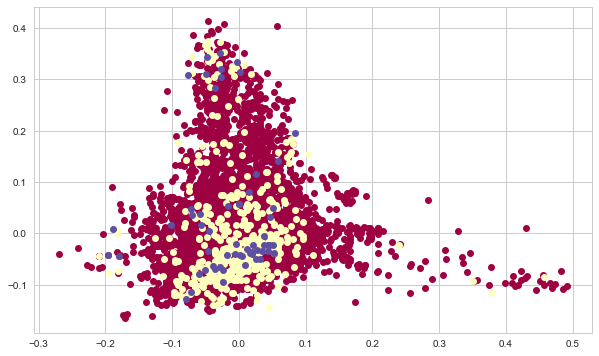

8 2
8 2
8 2


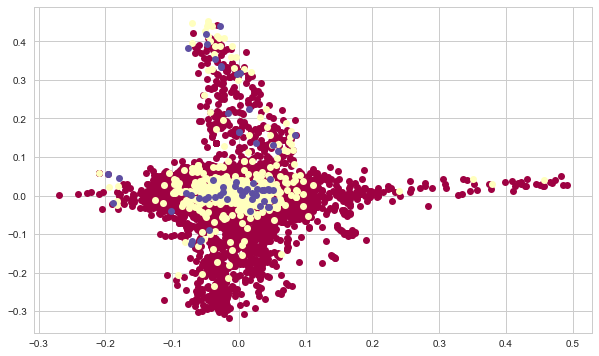

8 3
8 3
8 3


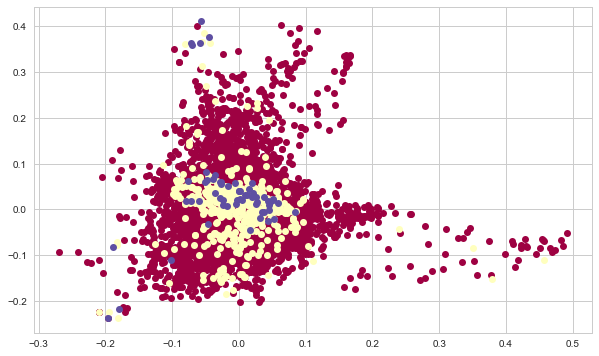

8 4
8 4
8 4


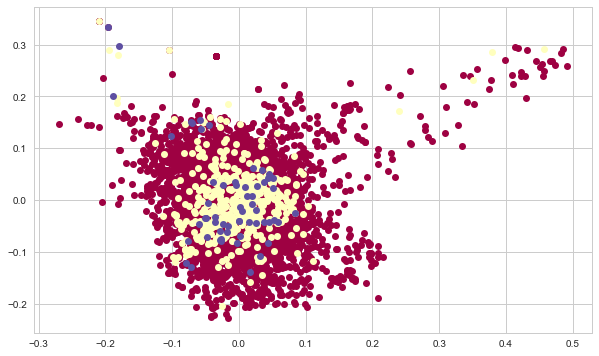

8 5
8 5
8 5


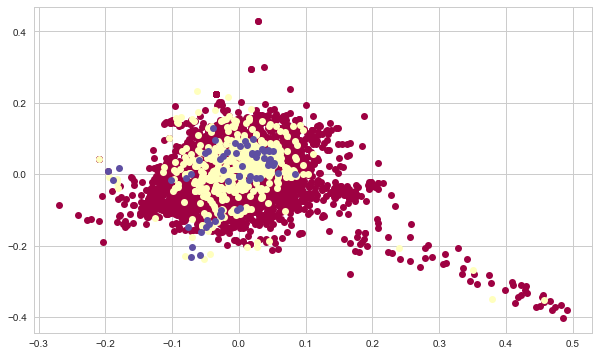

8 6
8 6
8 6


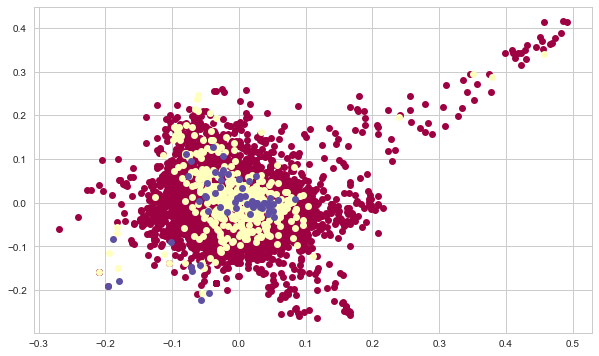

8 7
8 7
8 7


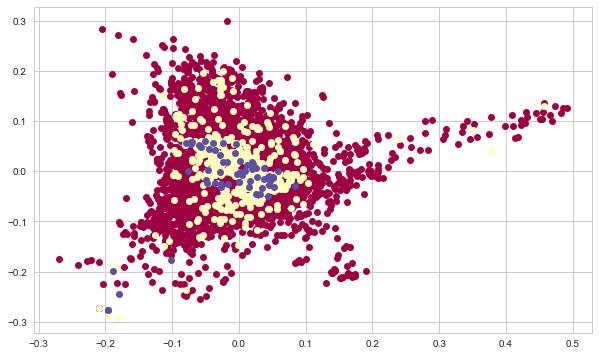

8 8
8 8
8 8


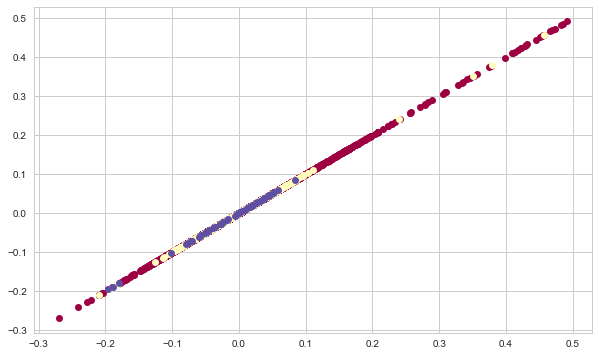

8 9
8 9
8 9


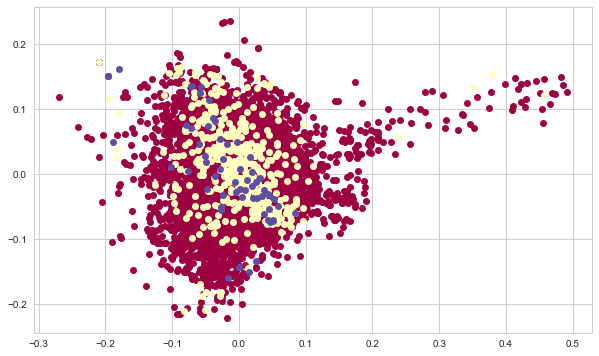

8 10
8 10
8 10


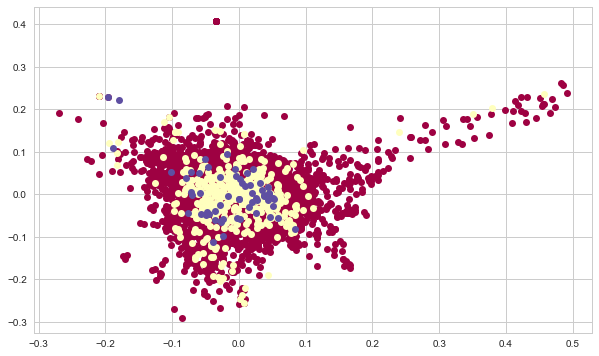

8 11
8 11
8 11


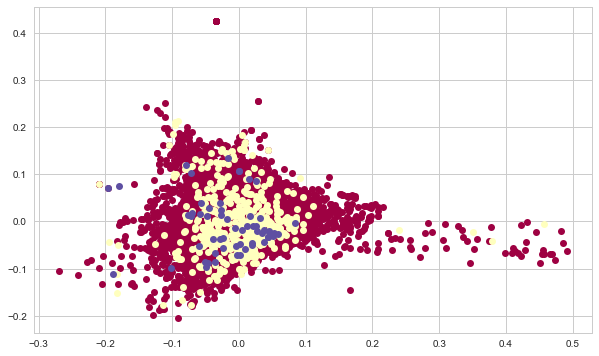

8 12
8 12
8 12


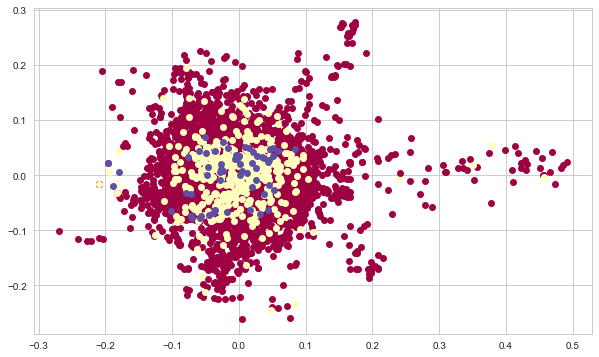

8 13
8 13
8 13


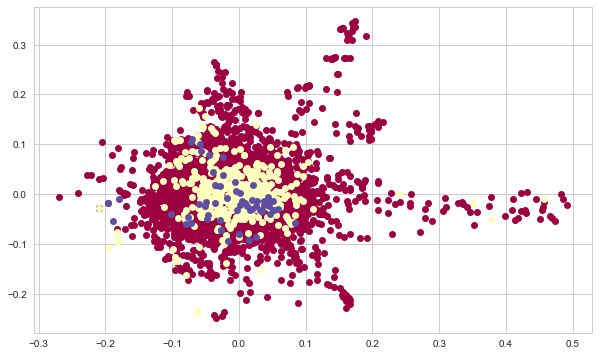

8 14
8 14
8 14


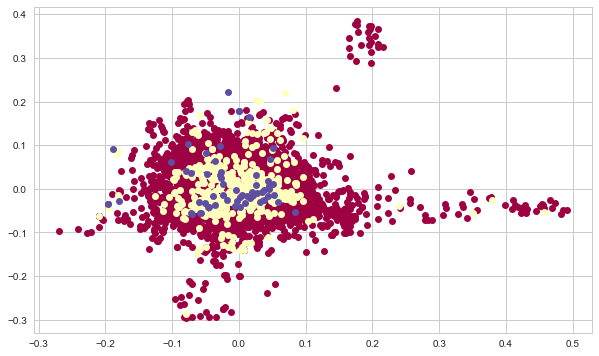

8 15
8 15
8 15


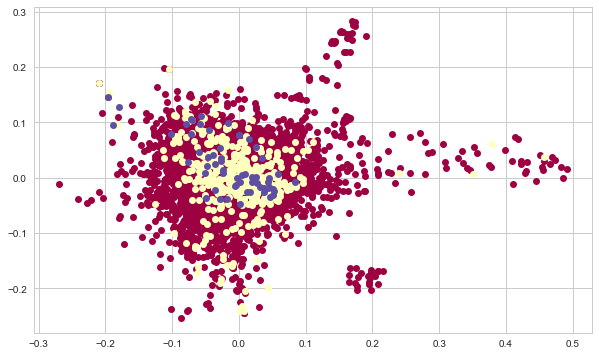

9 0
9 0
9 0


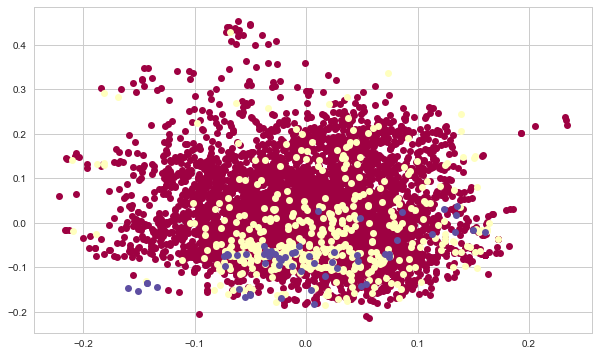

9 1
9 1
9 1


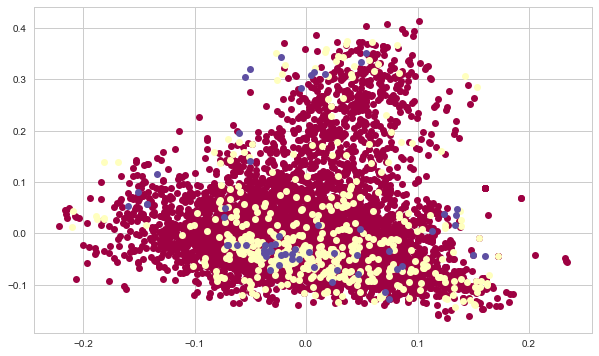

9 2
9 2
9 2


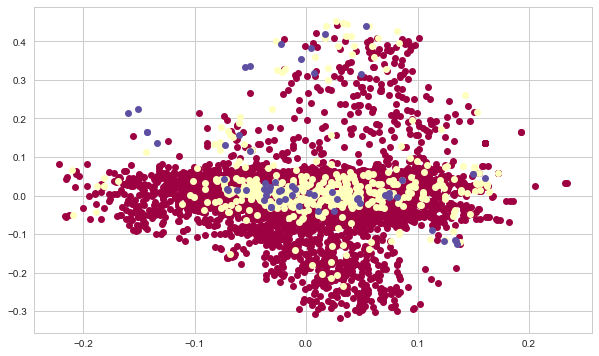

9 3
9 3
9 3


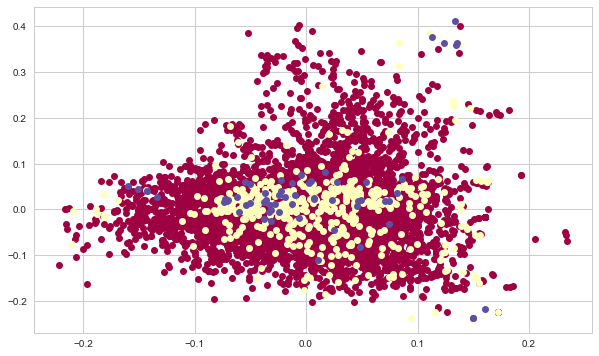

9 4
9 4
9 4


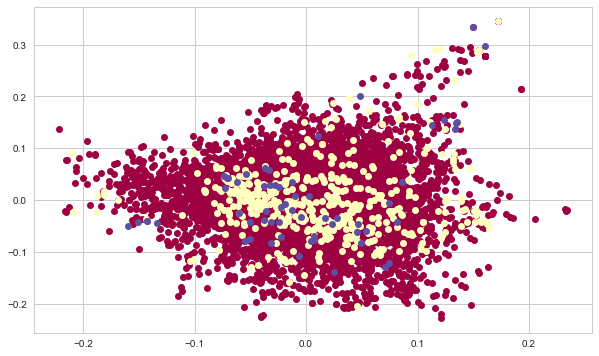

9 5
9 5
9 5


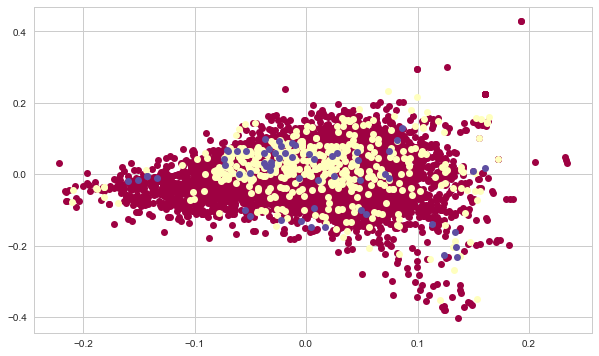

9 6
9 6
9 6


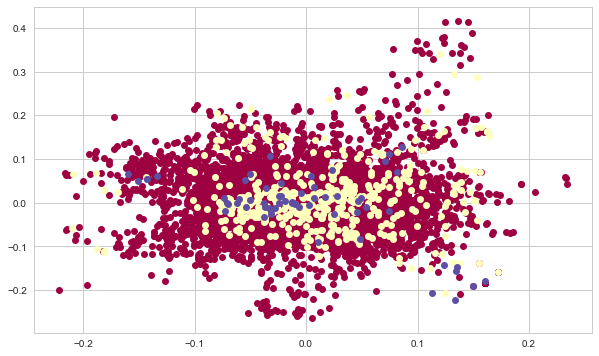

9 7
9 7
9 7


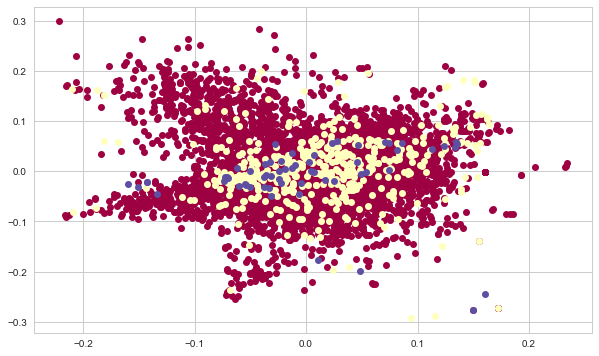

9 8
9 8
9 8


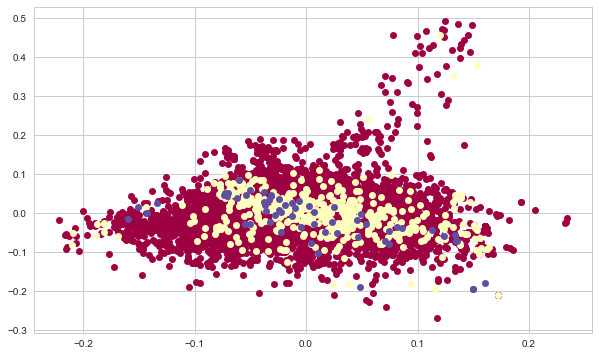

9 9
9 9
9 9


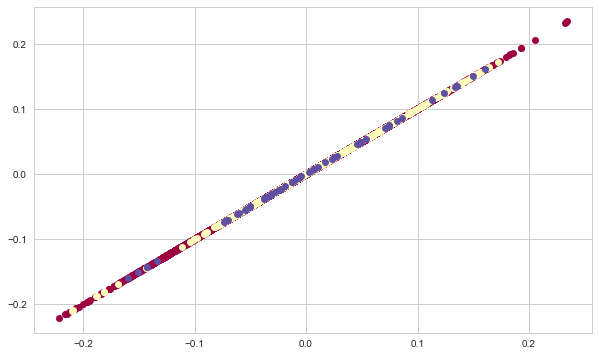

9 10
9 10
9 10


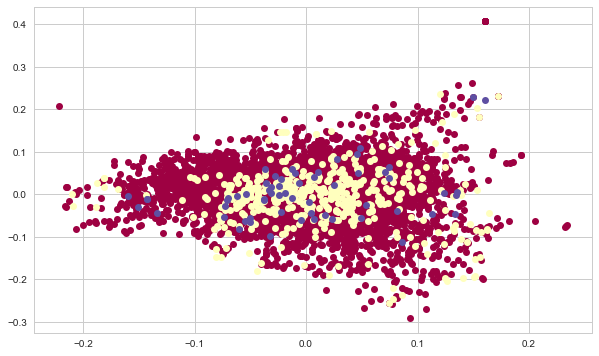

9 11
9 11
9 11


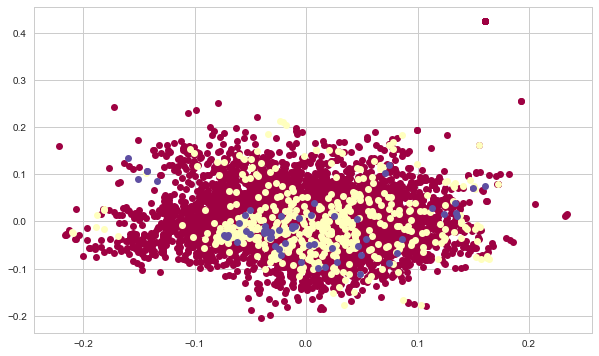

9 12
9 12
9 12


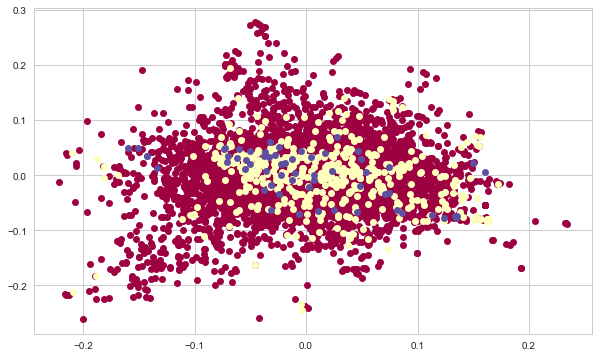

9 13
9 13
9 13


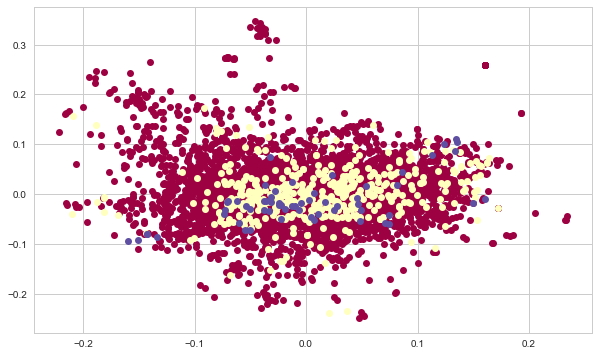

9 14
9 14
9 14


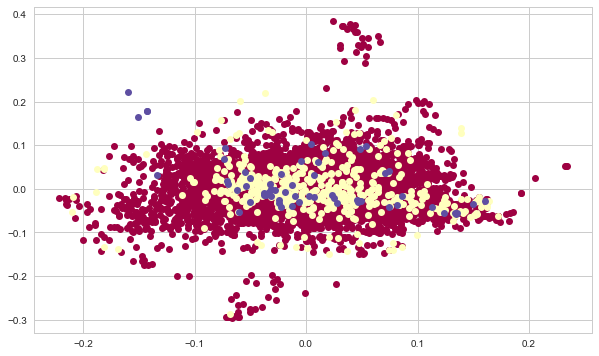

9 15
9 15
9 15


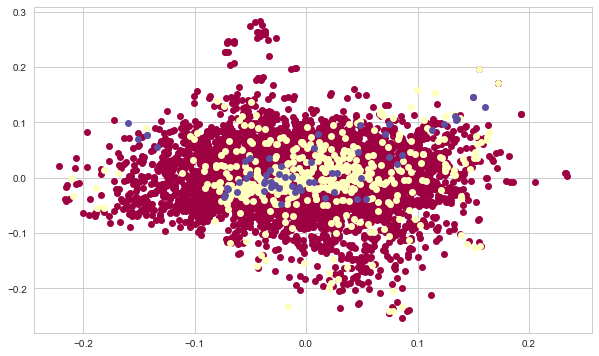

10 0
10 0
10 0


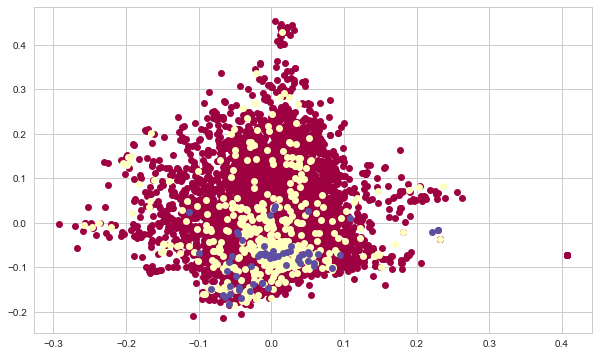

10 1
10 1
10 1


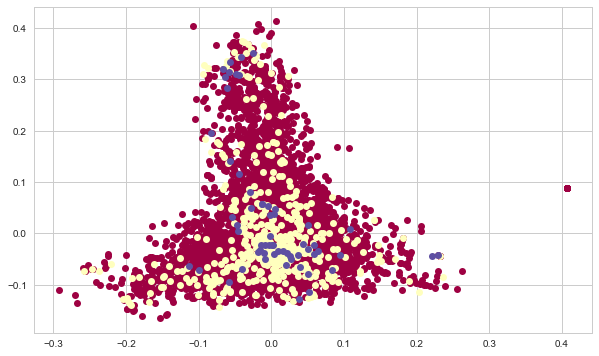

10 2
10 2
10 2


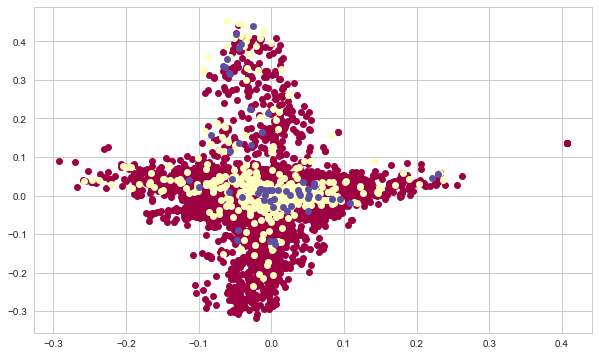

10 3
10 3
10 3


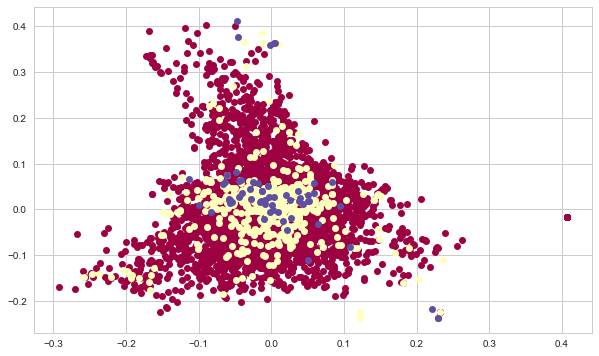

10 4
10 4
10 4


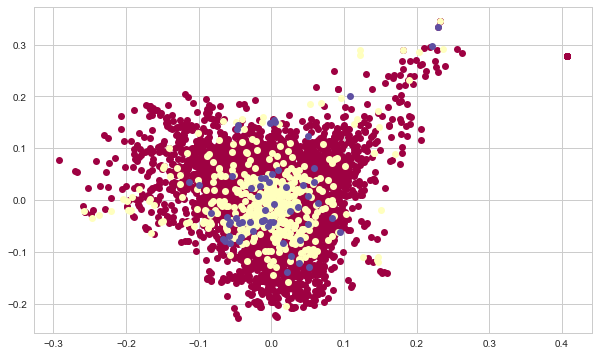

10 5
10 5
10 5


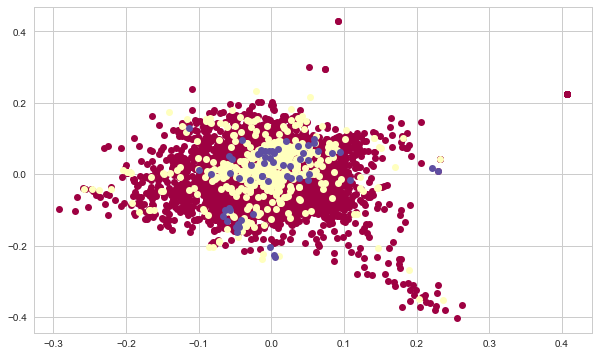

10 6
10 6
10 6


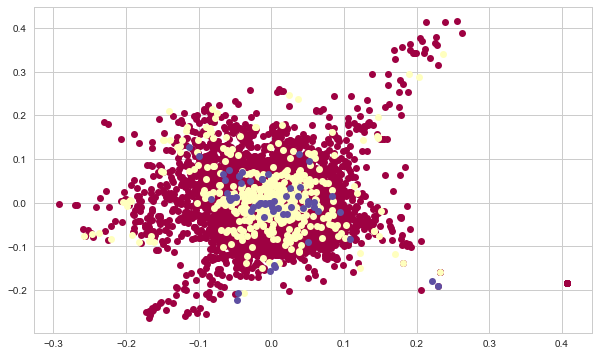

10 7
10 7
10 7


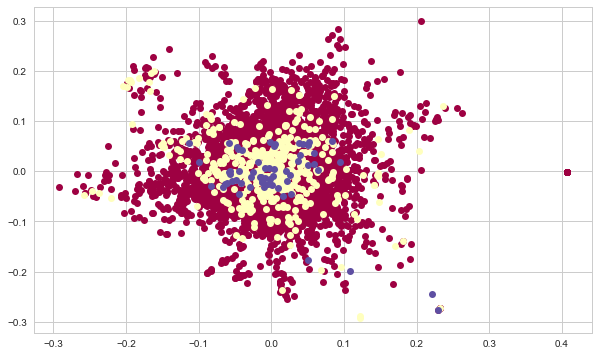

10 8
10 8
10 8


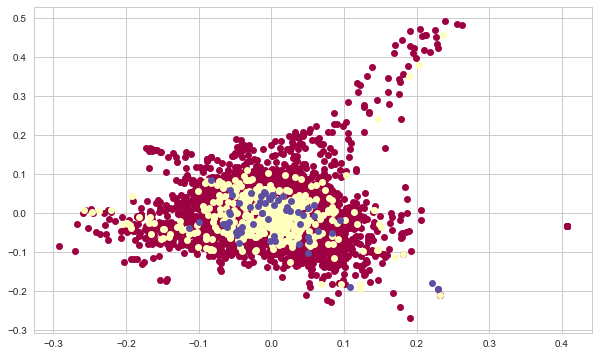

10 9
10 9
10 9


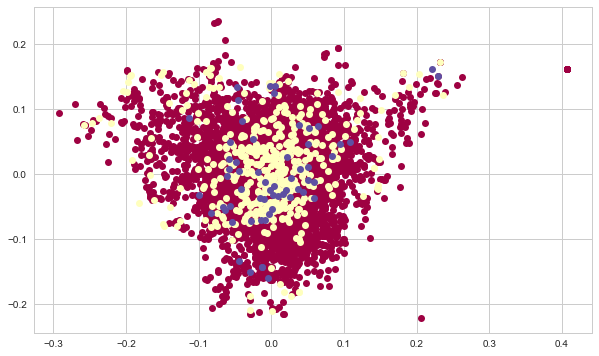

10 10
10 10
10 10


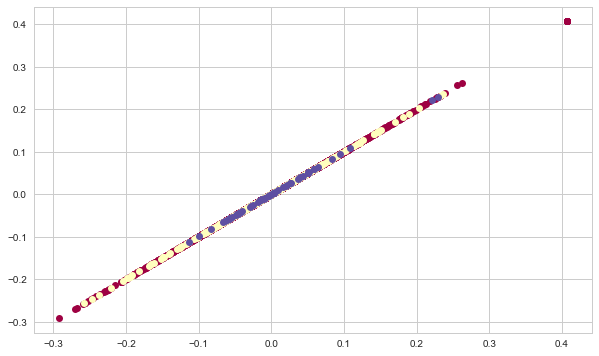

10 11
10 11
10 11


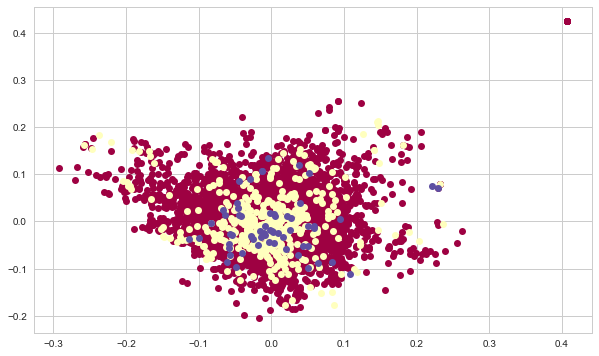

10 12
10 12
10 12


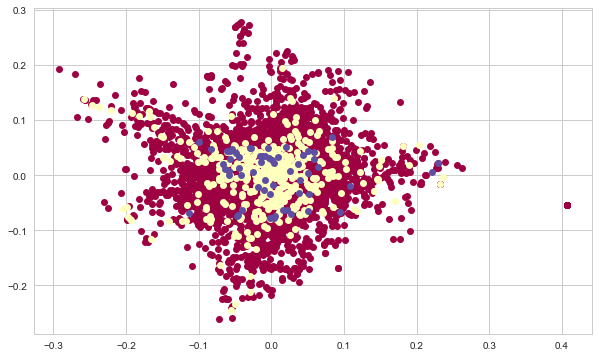

10 13
10 13
10 13


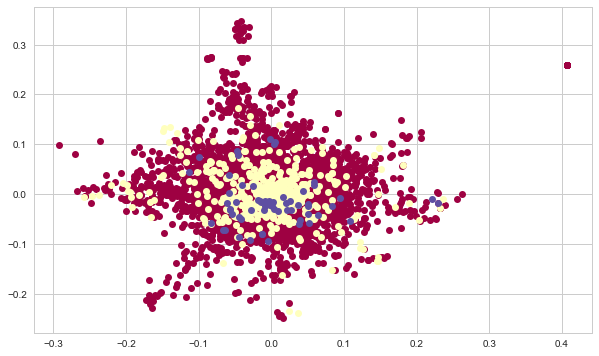

10 14
10 14
10 14


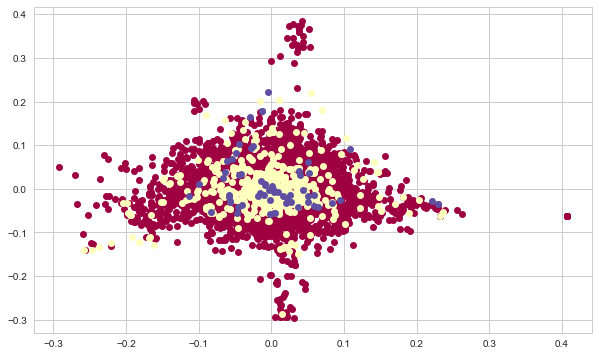

10 15
10 15
10 15


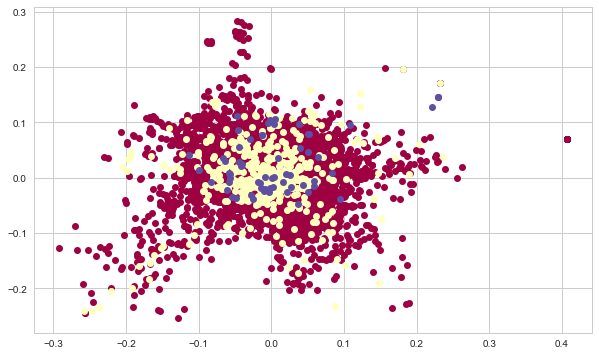

11 0
11 0
11 0


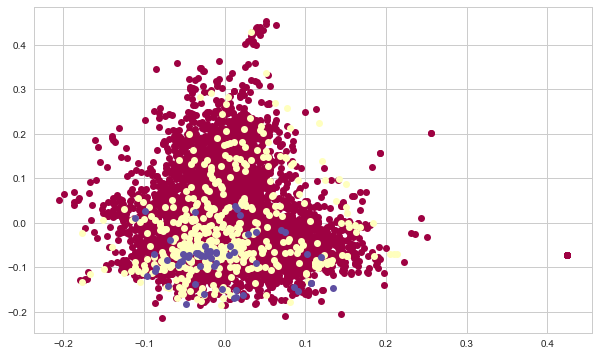

11 1
11 1
11 1


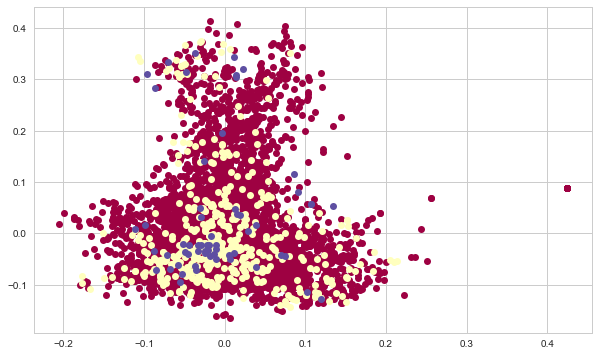

11 2
11 2
11 2


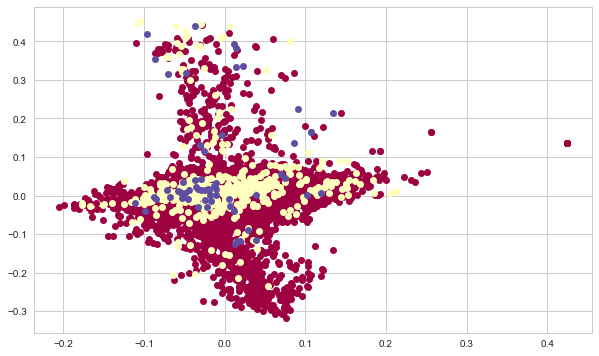

11 3
11 3
11 3


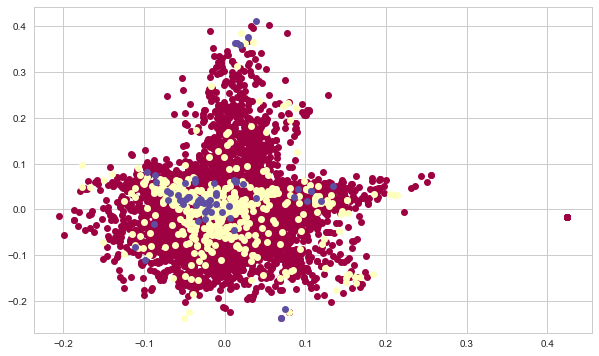

11 4
11 4
11 4


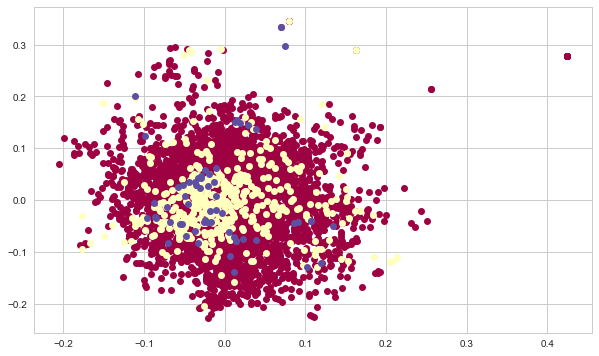

11 5
11 5
11 5


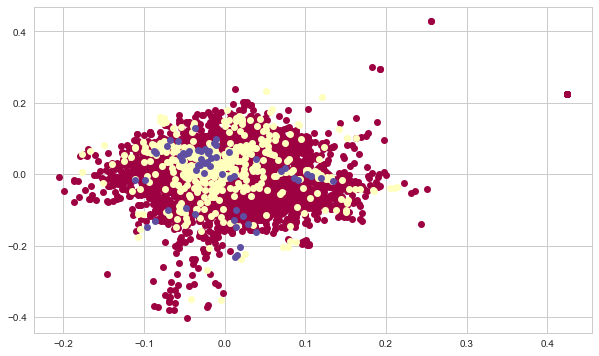

11 6
11 6
11 6


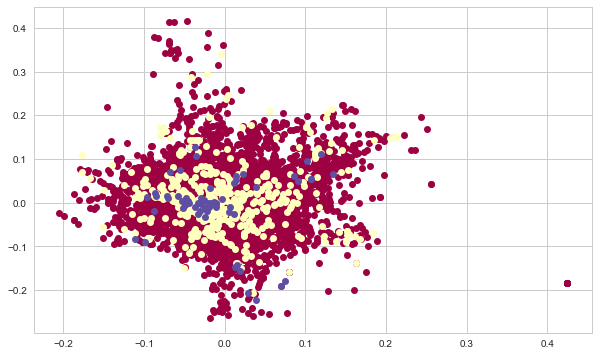

11 7
11 7
11 7


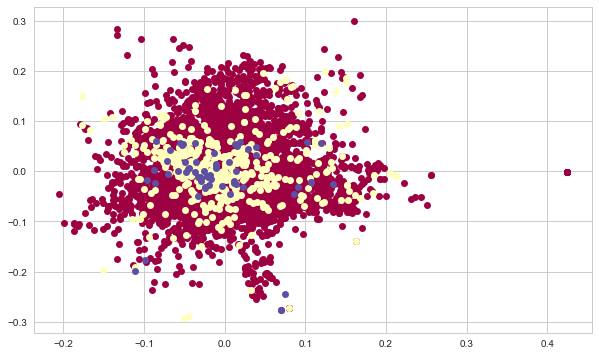

11 8
11 8
11 8


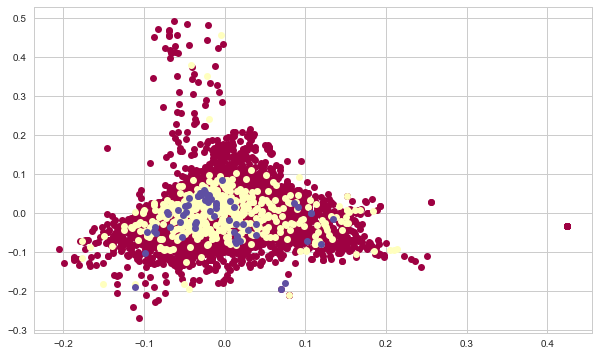

11 9
11 9
11 9


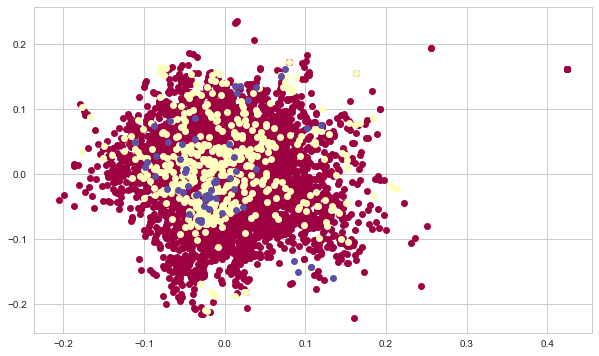

11 10
11 10
11 10


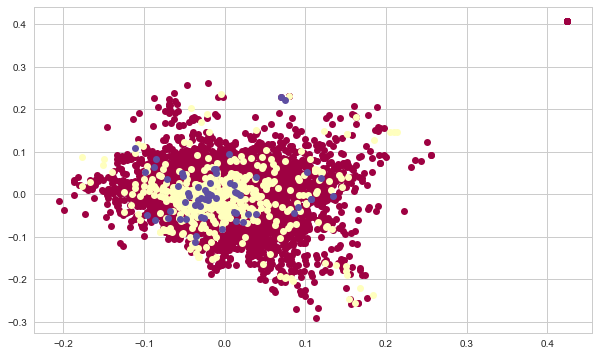

11 11
11 11
11 11


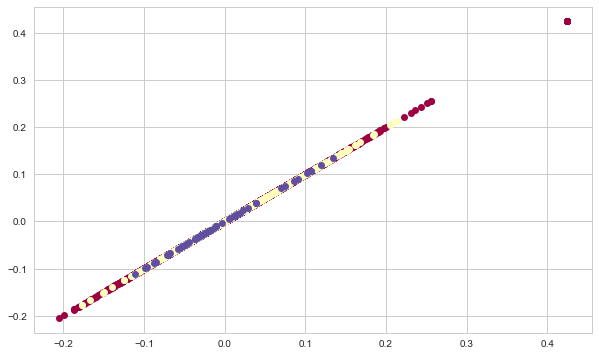

11 12
11 12
11 12


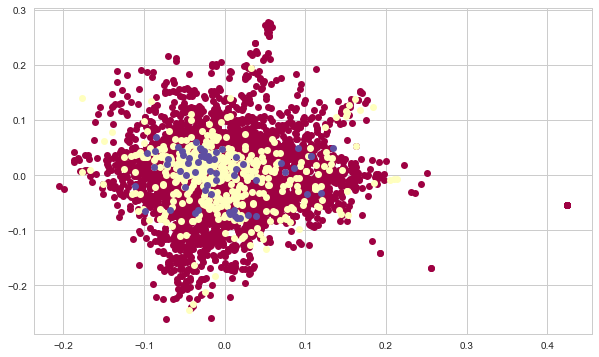

11 13
11 13
11 13


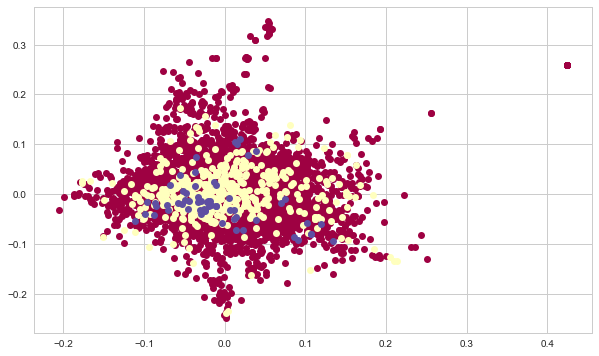

11 14
11 14
11 14


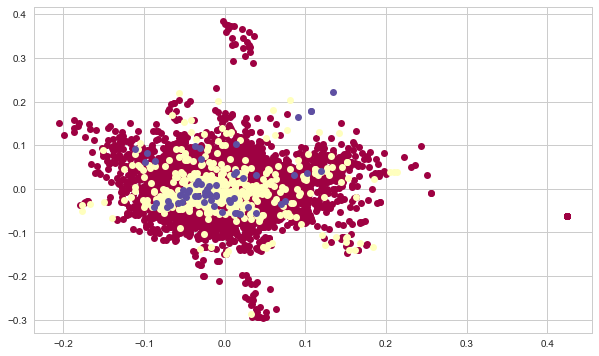

11 15
11 15
11 15


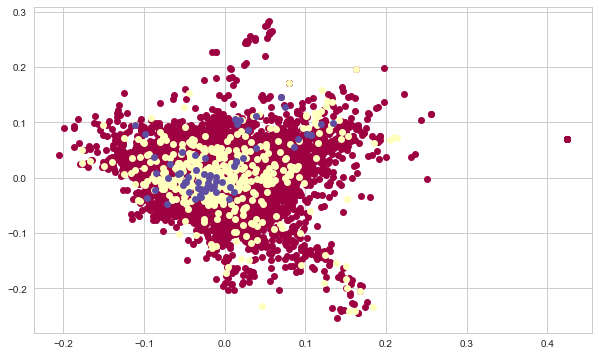

12 0
12 0
12 0


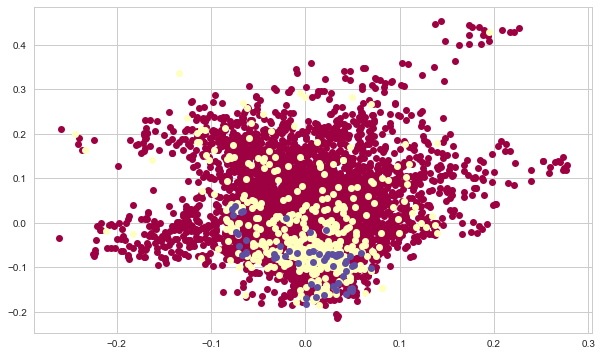

12 1
12 1
12 1


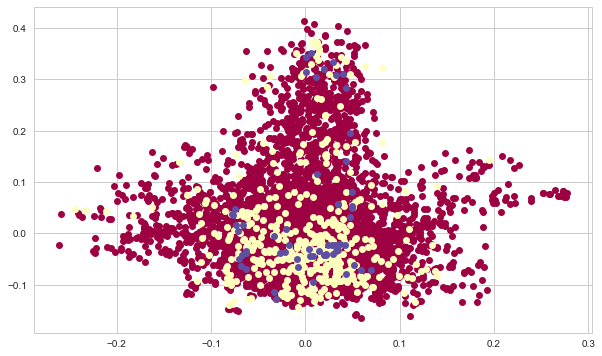

12 2
12 2
12 2


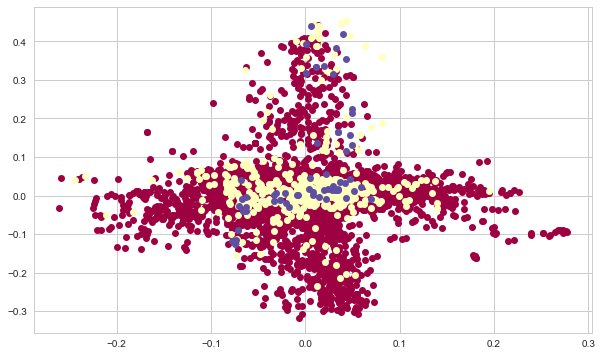

12 3
12 3
12 3


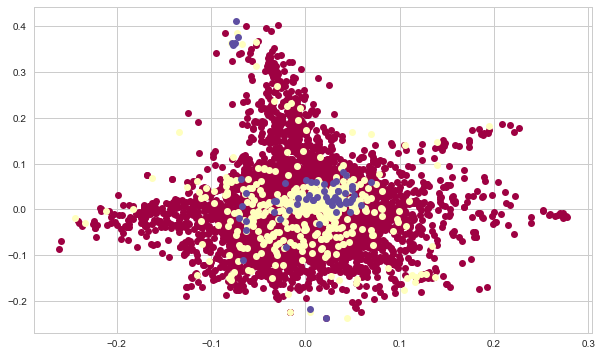

12 4
12 4
12 4


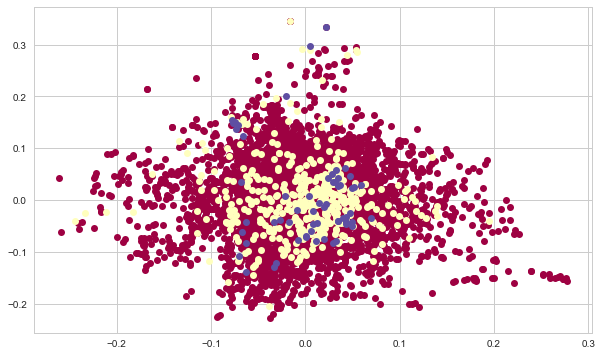

12 5
12 5
12 5


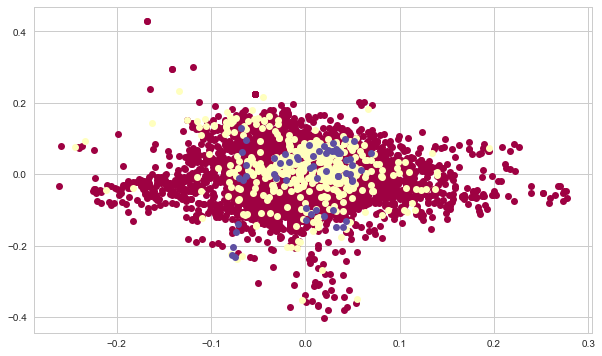

12 6
12 6
12 6


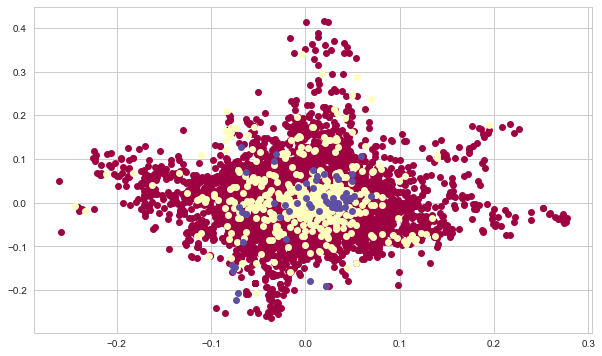

12 7
12 7
12 7


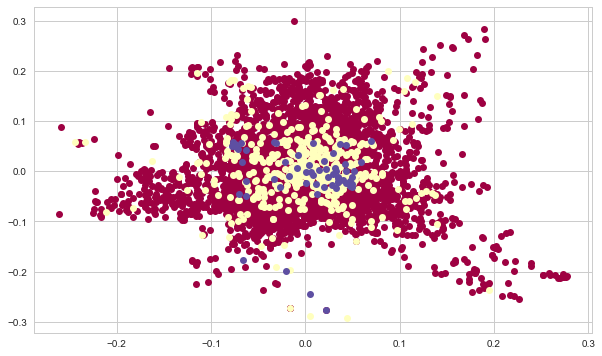

12 8
12 8
12 8


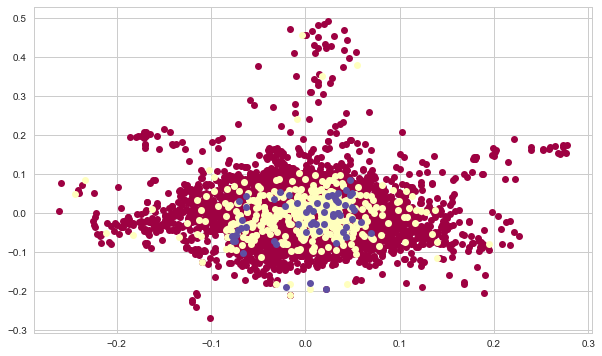

12 9
12 9
12 9


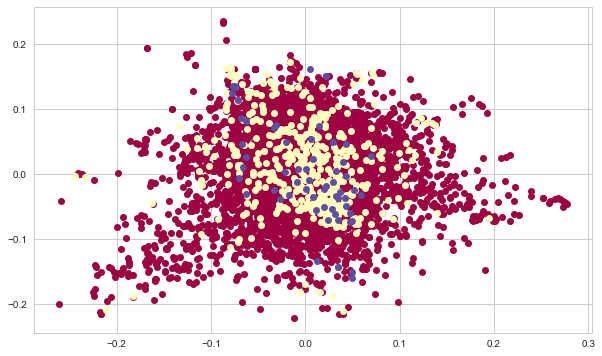

12 10
12 10
12 10


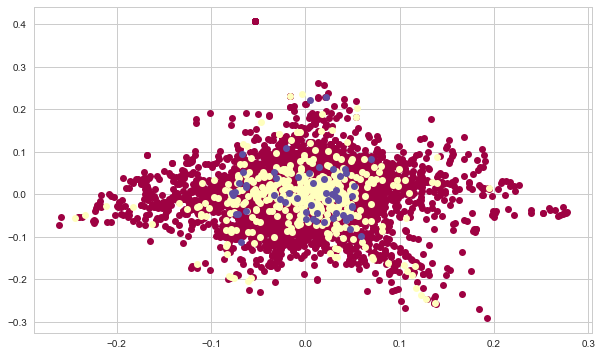

12 11
12 11
12 11


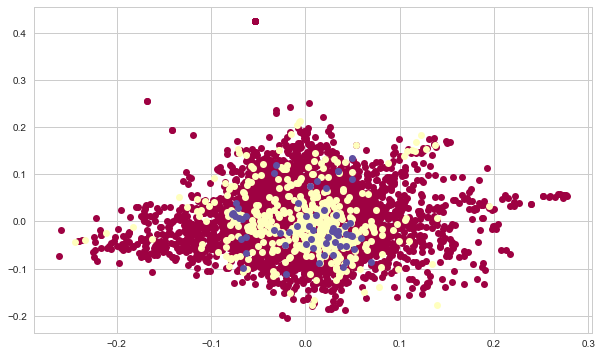

12 12
12 12
12 12


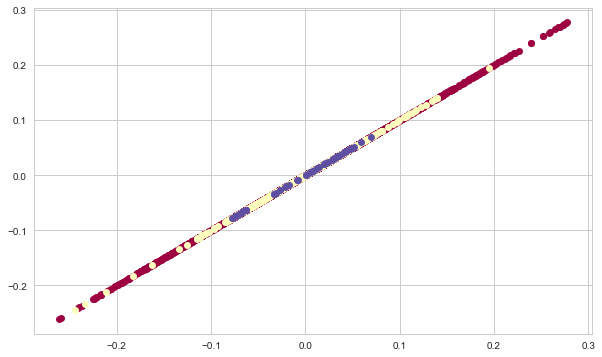

12 13
12 13
12 13


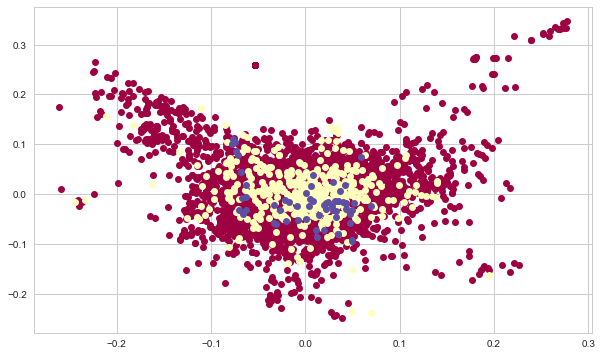

12 14
12 14
12 14


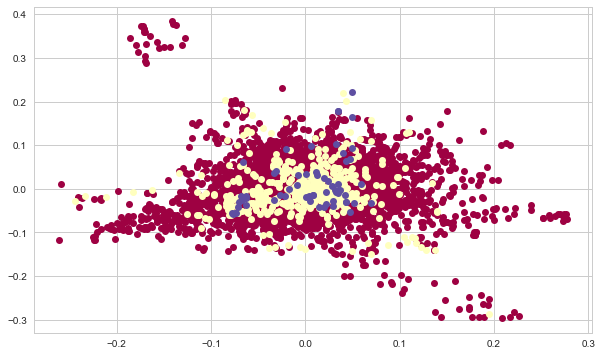

12 15
12 15
12 15


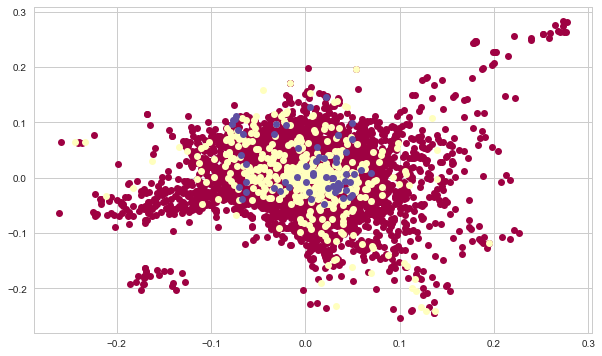

13 0
13 0
13 0


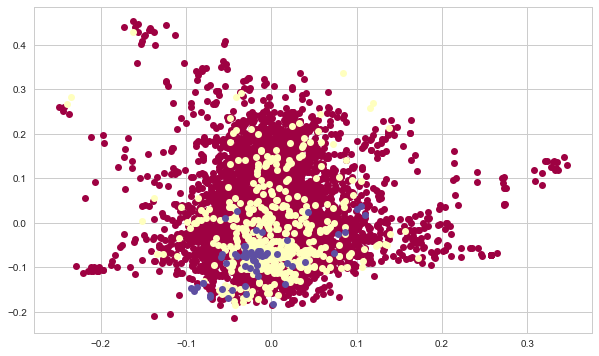

13 1
13 1
13 1


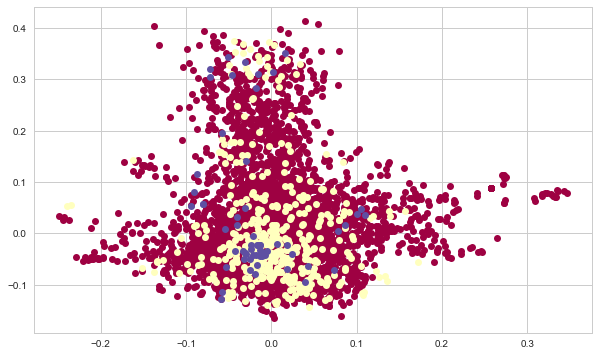

13 2
13 2
13 2


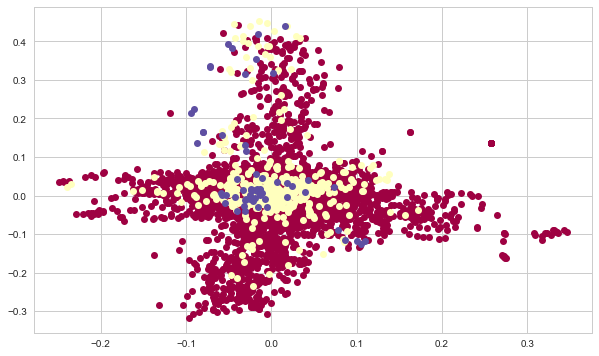

13 3
13 3
13 3


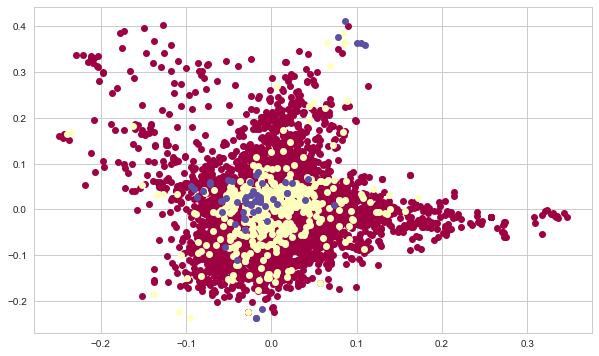

13 4
13 4
13 4


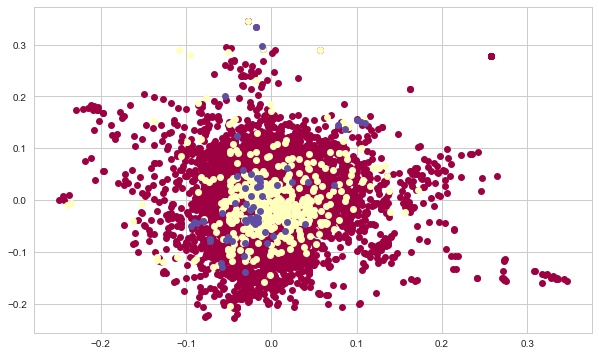

13 5
13 5
13 5


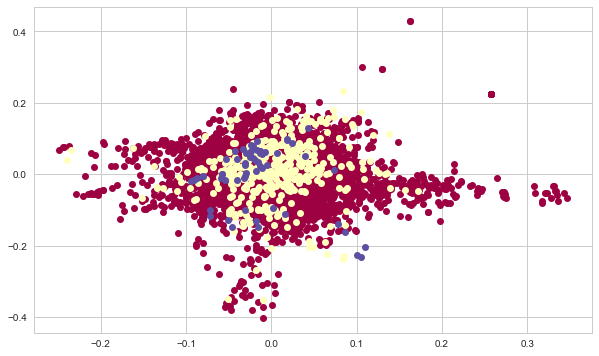

13 6
13 6
13 6


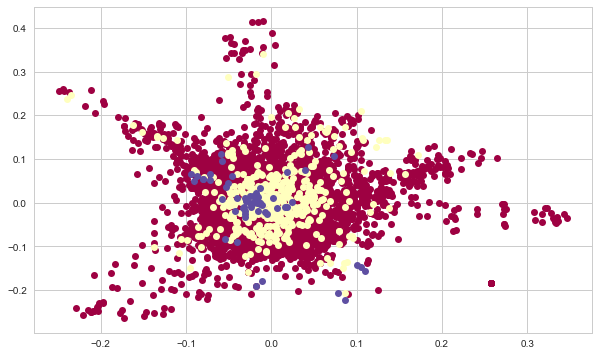

13 7
13 7
13 7


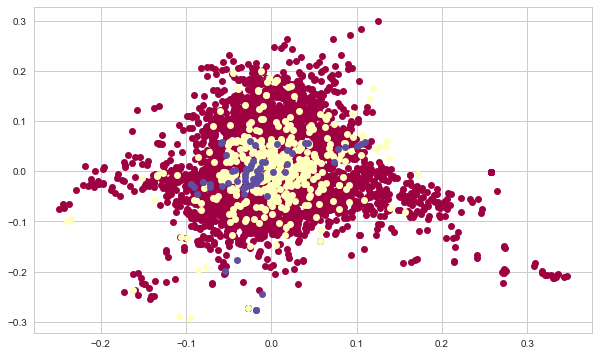

13 8
13 8
13 8


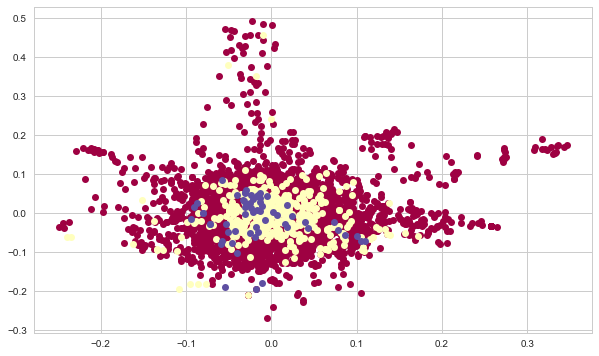

13 9
13 9
13 9


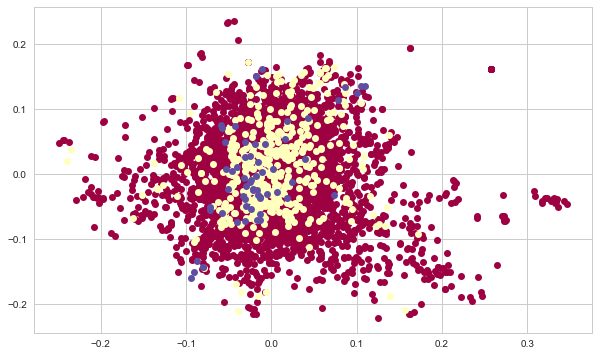

13 10
13 10
13 10


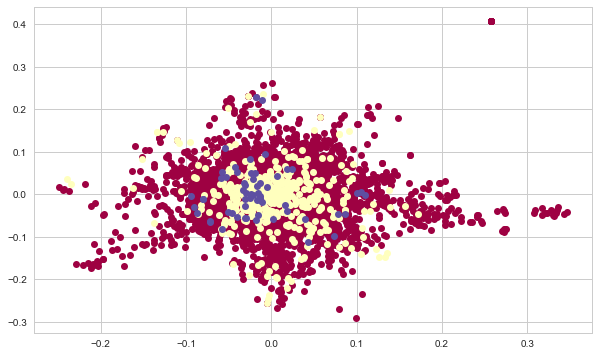

13 11
13 11
13 11


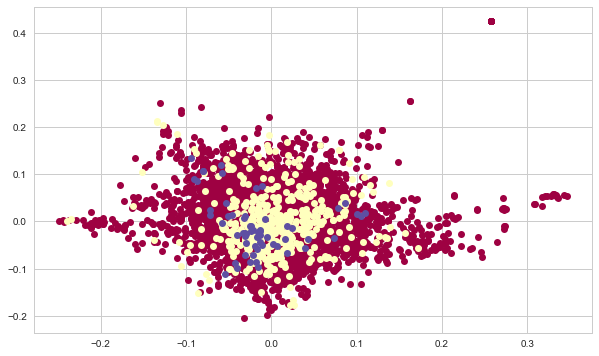

13 12
13 12
13 12


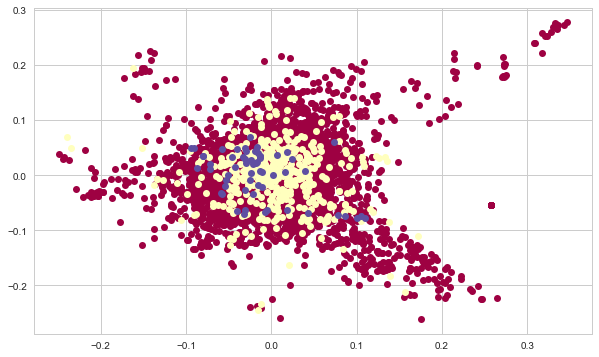

13 13
13 13
13 13


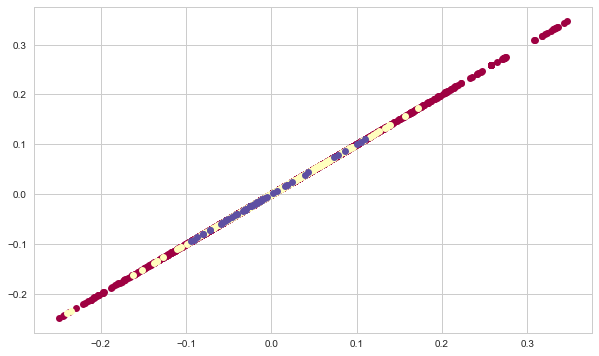

13 14
13 14
13 14


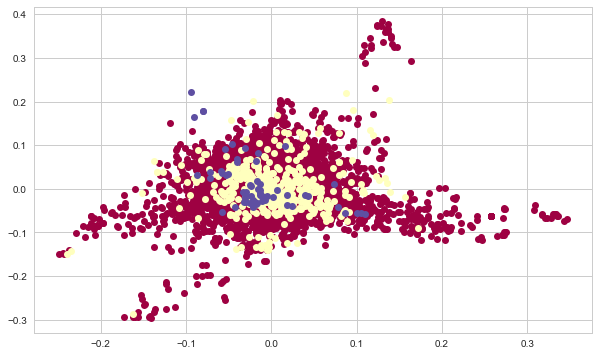

13 15
13 15
13 15


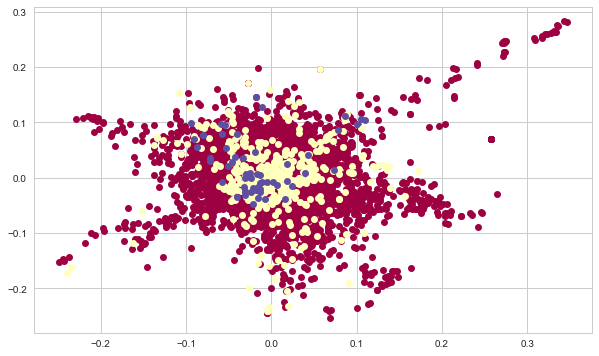

14 0
14 0
14 0


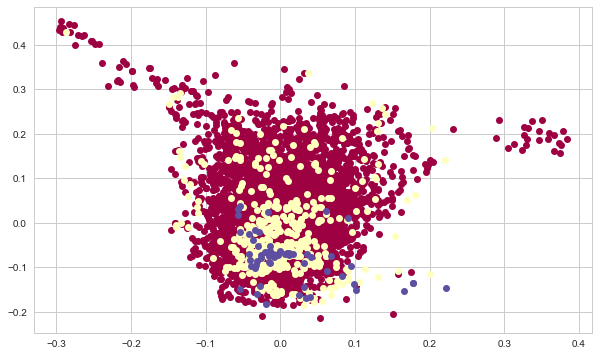

14 1
14 1
14 1


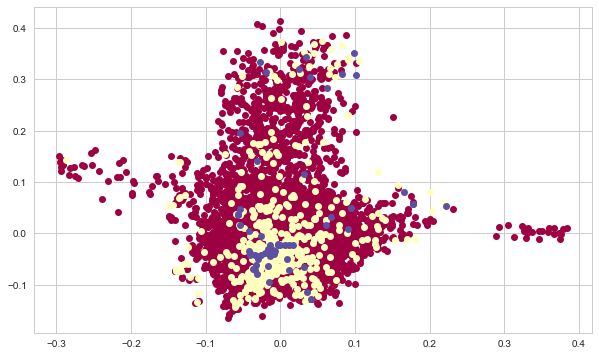

14 2
14 2
14 2


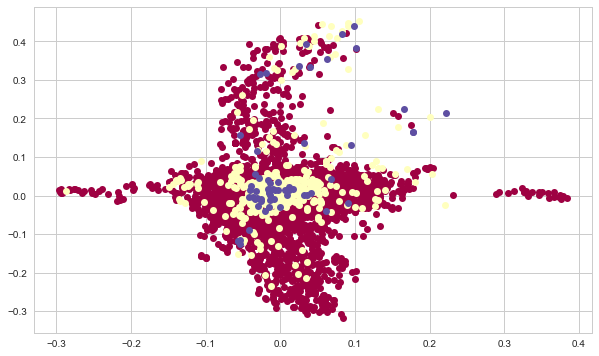

14 3
14 3
14 3


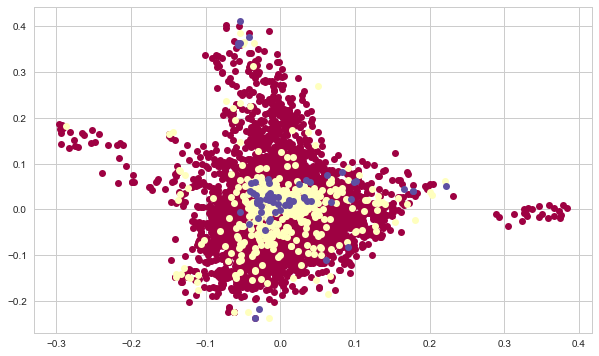

14 4
14 4
14 4


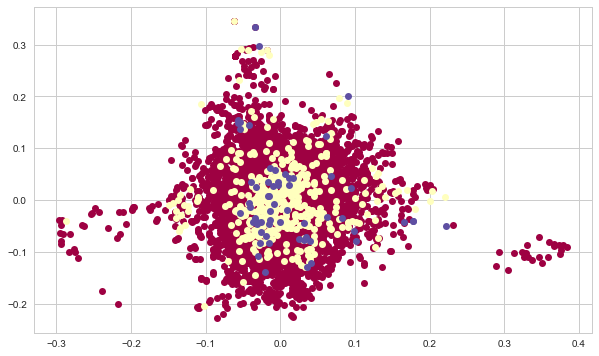

14 5
14 5
14 5


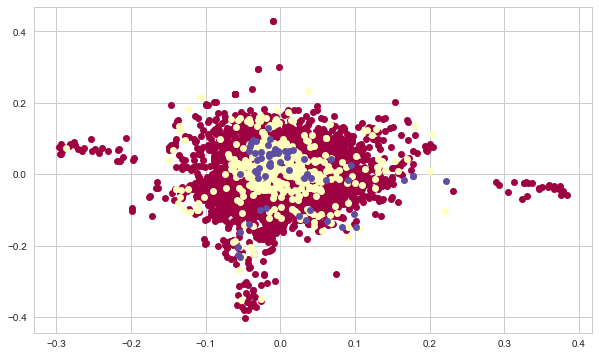

14 6
14 6
14 6


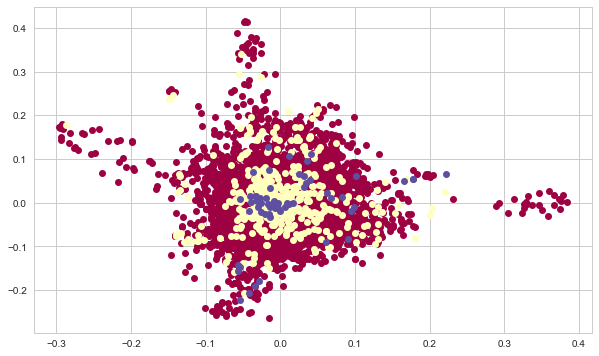

14 7
14 7
14 7


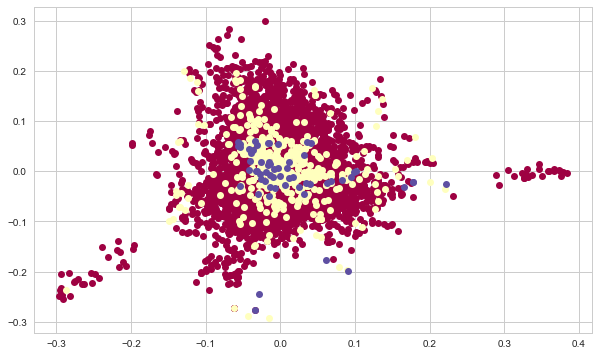

14 8
14 8
14 8


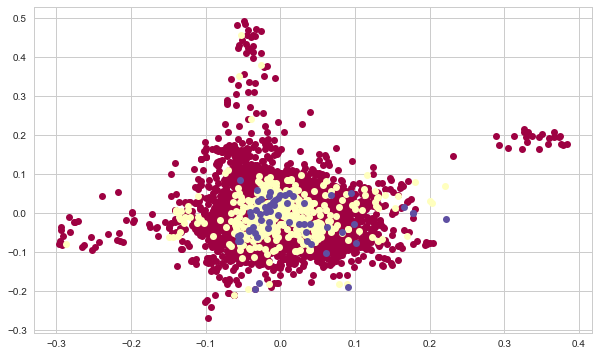

14 9
14 9
14 9


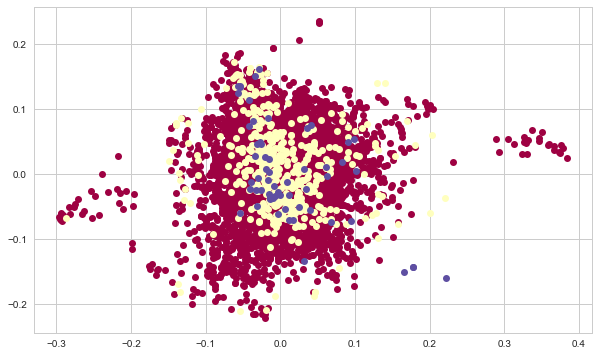

14 10
14 10
14 10


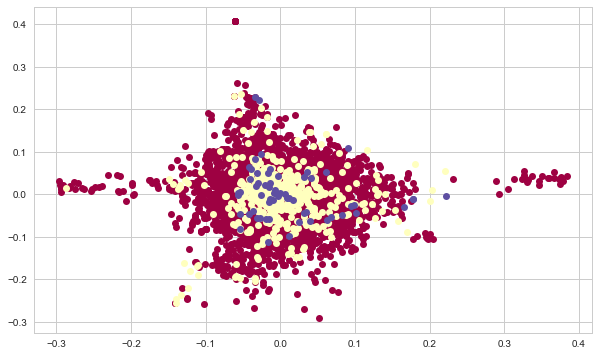

14 11
14 11
14 11


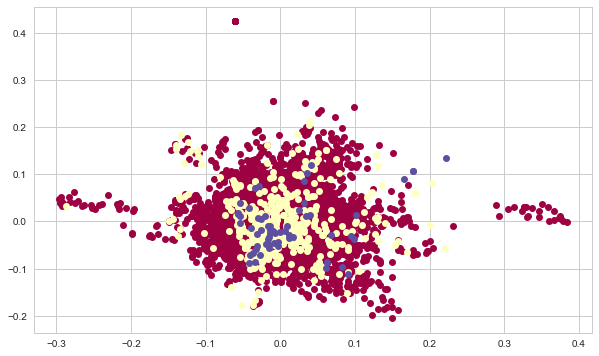

14 12
14 12
14 12


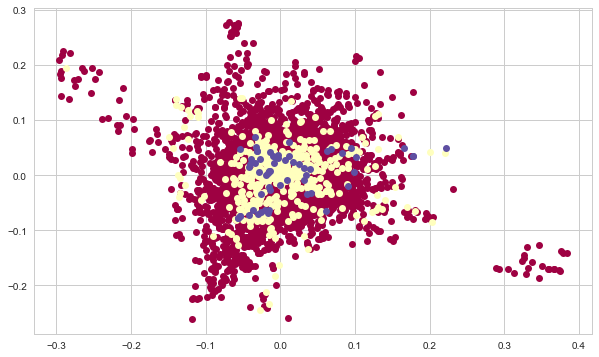

14 13
14 13
14 13


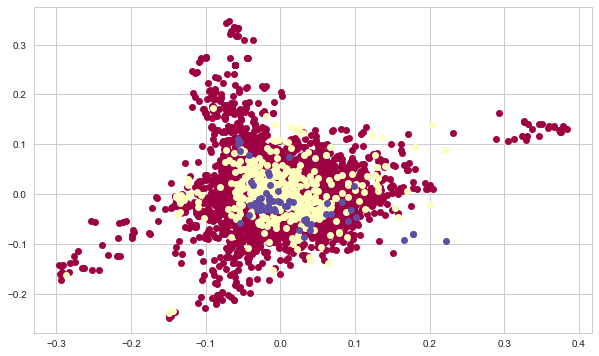

14 14
14 14
14 14


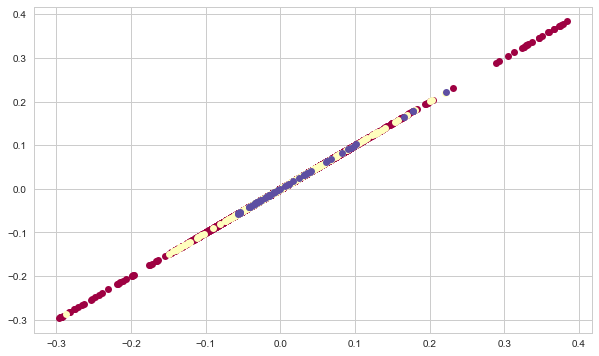

14 15
14 15
14 15


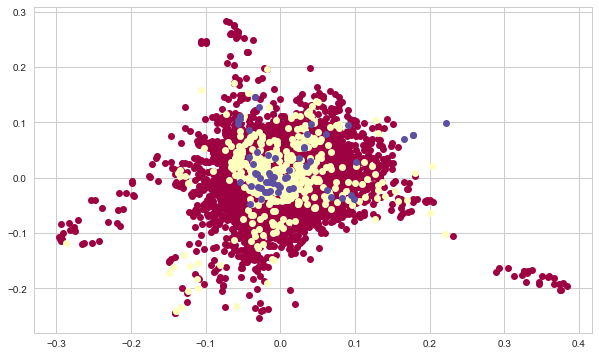

15 0
15 0
15 0


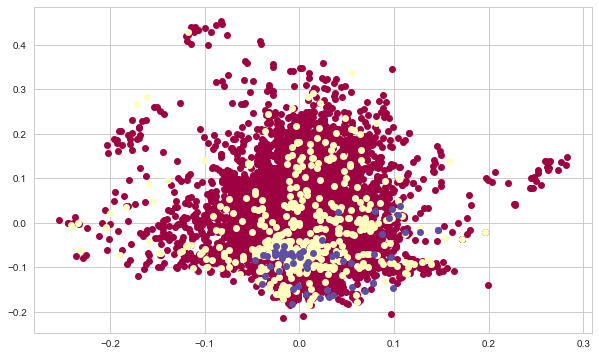

15 1
15 1
15 1


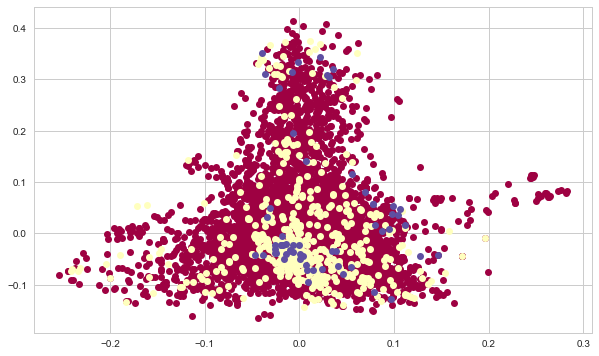

15 2
15 2
15 2


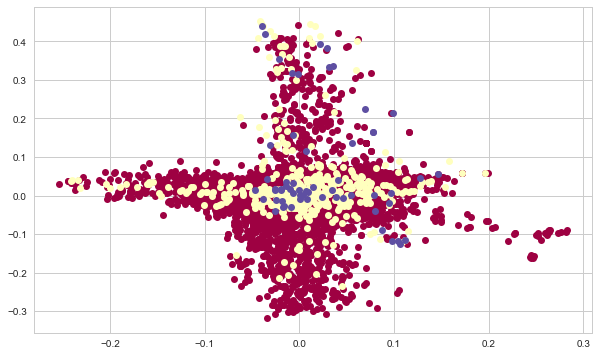

15 3
15 3
15 3


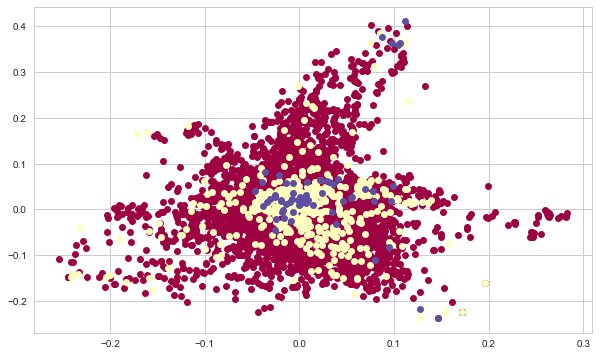

15 4
15 4
15 4


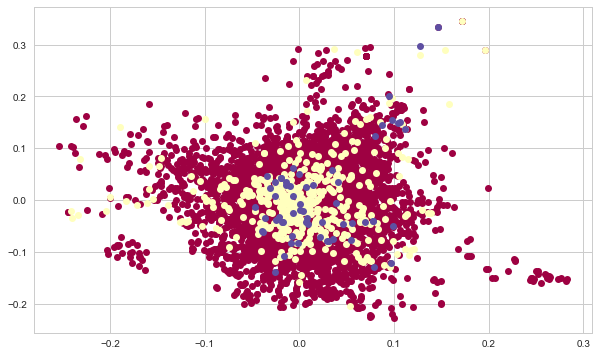

15 5
15 5
15 5


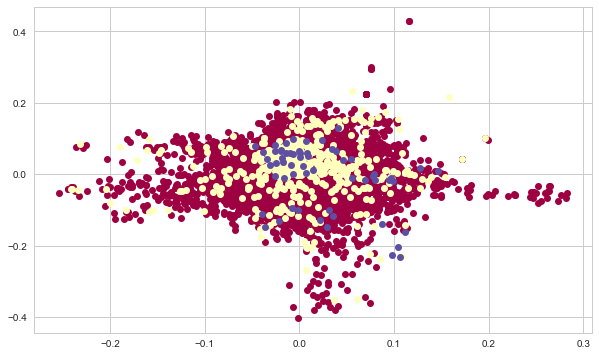

15 6
15 6
15 6


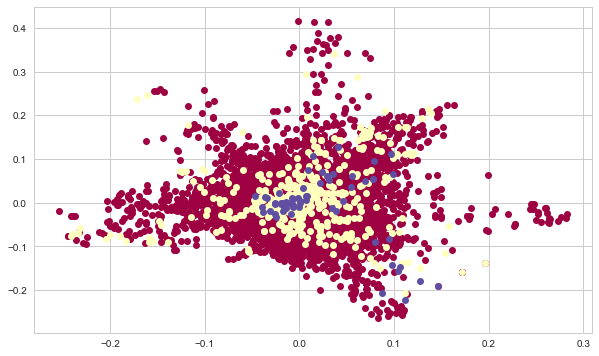

15 7
15 7
15 7


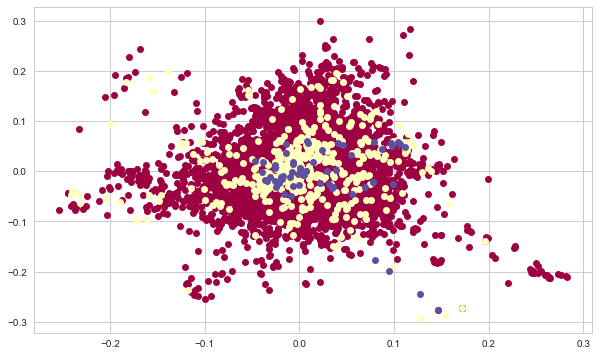

15 8
15 8
15 8


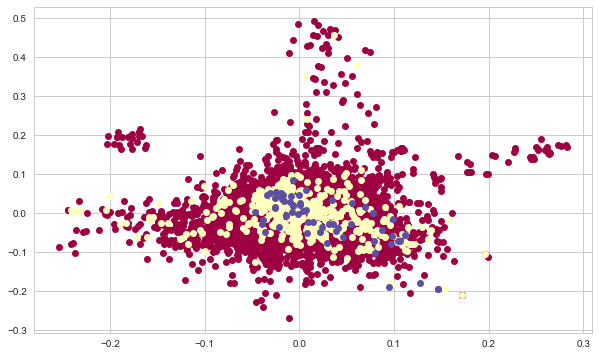

15 9
15 9
15 9


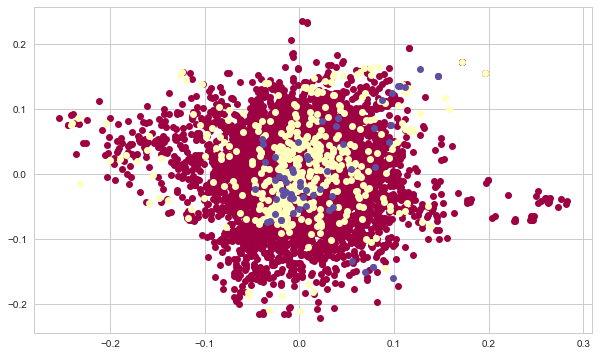

15 10
15 10
15 10


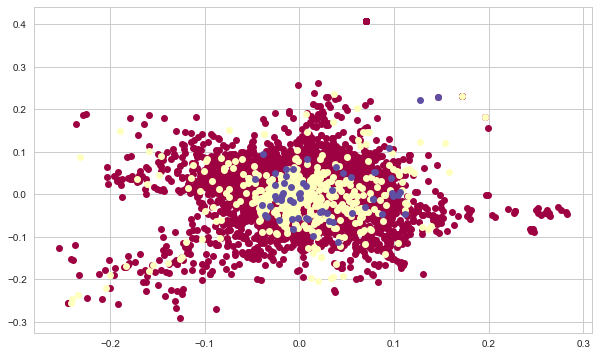

15 11
15 11
15 11


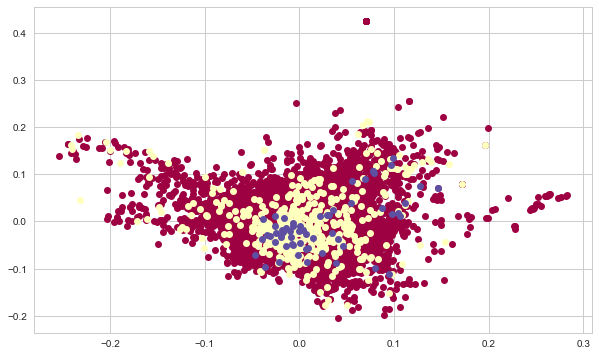

15 12
15 12
15 12


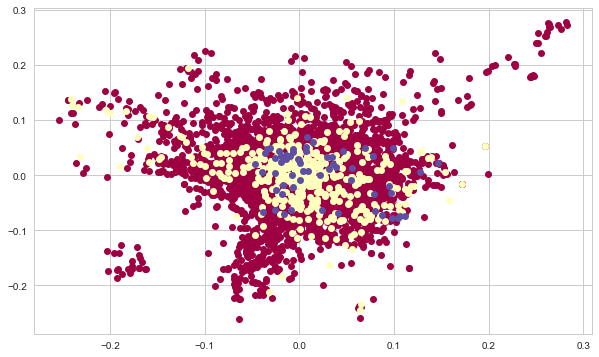

15 13
15 13
15 13


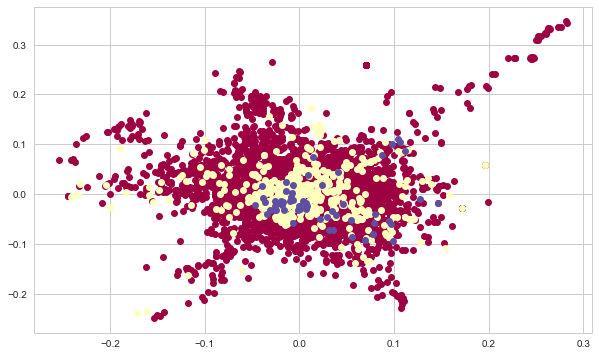

15 14
15 14
15 14


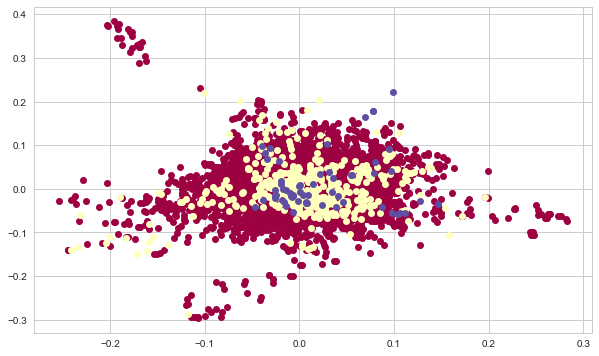

15 15
15 15
15 15


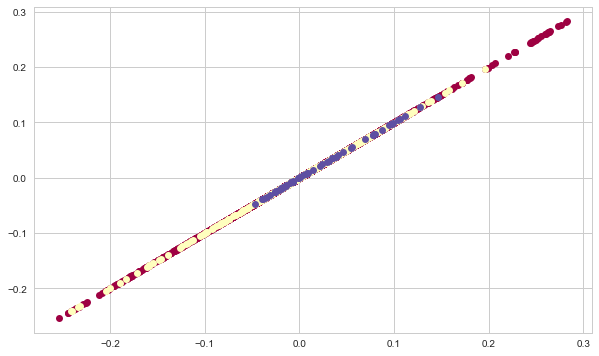

In [223]:
for n1 in range(16)    :
    for n2 in range(16):
        
        figure(figsize=(20, 20))

        labels = df_threads['cat_tail'].values

        unique_labels = set(df_threads['cat_tail'].values)
        colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))
        pylab.figure(figsize = (10, 6))
        for k, col in zip(unique_labels, colors):
            if k == -1:
                col = 'k'

            class_member_mask = (labels == k)

            xy = X_pca[class_member_mask]
            print(n1, n2)
            plt.plot(xy[:, n1], xy[:, n2], 'o', markerfacecolor=col,
                     markeredgecolor='k', markersize=7)

        plt.show()

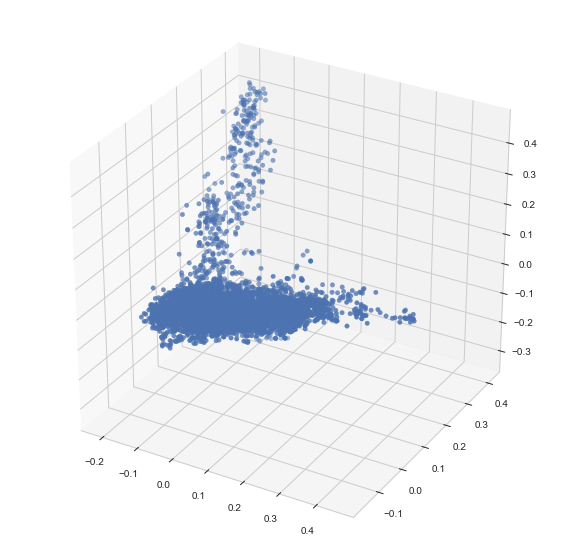

In [259]:
X = X_pca[:, 0]
Y = X_pca[:, 1]
Z = X_pca[:, 2]
fig = plt.figure(figsize=(10, 10))
ax = fig.gca(projection='3d')

ax.scatter(X, Y, Z)

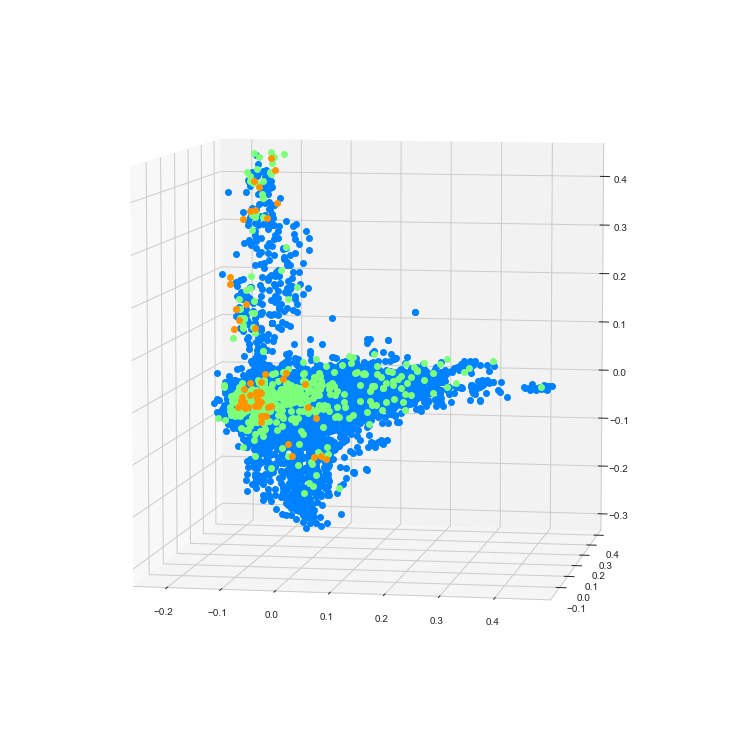

In [261]:
import time as time
import numpy as np
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d.axes3d as p3
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets.samples_generator import make_swiss_roll

label = df_threads['cat_tail'].values
fig = plt.figure(figsize=(10, 10))
ax = p3.Axes3D(fig)
ax.view_init(7, -80)
for l in np.unique(label):
    ax.plot3D(X_pca[label == l, 0], X_pca[label == l, 1], X_pca[label == l, 2],
              'o', color=plt.cm.jet(np.float(l) / np.max(label + 1)))


In [173]:
Counter(df_threads['cat_tail'])

Counter({1: 7292, 2: 466, 3: 60})

In [221]:
data_train, data_test, y_train, y_test = train_test_split(df_threads['clean_content'].values, 
                                                          df_threads['tail_norm'].values, test_size=0.25)
vect = TfidfVectorizer(sublinear_tf=True, use_idf=True)
X_train = vect.fit_transform(data_train)
X_test = vect.transform(data_test)
feature = vect.get_feature_names()

In [222]:
from sklearn import linear_model
reg = linear_model.Ridge(alpha = 0.9, tol = 0.003)
y_reg = reg.fit(X_train, y_train).predict(X_test)
coef = reg.coef_
print(mean_squared_error(y_test, y_reg))

3.69310203181


Исследование коэффициентов

In [80]:
df = pd.DataFrame()
df['featurs'] = list(feature)
df['coef'] = list(coef)
df = df.sort_values(by = 'coef', ascending=False)
df

,featurs,coef
4188,court,13.730163
4734,dede,12.892084
852,apb,12.285799
2163,bout,12.258587
21237,yuk,11.768886
14159,peak,10.405084
19251,tino,9.849839
5428,doe,9.727593
10759,langley,9.180795
1406,babysitting,9.119905


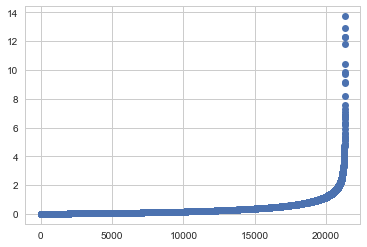

In [91]:
plt.plot(range(len(df)), sort(df['coef'].map(abs)), 'o')
plt.show()

In [95]:
df['abs_coef'] = df['coef'].apply(lambda x: abs(x))

In [98]:
df[(df['abs_coef'] > 0) & (df['abs_coef'] < 0.1)]

,featurs,coef,abs_coef
4820,delegation,0.099932,0.099932
7620,gaming,0.099878,0.099878
20501,wagner,0.099845,0.099845
19590,trick,0.099726,0.099726
18449,suburban,0.099726,0.099726
4461,cybergoblins,0.099726,0.099726
18994,tent,0.099664,0.099664
893,applcation,0.099566,0.099566
6957,feedstock,0.099549,0.099549
1231,attn,0.099532,0.099532


##### Использование word2vec

In [25]:
emails_df = emails_df.dropna()
emails_df

,Date,From,To,Subject,content,TimeAll,Year,clean_content,weigh_content,Index,Number_of_thread,count_threads
0,2000-01-01 14:36:00,"(rozenset({""'sally.beck@enron.com'""})","(rozenset({""'fernley.dyson@enron.com'""})",happy new year - no y2k fear!,We are wrapping up several hours in the office...,946726560.0,2000,wrapping several hour office tested commodity ...,0.406400,0,4700,1
1,2000-01-01 19:17:00,"(rozenset({""'lenos@ucy.ac.cy'""})","(rozenset({""'gordon.sick@rogroup.com'""})",program attached; march ny ro conference/parti...,The current version of the conference program ...,946743420.0,2000,current version conference program attached pl...,0.186760,1,741,1
2,2000-01-02 13:12:00,"(rozenset({""'andrew.parsons@enron.com'""})","( "" 'richard.causey@enron.com'"", "" 'mark.palm...",summary of y2k glitches,Following please find a summary of the minor Y...,946807920.0,2000,following please find summary minor k related ...,0.950536,2,29998,1
3,2000-01-03 06:17:00,"(rozenset({""'emoler@velaw.com'""})","(rozenset({""'steven.kean@enron.com'"", "" 'cynt...",options memo,Here's the options memo you requested. Happy ...,946869420.0,2000,option memo requested happy new year betsy doc...,0.000000,3,3288,1
4,2000-01-03 08:20:00,"(rozenset({""'steven.kean@enron.com'""})","(rozenset({""'maureen.mcvicker@enron.com'""})",additions to working groups,yes -- just make sure the working group lead...,946876800.0,2000,yes make sure working group leader know mauree...,-0.354024,4,3245,1
5,2000-01-03 08:33:00,"(rozenset({""'steven.kean@enron.com'""})","(rozenset({""'paul.kaufman@enron.com'""})",testimony in pge proceeding,I won't be able to attend. Let me know if I n...,946877580.0,2000,able attend let know need hooked phone brief a...,0.310965,5,29983,1
7,2000-01-03 09:32:00,"(rozenset({""'chris.dorland@enron.com'""})","(rozenset({""'jean.bell@enron.com'""})",reliant energy,The tag number on this deal is N67904.2\r\r\r\...,946881120.0,2000,tag number deal n please address future deal i...,0.000000,7,46462,1
11,2000-01-03 10:05:00,"(rozenset({""'tim.belden@enron.com'""})","(rozenset({"" 'richard.sanders@enron.com'"", ""'...",capx investigation,"Richard,\r\r\r\nAttached, please find my analy...",946883100.0,2000,richard attached please find analysis px posit...,0.695248,11,19398,1
12,2000-01-03 15:18:00,"(rozenset({""'brent.hendry@enron.com'""})","(rozenset({""'mtaylo1@enron.com'""})",ba deal report,FYI\r\r\r\n---------------------- Forwarded by...,946901880.0,2000,fyi forwarded brent hendry enron development p...,0.757287,12,487,2
13,2000-01-03 19:01:00,"(rozenset({""'gdavid@mdck.com'""})","( "" 'gacox@gsi-net.com'"", "" 'tedjlee@aol.com'...",new telephone number for gail david,Even though I've given you my new phone number...,946915260.0,2000,even though given new phone number thought wou...,0.198088,13,31115,1


In [131]:
df_threads

,Date,From,To,Subject,content,TimeAll,Year,clean_content,weigh_content,Index,Number_of_thread,count_threads,answer,tail,coef
230,2000-01-06 14:48:00,"(rozenset({""'tana.jones@enron.com'""})","(rozenset({""'tobin.carlson@enron.com'""})",limits,How goes figuring out why our positions were s...,947159280.0,2000,go figuring position far,0.000000,230,39411,7,1,6,0.026619
231,2000-01-06 15:00:00,"(rozenset({""'tana.jones@enron.com'""})","(rozenset({""'tobin.carlson@enron.com'""})",limits,I don't know what you mean about the positions...,947160000.0,2000,know mean position defunct,0.000000,231,39411,7,1,5,-0.039491
239,2000-01-06 15:30:00,"(rozenset({""'tana.jones@enron.com'""})","(rozenset({""'tobin.carlson@enron.com'""})",limits,We have no idea! We rely on you to tell us wh...,947161800.0,2000,idea rely tell position,0.000000,239,39411,7,1,4,-1.907033
243,2000-01-06 15:51:00,"(rozenset({""'tana.jones@enron.com'""})","(rozenset({""'tobin.carlson@enron.com'""})",limits,Without calling each of the respective traders...,947163060.0,2000,without calling respective trader know position,0.000000,243,39411,7,1,3,-3.592671
360,2000-01-07 17:34:00,"(rozenset({""'vince.kaminski@enron.com'""})","(rozenset({""'shirley.crenshaw@enron.com'""})",vacation,"Shirley,\r\r\n\r\r\nNo problem.\r\r\n\r\r\nVin...",947255640.0,2000,shirley problem vince shirley crenshaw vince k...,2.012083,360,24749,15,1,14,9.477093
595,2000-01-11 11:29:00,"(rozenset({""'gerald.nemec@enron.com'""})","(rozenset({""'kay.young@enron.com'""})",ca data sheet,"Kay, Please review attached. Thanks.\r\r\n",947579340.0,2000,kay please review attached thanks,1.200695,595,22657,14,1,13,0.581222
913,2000-01-14 15:00:00,"(rozenset({""'michael.etringer@enron.com'""})","(rozenset({""'mark.taylor@enron.com'""})",west power customer web site,"Mark,\r\r\n\r\r\nAs discussed, here is the URL...",947851200.0,2000,mark discussed url proposed web site ecthou ln...,0.455828,913,11132,6,1,5,-1.207467
952,2000-01-17 10:34:00,"(rozenset({""'mark.taylor@enron.com'""})","(rozenset({""'information.management@enron.com'""})",your approval is requested,The SRRS indicates there are no requests await...,948094440.0,2000,srrs indicates request awaiting approval infor...,0.812524,952,4331,4,1,3,-10.736031
1030,2000-01-17 22:00:00,"(rozenset({""'jgarven@lsu.edu'""})","(rozenset({""'vince.kaminski@enron.com'""})",lsu seminar visit,"Dear Vince,\r\r\n\r\r\nWould you mind emailing...",948135600.0,2000,dear vince would mind emailing short biography...,0.745070,1030,21961,4,1,3,-5.991264
1058,2000-01-18 09:24:00,"(rozenset({""'michael.etringer@enron.com'""})","(rozenset({""'mark.taylor@enron.com'""})",west power customer web site,I will let you know ASAP. We are currently in...,948176640.0,2000,let know asap currently process moving site ou...,0.332296,1058,11132,6,1,4,-0.623048


In [69]:
sentences = [text.split() for text in df_threads.clean_content.values]
model = gensim.models.Word2Vec(sentences, size=500, window=10, min_count=0, workers=4)

In [70]:
vect = TfidfVectorizer(sublinear_tf=True, use_idf=True)
X_tfidf = vect.fit_transform(df_threads.clean_content.values).toarray()
features_tfidf = list(vect.get_feature_names())

In [71]:
dict_tfidf_coef = {}
for vect in X_tfidf:
    vect_nonzero_index = list(vect.nonzero()[0])
    words = np.array(features_tfidf)[vect_nonzero_index]
    tfidf_words = vect[vect_nonzero_index]
    for word, tfidf_word in zip(words, tfidf_words):
        dict_tfidf_coef[word] = tfidf_word

In [72]:
def sum_multiply_w2v_tfidf(sentence):
    vector = np.array(model.wv.word_vec(sentence[0]))*dict_tfidf_coef[sentence[0]]
    for word in sentence[1:]:
        if word in dict_tfidf_coef:
            vector = vector + np.array(model.wv.word_vec(word))*dict_tfidf_coef[word]
    return vector

In [73]:
X_sum_w2v_tfidf = []
for sentence in sentences:
    X_sum_w2v_tfidf.append(sum_multiply_w2v_tfidf(sentence))

2.57591287886
cross_validation_score -3.06756785039


C:\Users\aemelyanova\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\metrics\scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight=sample_weight)
C:\Users\aemelyanova\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\metrics\scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight=sample_weight)
C:\Users\aemelyanova\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\metrics\scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight=sample_weight)
C:\Users\aemelyanova\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\metrics\scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_square

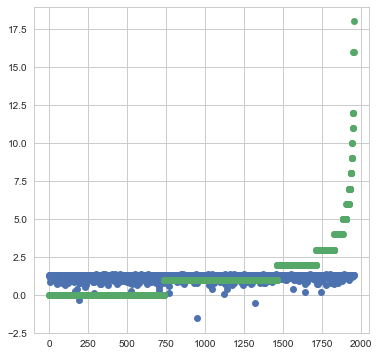

In [74]:
y =  np.array(df_threads['tail'].values)
X = X_sum_w2v_tfidf.copy()
X_pca = PCA(n_components = 3).fit_transform(X_sum_w2v_tfidf)
regression_model(X_pca, y, alpha=0.1)

In [279]:
X_pca2 = PCA(n_components = 3).fit_transform(X_sum_w2v_tfidffidf)

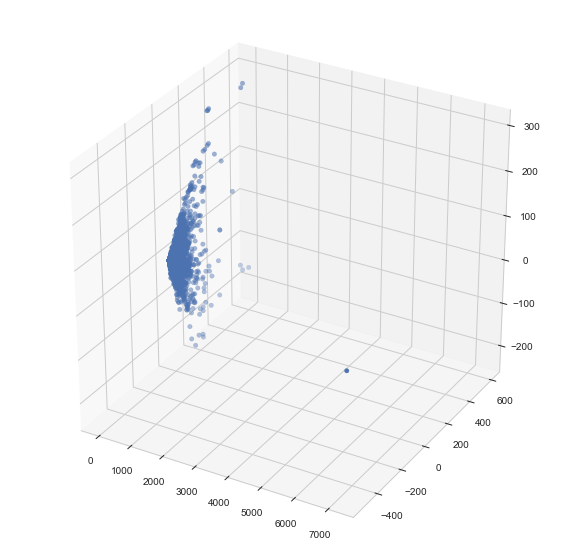

In [280]:
X = X_pca2[:, 0]
Y = X_pca2[:, 1]
Z = X_pca2[:, 2]
fig = plt.figure(figsize=(10, 10))
ax = fig.gca(projection='3d')

ax.scatter(X, Y, Z)

In [282]:
df_pca2 = pd.DataFrame(X_pca2)
df_pca2['labels'] = labels
df_pca2.to_csv('df_pca2.csv')

In [38]:
def mean_word_vector(sentence):
    vector = []
    words = sentence
    for word in words:
        vector.append(np.mean(model.wv.word_vec(word)))
    return vector

def multiply_mean_w2v_tfidf(sentence, tfidf_vector, features_tfidf):
    sentence = np.unique(sentence)
    sentence_copy = sentence.copy()
    for word in sentence_copy:
        if word not in features_tfidf:
            sentence = sentence.remove(word)
            
    mean_w2v_sentence = mean_word_vector(sentence)
    tfidf_vector_nonzero_index = list(tfidf_vector.nonzero()[0])
    
    tfidf_vector = np.array(tfidf_vector)
    tfidf_vector[tfidf_vector_nonzero_index] = np.array(tfidf_vector[tfidf_vector_nonzero_index]*mean_w2v_sentence)
    
    return tfidf_vector

In [39]:
dict_w2v_mean_word = {}
for word in features_tfidf:
    dict_w2v_mean_word[word] = np.mean(model.wv.word_vec(word))
    
vect_w2v_features = np.array(list(dict_w2v_mean_word.values()))

In [40]:
X_word2vec_tfidf = []
for tfidf_vect in X_tfidf:
    tfidf_vector_nonzero_index = list(tfidf_vect.nonzero()[0])
    vect_new = np.array(tfidf_vect.copy())
    vect_new[tfidf_vector_nonzero_index] = np.array(tfidf_vect[tfidf_vector_nonzero_index]*vect_w2v_features[tfidf_vector_nonzero_index])
    X_word2vec_tfidf.append(vect_new)

In [52]:
def classification_model(X, y, C, Y = False):
    data_train, data_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state = 1)
    X_train = data_train
    X_test = data_test

    model = LogisticRegression(C = C, penalty='l1', random_state=True)
    y_pred = model.fit(X_train, y_train).predict(X_test)
    coef = model.coef_
    score = metrics.accuracy_score(y_test, y_pred)
    print('score', score)

    print(classification_report(y_test, y_pred))

    print('cross_validation_score', cross_val_score(LogisticRegression(penalty='l1', C = C, intercept_scaling=1, 
                                                            random_state = True), X, y, cv=4, scoring='accuracy').mean())
    if Y:
        return (y_pred, y_test)
    
    
def regression_model(X, y, alpha):
    data_train, data_test, y_train, y_test = train_test_split(X, y , test_size=0.25, random_state = True)
    X_train = data_train
    X_test = data_test

    reg = Ridge(alpha=alpha)
    y_reg = reg.fit(X_train, y_train).predict(X_test)
    coef = reg.coef_
    print(metrics.mean_squared_error(y_test, y_reg))

    figure(figsize=(6, 6))
    df_score = pd.DataFrame()
    df_score['y_test'] = y_test 
    df_score['y_pred'] = y_reg
    df_score = df_score.sort_values(by = 'y_test')
    plt.plot(range(len(df_score)), df_score['y_pred'], '-', linewidth=2.0)
    plt.plot(range(len(df_score)), df_score['y_test'], '-', linewidth=4.0)
    
    print('cross_validation_score', cross_val_score(Ridge(alpha=alpha), 
                                                    X, y, cv=4, scoring='mean_squared_error').mean())

#### Исследование зависимости текста и объема сообщения

In [ ]:
df_threads['volum_message'] = df_threads['clean_content'].apply(lambda x: len(x))

#### Исследование зависимости текста и времени ответа на сообщение